In [1]:
%matplotlib widget
%load_ext autoreload
%autoreload 2

In [1]:
import spikeforest as sf
import spikeinterface.full as si
import spikeinterface.widgets as sw
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import signal
from sklearn.linear_model import LinearRegression
import yaml
import notebook_helper as helper
import spikeinterface.qualitymetrics as qm
import spikeinterface.sortingcomponents.peak_detection as scpd

from cdlgr.dataset.dataset import get_dataset

## Data overview



### Synthetic dataset

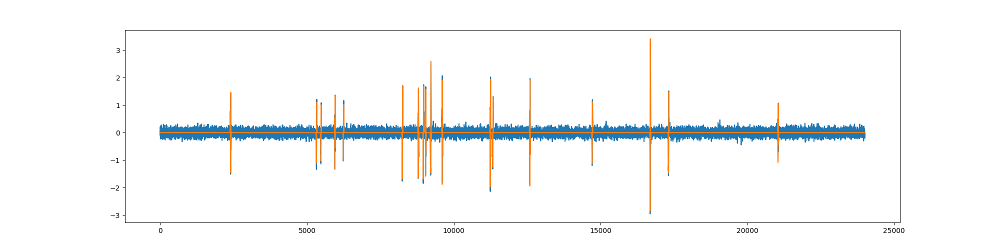

In [3]:
dataset_synth = helper.load_dataset("synth_default_dataset")

#### Signal visualization

Let's visualize the signal.

In [561]:
sw.plot_traces(dataset_synth.recording, time_range=[0, 10], backend='ipywidgets')

AppLayout(children=(TimeSlider(children=(Dropdown(description='segment', options=(0,), value=0), Button(icon='…

In [562]:
print("Y-scale present?", dataset_synth.recording.has_scaled())

Y-scale present? False


#### Denoising

In [563]:
print("Noise (median absolute deviation)", si.get_noise_levels(dataset_synth.recording, return_scaled=False, chunk_size=10000))

Noise (median absolute deviation) [0.10436313]


No common noise removal because only one channel. Not that in practice this signal will not be denoised, as the SNR is set manually to assess the robustness of the algorithm to random noise.

#### Spectrogram and FFT

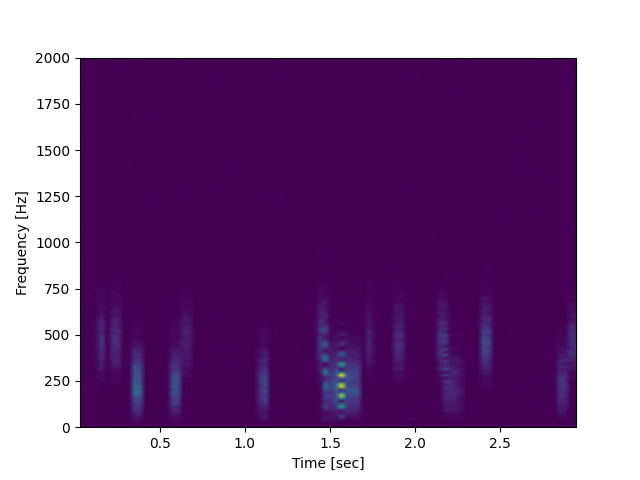

In [564]:
f, t, Sxx = helper.get_spectrogram(dataset_synth.recording, 30000)
plt.figure()
plt.pcolormesh(t, f, Sxx, shading='gouraud')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.ylim(0, 2000)
plt.show()

8000
(24000, 1) (24000,)


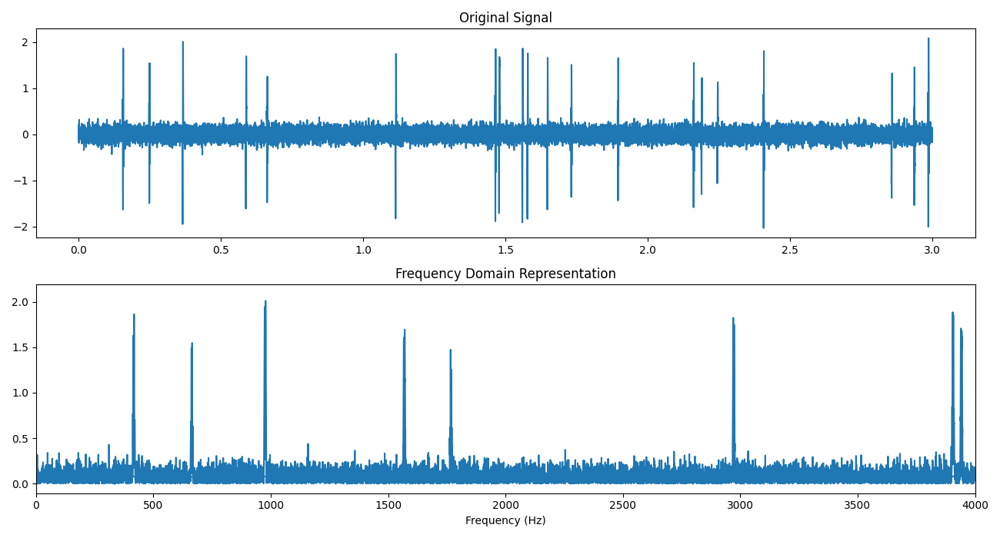

In [567]:
helper.fft_rec(dataset_synth.recording, 24000, freq_lim=4000)

#### Waveforms

extract waveforms shared_memory multi buffer:   0%|          | 0/3 [00:00<?, ?it/s]

Setting 'return_scaled' to False


extract waveforms shared_memory multi buffer:   0%|          | 0/3 [00:00<?, ?it/s]

AppLayout(children=(UnitSelector(children=(Label(value='Units', layout=Layout(justify_content='center')), Sele…

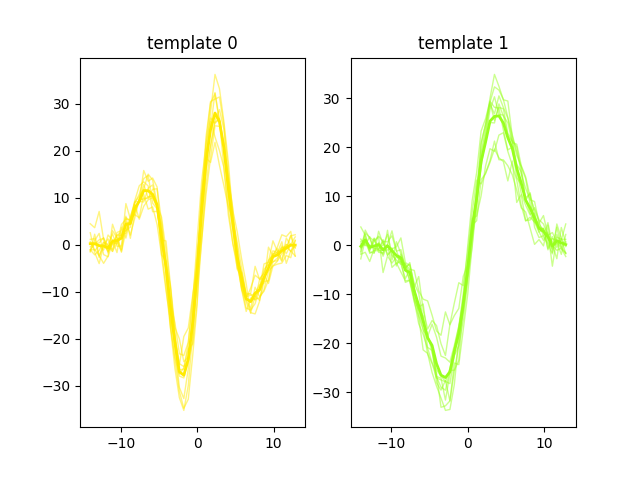

In [568]:
plt.close('all')
waveforms = si.extract_waveforms(dataset_synth.recording, dataset_synth.sorting_true, max_spikes_per_unit=2500, mode="memory", ms_before=3, ms_after=3)
w = sw.plot_spikes_on_traces(waveform_extractor=waveforms, backend="ipywidgets")
sw.plot_unit_waveforms(waveforms)

In [22]:
snrs = qm.compute_snrs(waveforms)
print("SNR (dB)", 20*np.log10(snrs[1]))

SNR (dB) 23.531372666551526


We can compare these waveforms extracted from the signal with the true functions used to generate the signal:

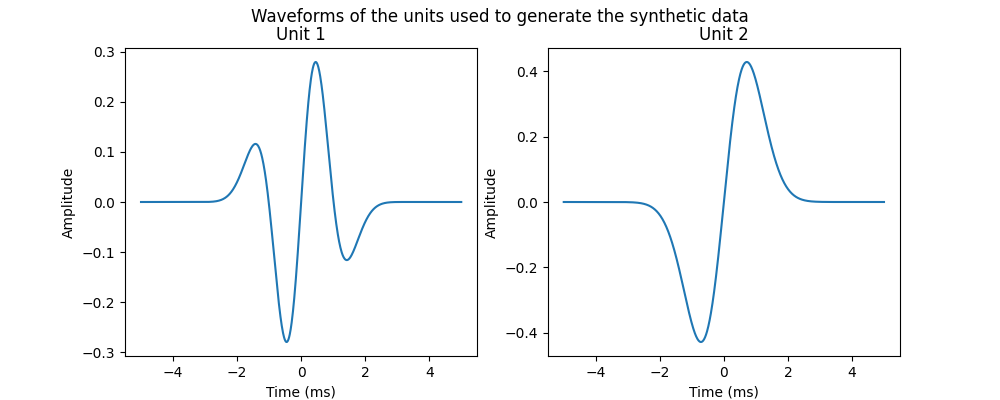

In [577]:
filter_length = 10.125  # Fitler length in ms
factor = 10/filter_length
units = [
    lambda x: (factor*x)*np.exp(-(factor*x)**2)*np.cos(2*np.pi*(factor*x)/4),
    lambda x: (factor*x)*np.exp(-(factor*x)**2)
]

times = np.linspace(-5, 5, 1000)
fig, axes = plt.subplots(1, 2, figsize=(10, 4))
for i in range(len(units)):
    axes[i].plot(times, units[i](times))
    axes[i].set_xlabel("Time (ms)")
    axes[i].set_ylabel("Amplitude")
    axes[i].set_title(f"Unit {i+1}")
fig.suptitle("Waveforms of the units used to generate the synthetic data")
plt.show()


### Real dataset

First, we need to retrieve the dataset. Here we do not use the function we did so that we can understand the different operations performed.

In [9]:
dataset_real = helper.load_dataset("default_dataset")

Loading file from kachery cloud: sha1://1d343ed7e876ffd73bd8e0daf3b8a2c4265b783c?spikeforest-recordings.json
Loading file from kachery cloud: sha1://8cf175ddeccafebef4a1244521d4ae16386cb495?label=raw.mda
Loading file from kachery cloud: sha1://a1d7718979fcc1e3e1cb2df8f37486758dcd58ff?label=firings_true.mda


You must have set up kachery-cloud (see [here](https://github.com/flatironinstitute/kachery-cloud?tab=readme-ov-file#installation-and-setup)).

In [11]:
sw.plot_traces(dataset_real.recording, time_range=[0, 10], channel_ids=[18],backend='ipywidgets')

AppLayout(children=(TimeSlider(children=(Dropdown(description='segment', options=(0,), value=0), Button(icon='…

In [25]:
print(dataset_real.recording.has_scaled())

False


No scaled traces so we cannot have a unit for the y-axis.

#### Stationarity and ergodicity

Given the many spikes, the signal is not stationary and ergodic, but it seems that the background noise is quite stationary over time, which would allow us some basic preprocessing. The use of the median instead of the mean for statistics will make us more robust towards the spiking outliers.

#### Denoising

In [26]:
print(si.get_noise_levels(dataset_real.recording, return_scaled=False, chunk_size=10000)[18])

38.54765768114565


In [10]:
recording_denoised = si.common_reference(dataset_real.recording, reference='global')
print(si.get_noise_levels(recording_denoised, return_scaled=False, chunk_size=10000)[18])

37.065055462640046


In [11]:
recording = recording_denoised.channel_slice([18])

#### Spectrogram and FFT

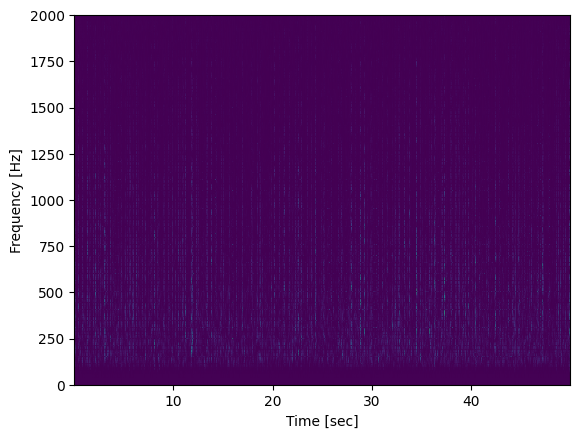

In [77]:
plt.close('all')
f, t, Sxx = signal.spectrogram(recording.get_traces(end_frame=100000).flatten(), recording.get_sampling_frequency(),
                               nperseg=1024, noverlap=1024 - 100, window=('tukey', 0.25))
plt.pcolormesh(t, f, Sxx, shading='gouraud')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.ylim(0, 2000)
plt.show()

Even if the random peaks make the signal non stationary, it can be interesting to compute the FFT to check there is no systematic background noise like for instance some electric resonance around 60 Hz. We can use FFT because we assume there is no abrupt change in the timeseries, except spikes.

In [30]:
print(recording.is_filtered())

False


Text(0.5, 1.0, 'Original Signal')

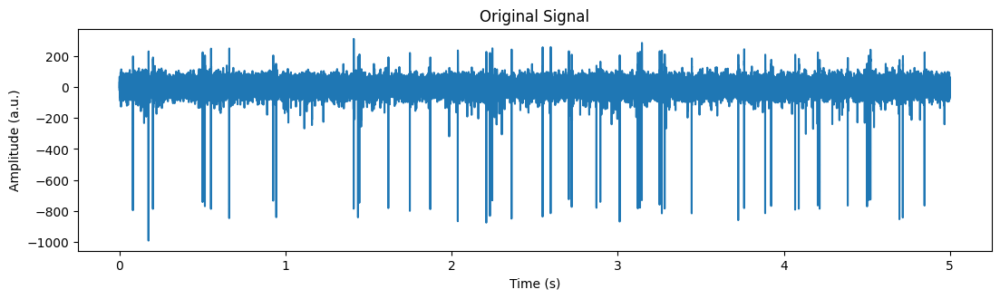

In [81]:
tr = recording.get_traces(end_frame=100000)
fs = recording.get_sampling_frequency()
t = np.arange(0, len(tr))/fs

# Plot the original signal and its frequency domain representation
plt.figure(figsize=(13, 7))
plt.subplot(2, 1, 1)
plt.plot(t, tr)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (a.u.)')
plt.title('Original Signal')

20000.0
(100000, 1) (100000,)


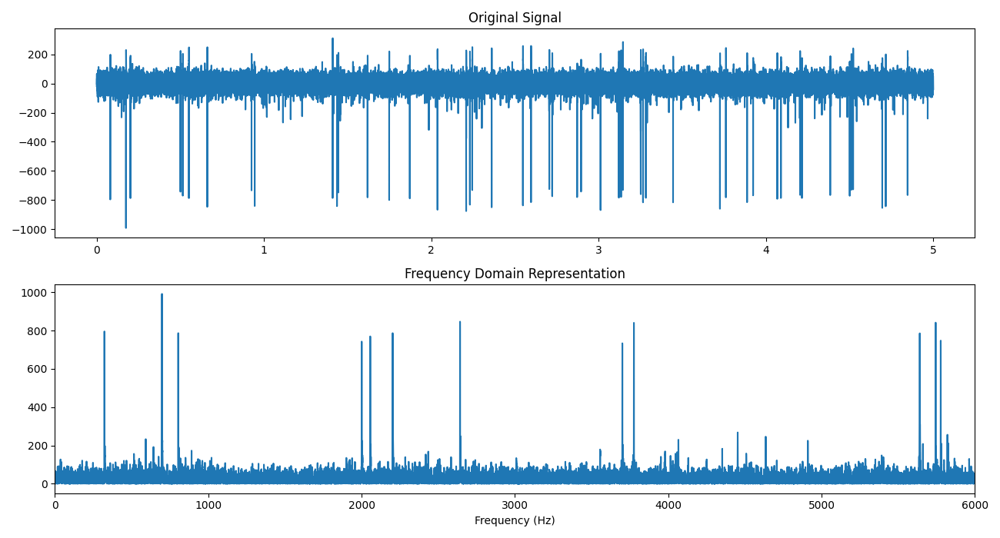

In [31]:
helper.fft_rec(recording)

We filter the signal to keep only the high-frequency components corresponding to the spikes.

20000.0
(100000, 1) (100000,)


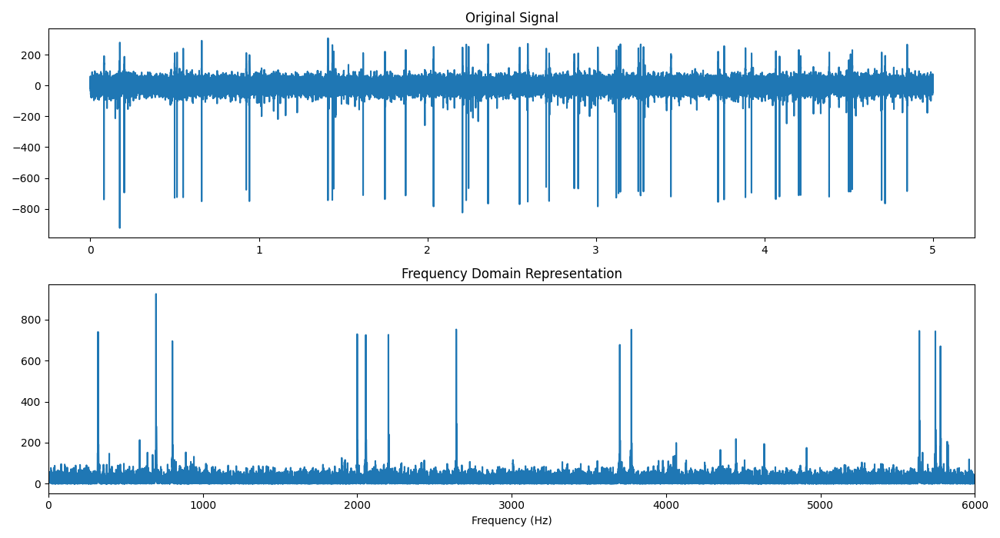

In [32]:
recording_filt = si.bandpass_filter(recording, 300, 6000)
helper.fft_rec(recording_filt)

In fact, contrary to what the recording object indicates, it has already been filtered.

In [24]:
recording.annotate(is_filtered=True)

Plotting autocorrelation does not make a lot of sense here.

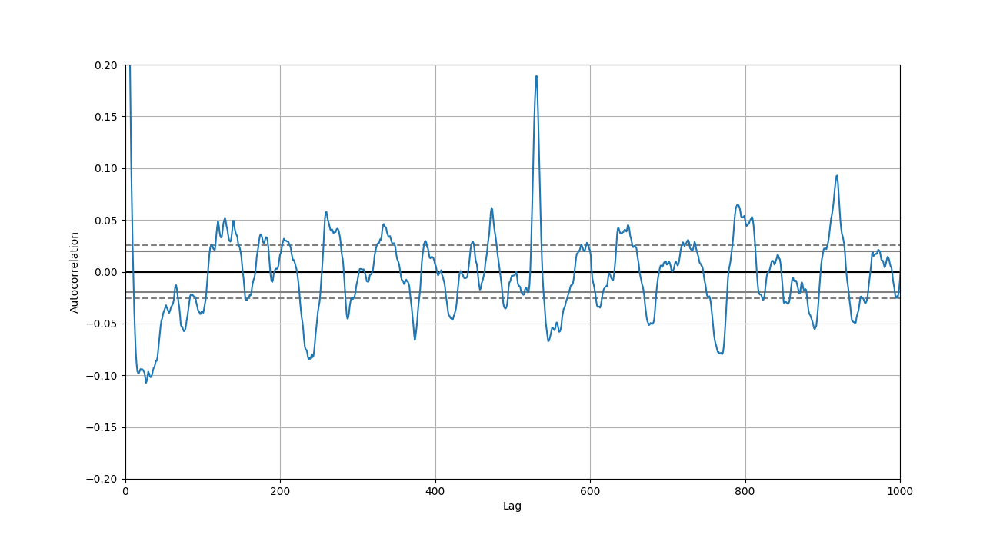

In [34]:
plt.figure(figsize=(13, 7))
pd.plotting.autocorrelation_plot(recording.get_traces(end_frame=10000))
plt.ylim(-0.2, 0.2)
plt.xlim(0, 1000)
plt.show()

#### Detrending

We check if there is no major trend in the signal, even though it does not seem so

Coefficients: [[-0.00093171]]


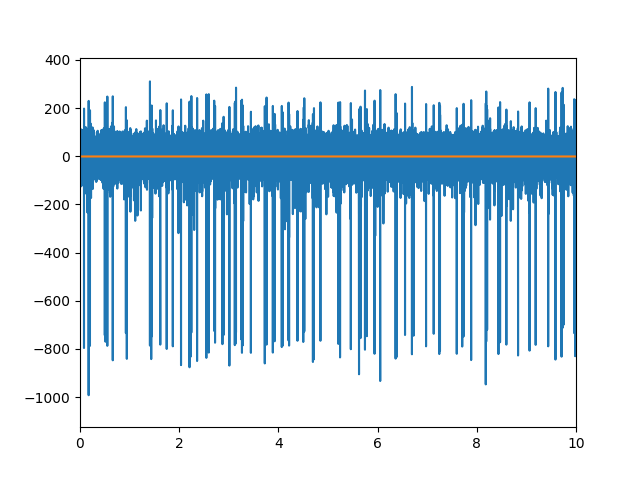

In [36]:
traces = recording.get_traces()
times = np.arange(len(traces)) / recording.get_sampling_frequency()
times = times.reshape((-1, 1))
model = LinearRegression()
model.fit(times, traces)
print('Coefficients: %s' % model.coef_)
# calculate trend
trend = model.predict(times)
# plot trend
plt.figure()
plt.plot(times, traces)
plt.plot(times, trend)
plt.xlim(0, 10)
plt.show()

#### Spikes waveforms

In [25]:
waveforms = si.extract_waveforms(recording, dataset_real.sorting_true, max_spikes_per_unit=2500, mode="memory")


Setting 'return_scaled' to False


In [38]:
w = sw.plot_spikes_on_traces(waveform_extractor=waveforms, backend="ipywidgets")

AppLayout(children=(UnitSelector(children=(Label(value='Units', layout=Layout(justify_content='center')), Sele…

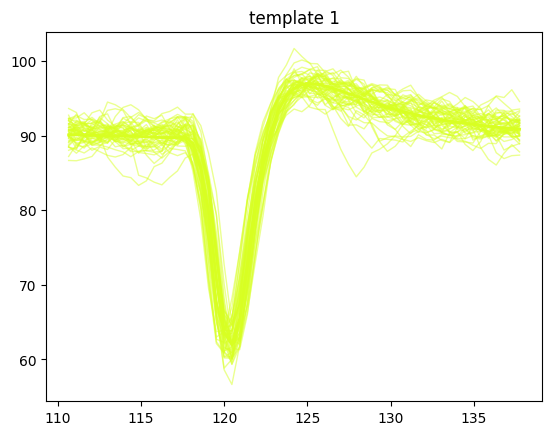

In [85]:
sw.plot_unit_waveforms(waveforms)

(905, 60, 1)


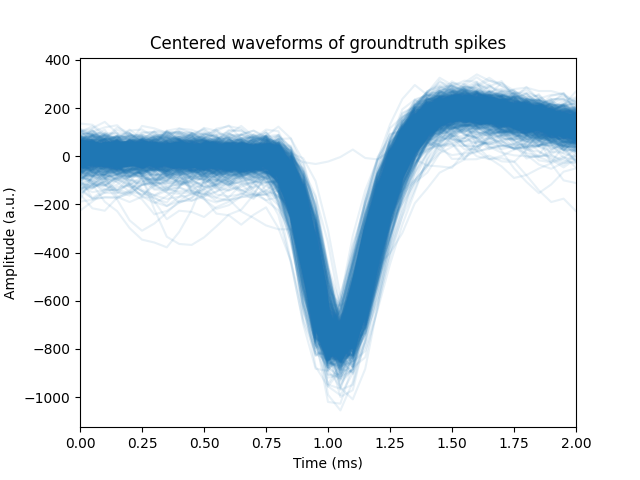

In [28]:
plt.close('all')
templates = waveforms.get_waveforms(unit_id=1)
print(templates.shape)
times = np.arange(templates.shape[1]) / recording.get_sampling_frequency() * 1000
for i in range(templates.shape[0]):
    plt.plot(times, templates[i, :, :].flatten(), color='tab:blue', alpha=0.1)
plt.xlim(0, 2)
plt.xlabel('Time (ms)')
plt.ylabel('Amplitude (a.u.)')
plt.title('Centered waveforms of groundtruth spikes')
plt.show()

In [16]:
peaks = scpd.detect_peaks(recording, detect_threshold=5)
peaks = pd.DataFrame(peaks)
# peaks = peaks[peaks["channel_index"] == 18]   

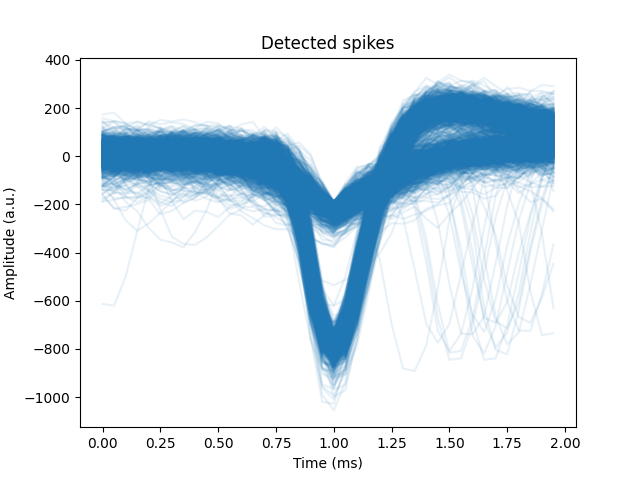

In [29]:
plt.close('all')
size = 20
times = np.arange(2*size) / recording.get_sampling_frequency() * 1000
for i, (_, peak) in enumerate(peaks.iterrows()):
    peak_idx = int(peak["sample_index"])
    plt.plot(times, recording.get_traces(start_frame=peak_idx-size, end_frame=peak_idx+size).flatten(), color='tab:blue', alpha=0.1)
plt.xlabel('Time (ms)')
plt.ylabel('Amplitude (a.u.)')
plt.title('Detected spikes')
plt.show()

In [40]:
snrs = qm.compute_snrs(waveforms)
print("SNR (dB)", 20*np.log10(snrs[1]))

SNR (dB) 26.44732758005682


## Experiments

To run an experiment, you can run ``!ssrun [params]`` in a notebook cell. The parameters allow you to select a pre-defined configuration in ``cdlgr/config`` or to override a predefined config with ``field.subfield=value``.

For example, a typical run is instantiated by ``!ssrun dataset={dataset} model={model} experiment={experiment} output.verbose={verbose} output.plot={plot level}``, where:
- ``{dataset}`` should be replaced by the desired dataset, either synthetic or real (see configs in ``cdlgr/config/dataset``)
- ``{model}`` should be replaced by the desired model configuration (see configs in ``cdlgr/config/model``)
- ``{experiment}`` should be replaced with the experiment number used to name the folder in which the results will be stored
- ``{verbose}`` is one of {0, 1, 2} and sets the level of details in the log 
- ``{plot level}`` is one of {0, 1, 2} and sets the amount of plotted figures stored in the results folder. 

The results will be stored in ``outputs/{type of experiment}/{type of launch}/interp_{num_elements}_{interpolation}/seed_{seed}``, where:
- ``{type of experiment}`` designates either the real dataset or the synthetic one
- ``{type of launch}`` is one of ``simple`` or ``multirun`` (see below)
- ``{num_elements}`` is the number of elements (_i.e._ sources)
- ``{interpolation}`` is the number of subdivisions of a sample of the original grid used for refinement
- ``{seed}`` is the random seed used for the exerpiment

Last, an experiment can be run one at a time (``!ssrun``), or multiple instances of an experiment can be run at once (``!ssrun --multirun``) to compare the results or several runs.

For information on the config parameters, see the files in ``cdlgr/config``. In what follows, experiments are run using the corresponding config files.

### Synthetic dataset

Each experiment varies a specific parameter for the algorithm. Briefly:
- Experiments 1, 2, 3 and 4 assess different intializations for the dictionary
- Experiments 5 tries a different number of templates in the dictionary
- Experiments 6 tries a different signal-to-noise ratio
- Experiments 7 tries a different segment size 
- Experiment 8 tries a different interpolator

The default configuration for the experiments is available in ``cdlgr/config/dataset/synth_default_dataset`` and ``cdlgr/config/dataset/synth_default_model``.

Each experiment is launched once with detailed outputs, and 5 times with few outputs and averaged results.

In [2]:
%matplotlib inline

#### Experiment 1

The dictionary is initialized with random noise.

In [5]:
experiment = 1

In [17]:
# Single run with interpolation
!ssrun dataset=synth_dataset_exp$experiment model=synth_model_exp$experiment experiment=$experiment


experiment: 1
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: synth
  name: synthetic
  recording: synthetic
  uri: null
  tstart_s: null
  tstop_s: null
  duration_s: null
  tstart_test_s: null
  tstop_test_s: null
  channel: 0
  detect_threshold: 5
  preprocess: false
  preprocess_params:
    freq_min: null
    freq_max: null
  window:
    split: true
    window_size_s: 0.015
  sources:
    num: 2
    length_ms: 10.125
  gen:
    seed: 11
    noise: 0.1
    amps:
    - 1
    - 2
    numOfEvents: 10
    T: 3
  fs: 8000
model:
  dictionary:
    num_elements: 2
    element_length_ms: 10.125
    init_templates: random
    real_random_noise: 0.2
    real_offset_ms: 0.5
  cdl:
    num_iterations: 10
    interpolate: 10
    sparsity_tol: 1
    sparsity_tol_test: 25
    rel_amp_split_test: 0.6
    error_tol: 0.01
    interpolator_type: sinc
    permute_templates: true

Working directory


extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

detect peaks using by_channel: 100%|##########| 3/3 [00:00<00:00, 3176.70it/s]

0it [00:00, ?it/s]
20it [00:00, 957.61it/s]

100%|██████████| 20/20 [00:00<00:00, 62.22it/s]

100%|██████████| 20/20 [00:00<00:00, 66.54it/s]

100%|██████████| 20/20 [00:00<00:00, 66.33it/s]

100%|██████████| 20/20 [00:00<00:00, 66.90it/s]
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\outputs\plot.py:126: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,5))

100%|██████████| 20/20 [00:00<00:00, 68.52it/s]

100%|██████████| 20/20 [00:00<00:00, 66.

Initial dictionary:


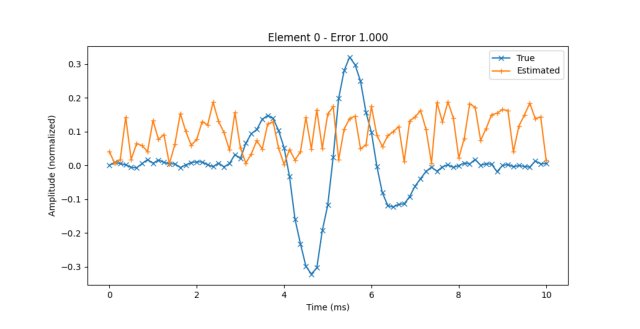

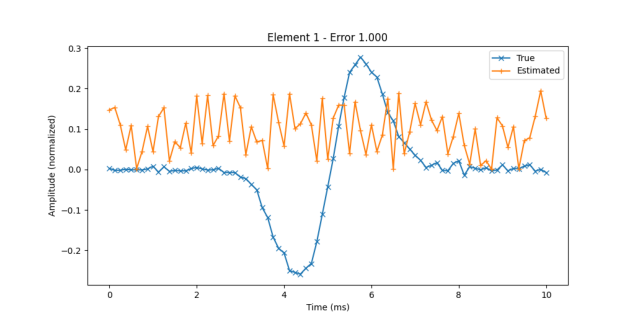

Final dictionary (shifted and interpolated truth):


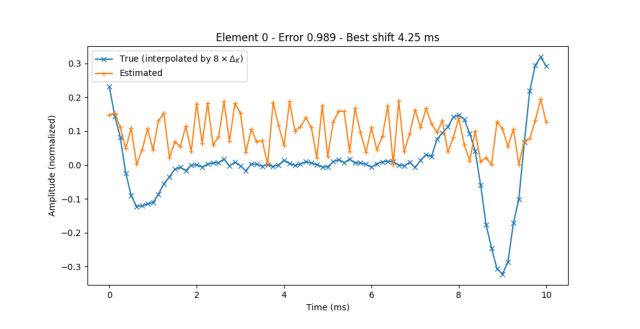

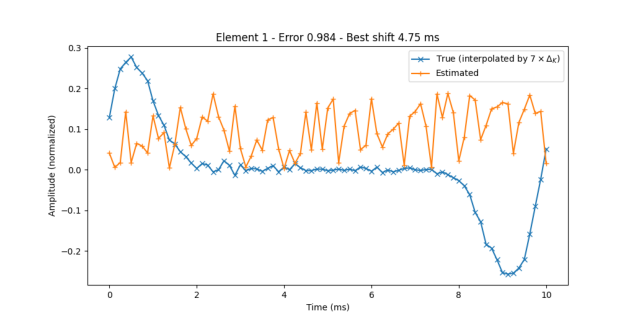

True positive on test set:


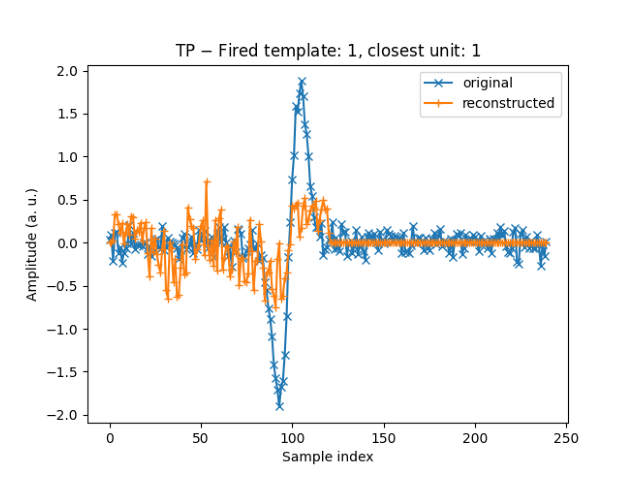

False positive on test set:


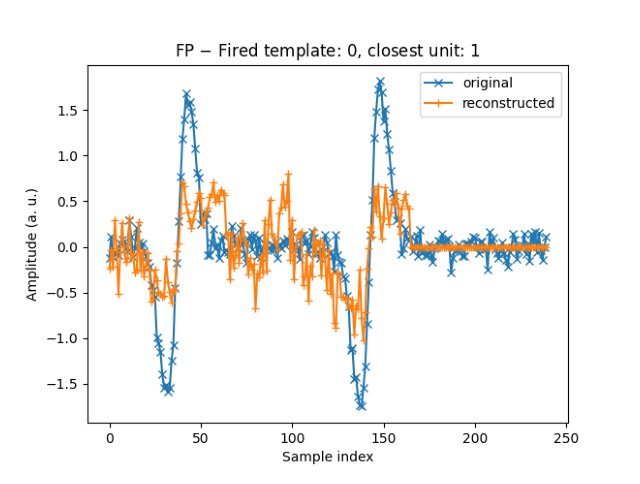

Confusion matrix:


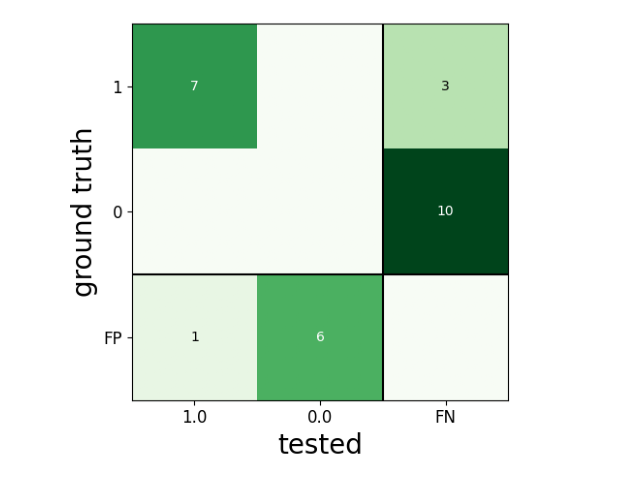

Time:


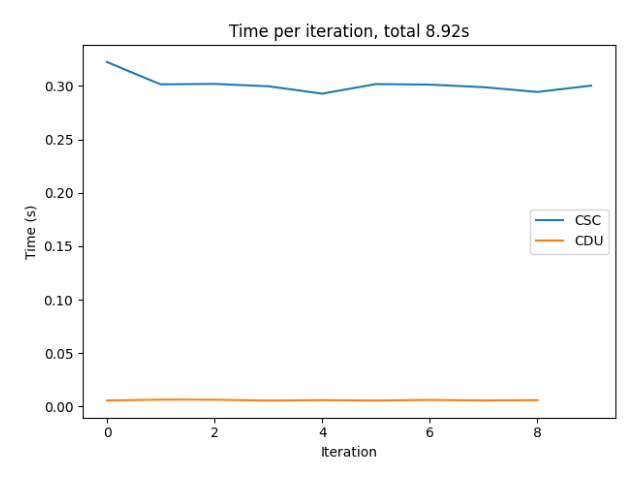

In [7]:
path = f"outputs/synth_experiments/experiment_{experiment}/single/interp_2_10/seed_{experiment+10}"
helper.show_plots(path)

In [21]:
# Single run without interpolation
!ssrun dataset=synth_dataset_exp$experiment model=synth_model_exp$experiment experiment=$experiment model.cdl.interpolate=0


experiment: 1
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: synth
  name: synthetic
  recording: synthetic
  uri: null
  tstart_s: null
  tstop_s: null
  duration_s: null
  tstart_test_s: null
  tstop_test_s: null
  channel: 0
  detect_threshold: 5
  preprocess: false
  preprocess_params:
    freq_min: null
    freq_max: null
  window:
    split: true
    window_size_s: 0.015
  sources:
    num: 2
    length_ms: 10.125
  gen:
    seed: 11
    noise: 0.1
    amps:
    - 1
    - 2
    numOfEvents: 10
    T: 3
  fs: 8000
model:
  dictionary:
    num_elements: 2
    element_length_ms: 10.125
    init_templates: random
    real_random_noise: 0.2
    real_offset_ms: 0.5
  cdl:
    num_iterations: 10
    interpolate: 0
    sparsity_tol: 1
    sparsity_tol_test: 25
    rel_amp_split_test: 0.6
    error_tol: 0.01
    interpolator_type: sinc
    permute_templates: true

Working directory 


extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

detect peaks using by_channel: 100%|##########| 3/3 [00:00<00:00, 2896.62it/s]

0it [00:00, ?it/s]
20it [00:00, 1075.31it/s]

100%|██████████| 20/20 [00:00<00:00, 580.45it/s]

100%|██████████| 20/20 [00:00<00:00, 669.11it/s]

100%|██████████| 20/20 [00:00<00:00, 678.12it/s]

100%|██████████| 20/20 [00:00<00:00, 675.87it/s]
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\outputs\plot.py:126: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,5))

100%|██████████| 20/20 [00:00<00:00, 664.38it/s]

100%|██████████| 20/20 [00:00<00:0

Initial dictionary:


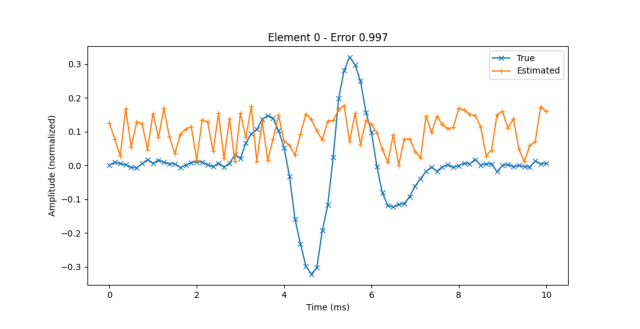

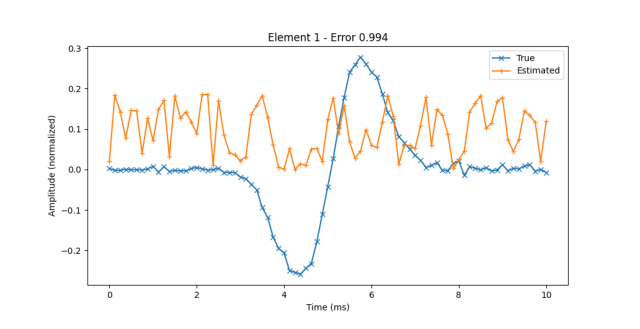

Final dictionary (shifted and interpolated truth):


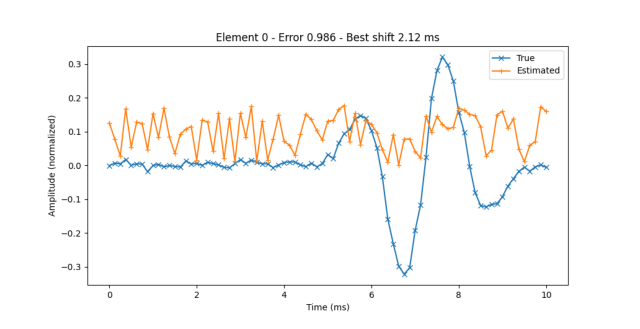

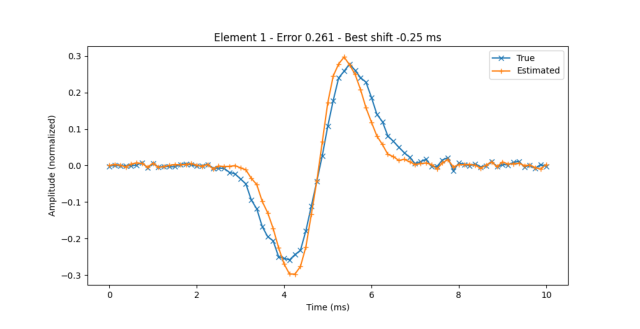

True positive on test set:


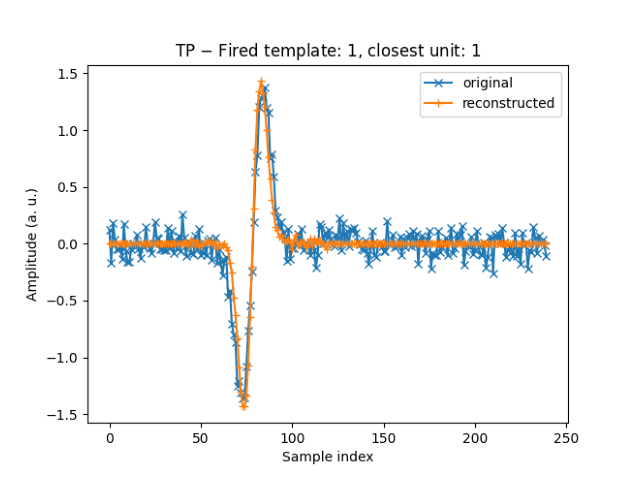

False positive on test set:


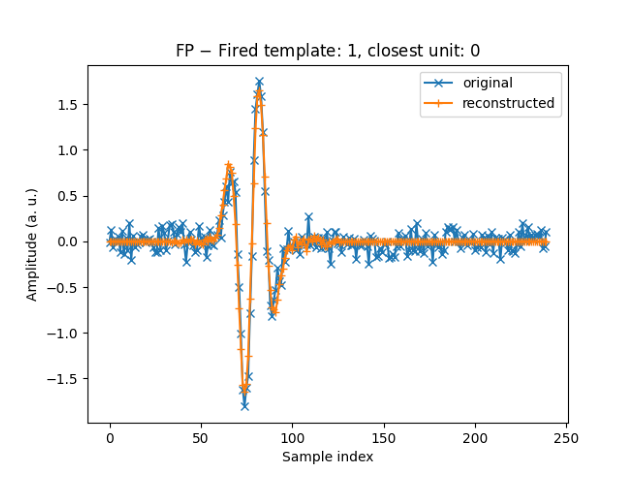

Confusion matrix:


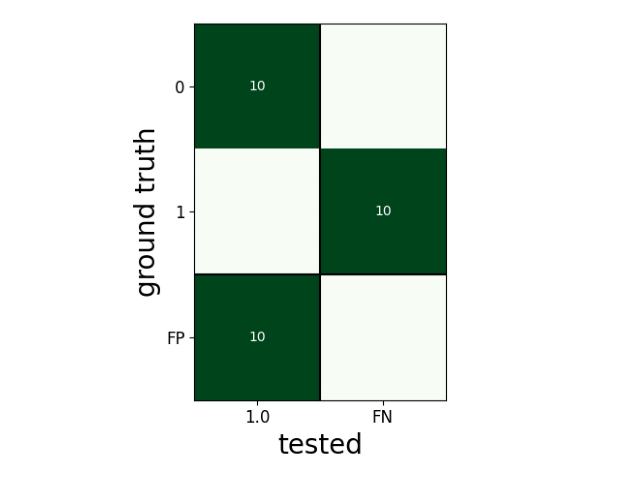

Time:


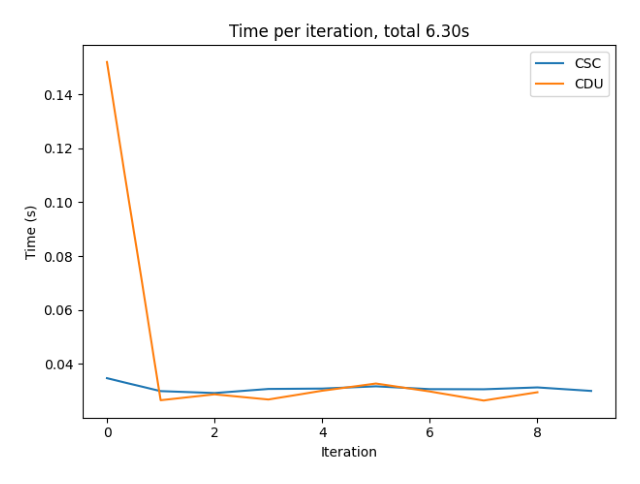

In [22]:
path = f"outputs/synth_experiments/experiment_{experiment}/single/interp_2_0/seed_{experiment+10}"
helper.show_plots(path)

In [14]:
# Run on multiple seeds
!ssrun --multirun dataset=synth_dataset_exp$experiment model=synth_model_exp$experiment experiment=$experiment dataset.gen.seed=range(1,6) model.cdl.interpolate=0,10 output.verbose=0 output.plot=1

[2024-01-08 09:37:24,385][HYDRA] Launching 10 jobs locally
[2024-01-08 09:37:24,385][HYDRA] 	#0 : dataset=synth_dataset_exp1 model=synth_model_exp1 experiment=1 dataset.gen.seed=1 model.cdl.interpolate=0 output.verbose=0 output.plot=1
Figure(2000x500)
Setting 'return_scaled' to False
[0.99450228 0.9896132 ]
[0.98914228 0.99181323]
[0.98914228 0.99181323]
[0.99450228 0.9896132 ]
[0.98914228 0.99181323]
[0.99450228 0.9896132 ]
[0.98914228 0.99181323]
[0.99450228 0.9896132 ]
[0.98914228 0.99181323]
[0.99450228 0.9896132 ]
[0.98914228 0.99181323]
[0.99450228 0.9896132 ]
[0.98914228 0.99181323]
[0.99450228 0.9896132 ]
[0.98914228 0.99181323]
[0.99450228 0.9896132 ]
[0.98914228 0.99181323]
[0.99450228 0.9896132 ]
[0.98914228 0.99181323]
[0.99450228 0.9896132 ]
[2024-01-08 09:37:27,929][HYDRA] 	#1 : dataset=synth_dataset_exp1 model=synth_model_exp1 experiment=1 dataset.gen.seed=1 model.cdl.interpolate=10 output.verbose=0 output.plot=1
Figure(1000x500)
Figure(640x480)
Figure(640x480)
Figure(10


extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

detect peaks using by_channel: 100%|##########| 3/3 [00:00<?, ?it/s]
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\model\cdl.py:399: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_spike_sorting["diff"] = diffs_norm
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\model\cdl.py:399: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-

In [28]:
helper.report_multi_run_results(experiment)

Averaged accuracy:
interpolation: 0
unit 0: 0.000 +/- 0.000
unit 1: 0.235 +/- 0.289
Overall: 0.117 +/- 0.236

interpolation: 10
unit 0: 0.000 +/- 0.000
unit 1: 0.302 +/- 0.382
Overall: 0.151 +/- 0.310


--------------------------
Averaged precision:
interpolation: 0
unit 0: 0.000 +/- 0.000
unit 1: 0.315 +/- 0.390
Overall: 0.158 +/- 0.317

interpolation: 10
unit 0: 0.000 +/- 0.000
unit 1: 0.310 +/- 0.389
Overall: 0.155 +/- 0.316


--------------------------
Averaged recall:
interpolation: 0
unit 0: 0.000 +/- 0.000
unit 1: 0.280 +/- 0.343
Overall: 0.140 +/- 0.280

interpolation: 10
unit 0: 0.000 +/- 0.000
unit 1: 0.380 +/- 0.466
Overall: 0.190 +/- 0.381


--------------------------
Averaged error and time offset by interpolation and unit:
interpolation: 0
unit 0:
	error: 0.835 +/- 0.315
	offset: 0.925 ms +/- 2.540 ms
unit 1:
	error: 0.993 +/- 0.001
	offset: -0.850 ms +/- 3.463 ms
Overall:
	error: 0.9140306708966133 +/- 0.23629732164054637
	offset: 0.0375 +/- 3.1637843241915213

interpola

**Observations**: The algorithm has a tendency to fit detected spikes with the composition of several (possibly noisy) templates. Furthermore, it has a tendency to reconstruct unit 0 by overlapping copies of unit 1, leading to bad accuracy on unit 0. Grid-refinement brings no significant improvement in this case.

#### Experiment 2

The dictionary is initialized with the real templates

In [29]:
experiment = 2

In [17]:
# Single run with interpolation
!ssrun dataset=synth_dataset_exp$experiment model=synth_model_exp$experiment experiment=$experiment


experiment: 2
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: synth
  name: synthetic
  recording: synthetic
  uri: null
  tstart_s: null
  tstop_s: null
  duration_s: null
  tstart_test_s: null
  tstop_test_s: null
  channel: 0
  detect_threshold: 5
  preprocess: false
  preprocess_params:
    freq_min: null
    freq_max: null
  window:
    split: true
    window_size_s: 0.015
  sources:
    num: 2
    length_ms: 10.125
  gen:
    seed: 12
    noise: 0.1
    amps:
    - 1
    - 2
    numOfEvents: 10
    T: 3
  fs: 8000
model:
  dictionary:
    num_elements: 2
    element_length_ms: 10.125
    init_templates: real
    real_random_noise: 0.2
    real_offset_ms: 0.5
  cdl:
    num_iterations: 10
    interpolate: 10
    sparsity_tol: 1
    sparsity_tol_test: 25
    rel_amp_split_test: 0.6
    error_tol: 0.01
    interpolator_type: sinc
    permute_templates: false

Working directory 


extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

detect peaks using by_channel: 100%|##########| 3/3 [00:00<?, ?it/s]

0it [00:00, ?it/s]
20it [00:00, 901.11it/s]
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\model\dictionary.py:137: RuntimeWarning: invalid value encountered in sqrt
  dist = np.sqrt(1-np.power(np.dot(np.roll(interpolated_gt,o),estimated_dict),2))

100%|██████████| 20/20 [00:00<00:00, 67.67it/s]

100%|██████████| 20/20 [00:00<00:00, 48.96it/s]

100%|██████████| 20/20 [00:00<00:00, 49.91it/s]

100%|██████████| 20/20 [00:00<00:00, 41.32it/s]
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\outputs\plot.py:126: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see 

Initial dictionary:


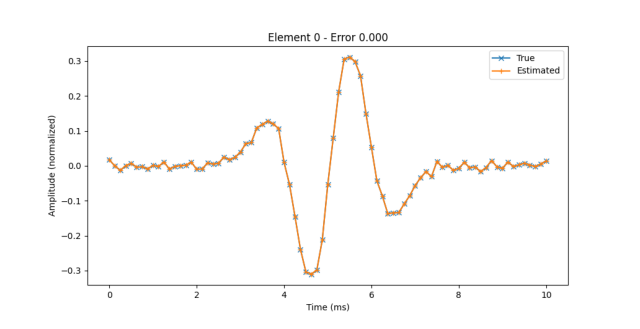

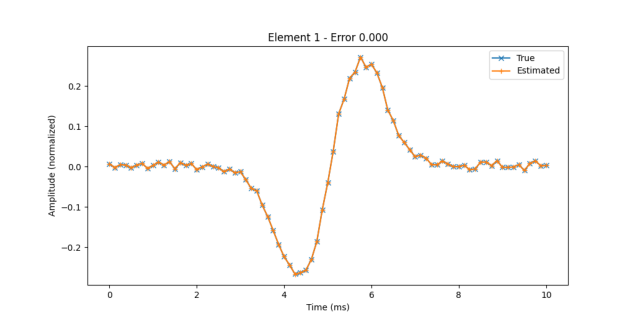

Final dictionary (shifted and interpolated truth):


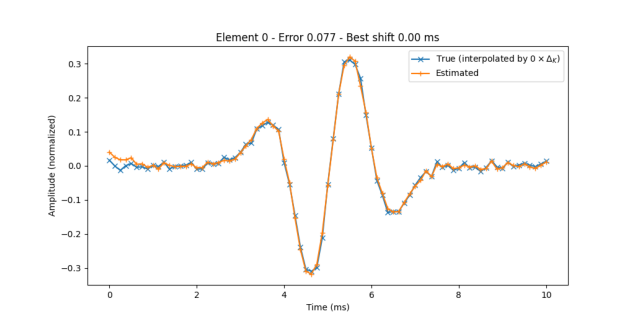

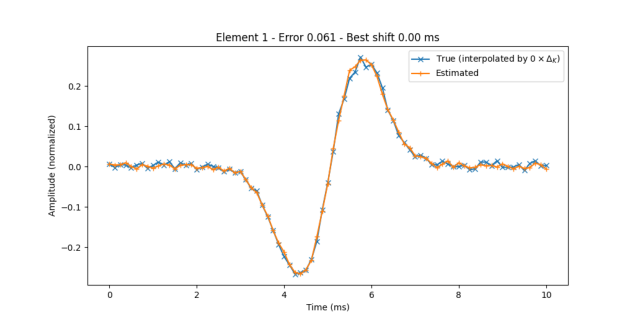

True positive on test set:


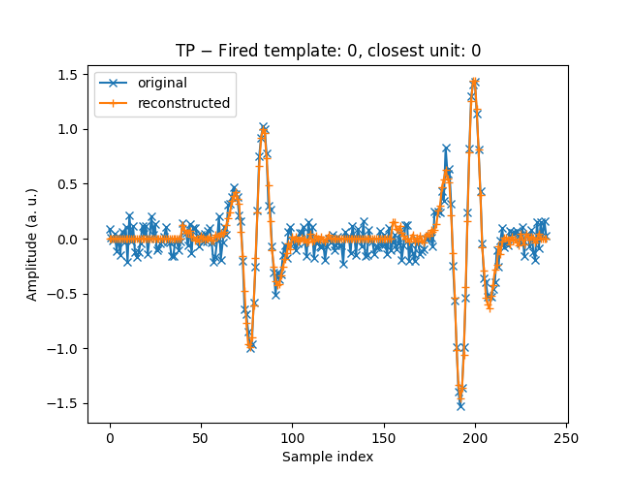

False positive on test set:


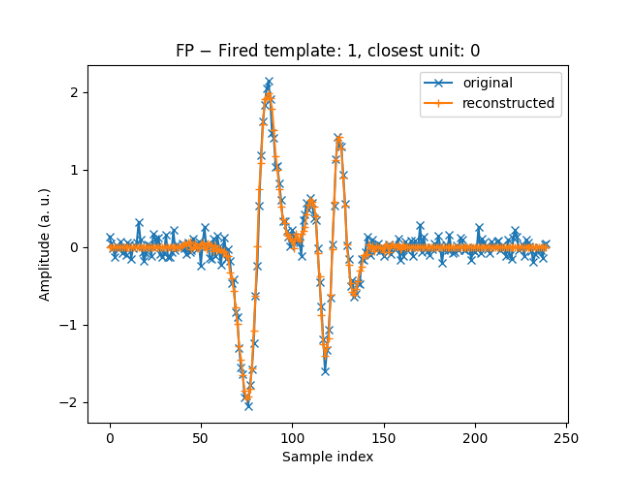

Confusion matrix:


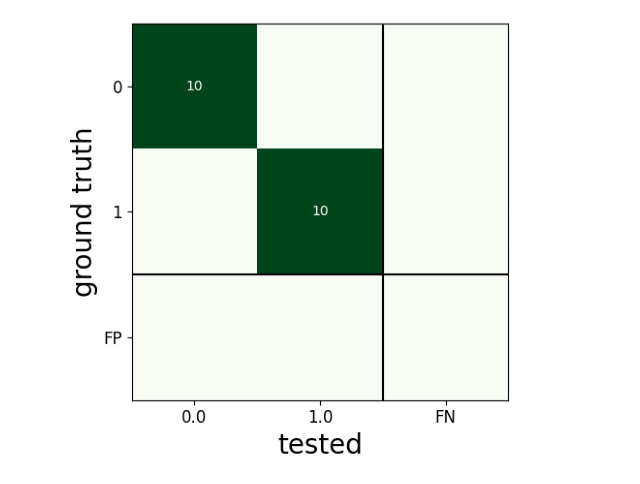

Time:


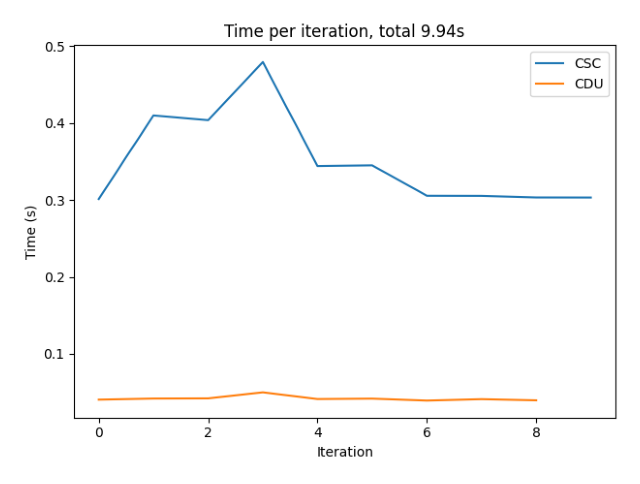

In [18]:
path = f"outputs/synth_experiments/experiment_{experiment}/single/interp_2_10/seed_{experiment+10}"
helper.show_plots(path)

In [19]:
# Single run without interpolation
!ssrun dataset=synth_dataset_exp$experiment model=synth_model_exp$experiment experiment=$experiment model.cdl.interpolate=0


experiment: 2
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: synth
  name: synthetic
  recording: synthetic
  uri: null
  tstart_s: null
  tstop_s: null
  duration_s: null
  tstart_test_s: null
  tstop_test_s: null
  channel: 0
  detect_threshold: 5
  preprocess: false
  preprocess_params:
    freq_min: null
    freq_max: null
  window:
    split: true
    window_size_s: 0.015
  sources:
    num: 2
    length_ms: 10.125
  gen:
    seed: 12
    noise: 0.1
    amps:
    - 1
    - 2
    numOfEvents: 10
    T: 3
  fs: 8000
model:
  dictionary:
    num_elements: 2
    element_length_ms: 10.125
    init_templates: real
    real_random_noise: 0.2
    real_offset_ms: 0.5
  cdl:
    num_iterations: 10
    interpolate: 0
    sparsity_tol: 1
    sparsity_tol_test: 25
    rel_amp_split_test: 0.6
    error_tol: 0.01
    interpolator_type: sinc
    permute_templates: false

Working directory :


extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<00:00, 3220.61it/s]

detect peaks using by_channel: 100%|##########| 3/3 [00:00<00:00, 2969.77it/s]

0it [00:00, ?it/s]
20it [00:00, 1372.91it/s]
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\model\dictionary.py:137: RuntimeWarning: invalid value encountered in sqrt
  dist = np.sqrt(1-np.power(np.dot(np.roll(interpolated_gt,o),estimated_dict),2))

100%|██████████| 20/20 [00:00<00:00, 684.83it/s]

100%|██████████| 20/20 [00:00<00:00, 580.06it/s]

100%|██████████| 20/20 [00:00<00:00, 649.75it/s]

100%|██████████| 20/20 [00:00<00:00, 570.91it/s]
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\outputs\plot.py:126: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To c

Initial dictionary:


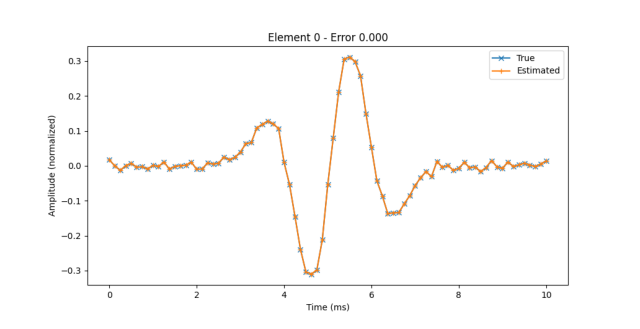

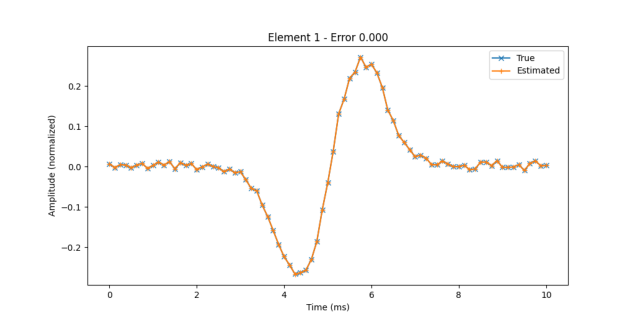

Final dictionary (shifted and interpolated truth):


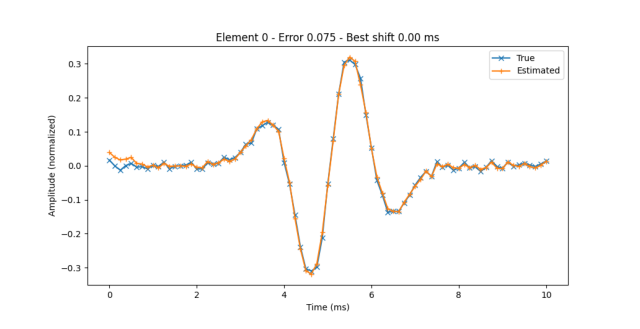

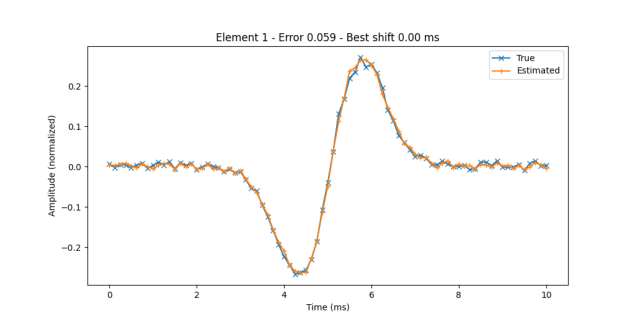

True positive on test set:


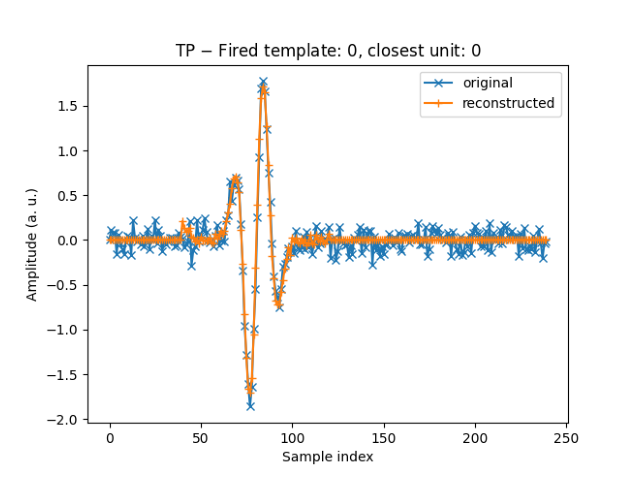

False positive on test set:


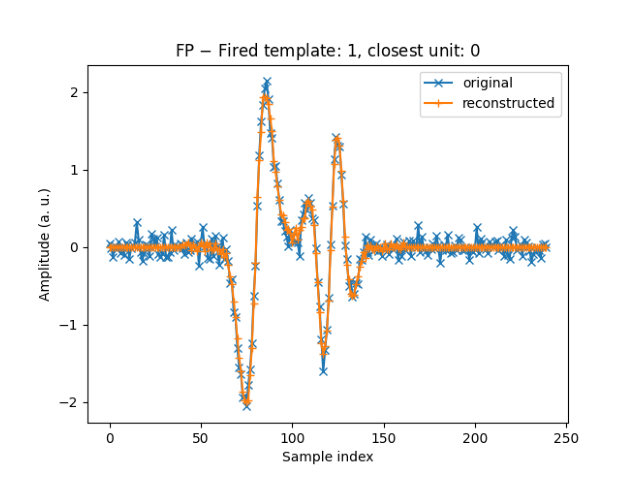

Confusion matrix:


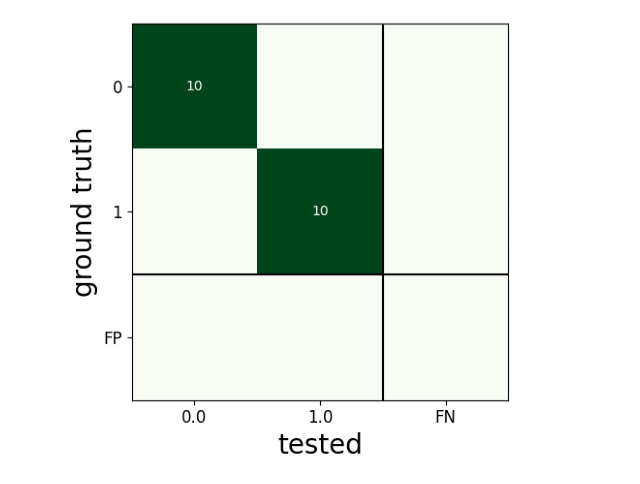

Time:


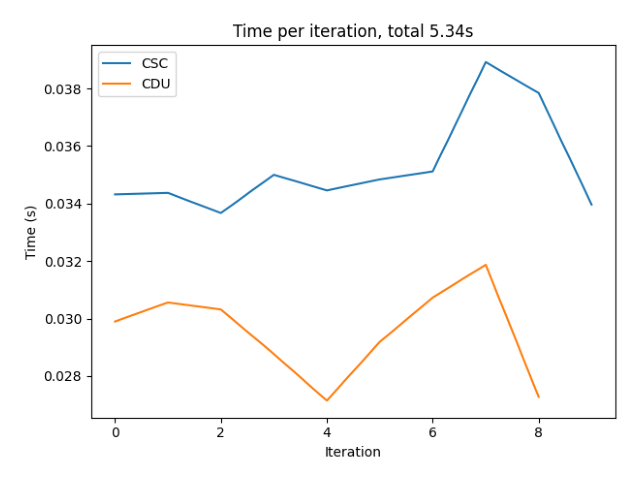

In [20]:
path = f"outputs/synth_experiments/experiment_{experiment}/single/interp_2_0/seed_{experiment+10}"
helper.show_plots(path)

In [21]:
# Run on multiple seeds
!ssrun --multirun dataset=synth_dataset_exp$experiment model=synth_model_exp$experiment experiment=$experiment dataset.gen.seed=range(1,6) model.cdl.interpolate=0,10 output.verbose=0 output.plot=0

[2024-01-08 09:39:24,206][HYDRA] Launching 10 jobs locally
[2024-01-08 09:39:24,206][HYDRA] 	#0 : dataset=synth_dataset_exp2 model=synth_model_exp2 experiment=2 dataset.gen.seed=1 model.cdl.interpolate=0 output.verbose=0 output.plot=0
Figure(2000x500)
Setting 'return_scaled' to False
[2024-01-08 09:39:26,812][HYDRA] 	#1 : dataset=synth_dataset_exp2 model=synth_model_exp2 experiment=2 dataset.gen.seed=1 model.cdl.interpolate=10 output.verbose=0 output.plot=0
Figure(2000x500)
Setting 'return_scaled' to False
[2024-01-08 09:39:35,169][HYDRA] 	#2 : dataset=synth_dataset_exp2 model=synth_model_exp2 experiment=2 dataset.gen.seed=2 model.cdl.interpolate=0 output.verbose=0 output.plot=0
Figure(2000x500)
Setting 'return_scaled' to False
[2024-01-08 09:39:36,758][HYDRA] 	#3 : dataset=synth_dataset_exp2 model=synth_model_exp2 experiment=2 dataset.gen.seed=2 model.cdl.interpolate=10 output.verbose=0 output.plot=0
Figure(2000x500)
Setting 'return_scaled' to False
[2024-01-08 09:39:44,381][HYDRA] 	#


extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

detect peaks using by_channel: 100%|##########| 3/3 [00:00<00:00, 2891.29it/s]
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\model\cdl.py:399: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_spike_sorting["diff"] = diffs_norm
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\model\cdl.py:399: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view

In [30]:
helper.report_multi_run_results(experiment)

Averaged accuracy:
interpolation: 0
unit 0: 1.000 +/- 0.000
unit 1: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000

interpolation: 10
unit 0: 1.000 +/- 0.000
unit 1: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000


--------------------------
Averaged precision:
interpolation: 0
unit 0: 1.000 +/- 0.000
unit 1: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000

interpolation: 10
unit 0: 1.000 +/- 0.000
unit 1: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000


--------------------------
Averaged recall:
interpolation: 0
unit 0: 1.000 +/- 0.000
unit 1: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000

interpolation: 10
unit 0: 1.000 +/- 0.000
unit 1: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000


--------------------------
Averaged error and time offset by interpolation and unit:
interpolation: 0
unit 0:
	error: 0.077 +/- 0.031
	offset: 0.000 ms +/- 0.000 ms
unit 1:
	error: 0.055 +/- 0.016
	offset: 0.000 ms +/- 0.000 ms
Overall:
	error: 0.0663383777691385 +/- 0.027032090285881116
	offset: 0.0 +/- 0.0

interpolation: 10
unit 0:
	

**Observations**: As exptected for this trivial situation, we get an accuracy of $1$ in both case, with not apparent difference in the error on the reconstruction of the dictionary.

*NB:* In some cases, the output figure may display a false positive when there is none in the confusion matrix, because false positive are not detected the same way for the plots and for the confusion matrix

#### Experiment 3

The dictionary is initialized with real templates and added random noise (of standard deviation $0.2$).

In [34]:
experiment = 3

In [24]:
# Single run with interpolation
!ssrun dataset=synth_dataset_exp$experiment model=synth_model_exp$experiment experiment=$experiment


experiment: 3
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: synth
  name: synthetic
  recording: synthetic
  uri: null
  tstart_s: null
  tstop_s: null
  duration_s: null
  tstart_test_s: null
  tstop_test_s: null
  channel: 0
  detect_threshold: 5
  preprocess: false
  preprocess_params:
    freq_min: null
    freq_max: null
  window:
    split: true
    window_size_s: 0.015
  sources:
    num: 2
    length_ms: 10.125
  gen:
    seed: 13
    noise: 0.1
    amps:
    - 1
    - 2
    numOfEvents: 10
    T: 3
  fs: 8000
model:
  dictionary:
    num_elements: 2
    element_length_ms: 10.125
    init_templates: real_noisy
    real_random_noise: 0.2
    real_offset_ms: 0.5
  cdl:
    num_iterations: 10
    interpolate: 10
    sparsity_tol: 1
    sparsity_tol_test: 25
    rel_amp_split_test: 0.6
    error_tol: 0.01
    interpolator_type: sinc
    permute_templates: false

Working dire


extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

detect peaks using by_channel: 100%|##########| 3/3 [00:00<?, ?it/s]

0it [00:00, ?it/s]
20it [00:00, 1266.95it/s]

100%|██████████| 20/20 [00:00<00:00, 67.71it/s]

100%|██████████| 20/20 [00:00<00:00, 65.62it/s]

100%|██████████| 20/20 [00:00<00:00, 67.83it/s]

100%|██████████| 20/20 [00:00<00:00, 67.85it/s]
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\outputs\plot.py:126: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,5))

100%|██████████| 20/20 [00:00<00:00, 67.83it/s]

100%|██████████| 20/20 [00:00<00:00, 67.36it/s]



Initial dictionary:


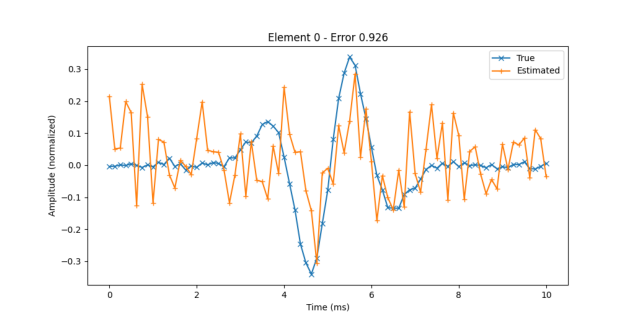

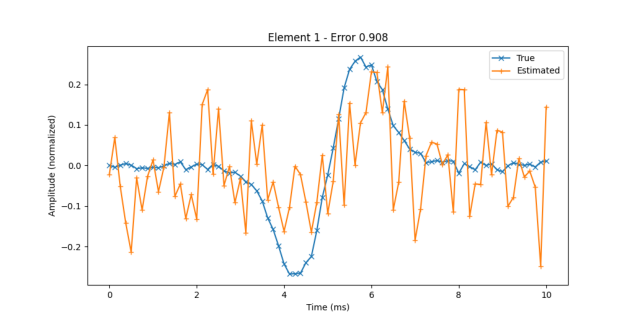

Final dictionary (shifted and interpolated truth):


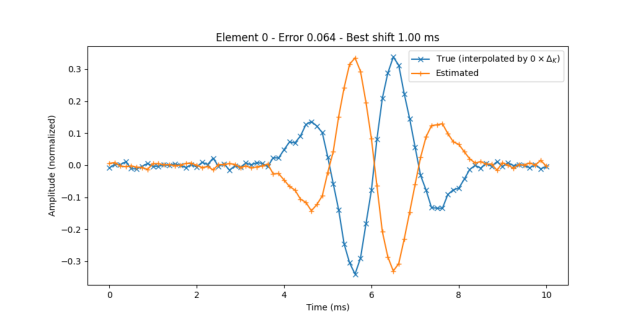

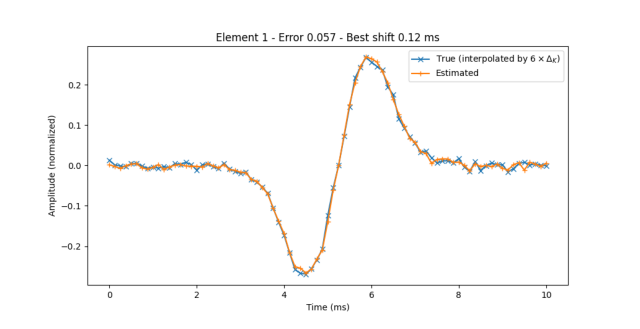

True positive on test set:


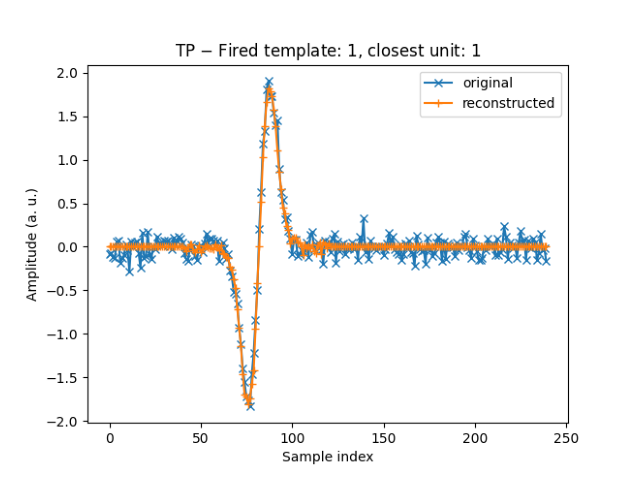

False positive on test set:


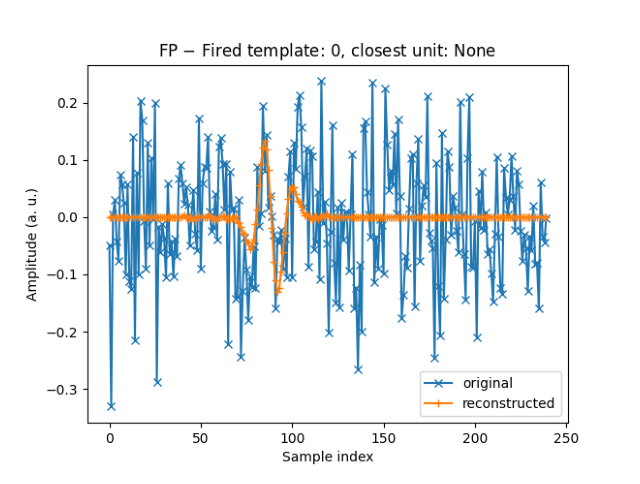

Confusion matrix:


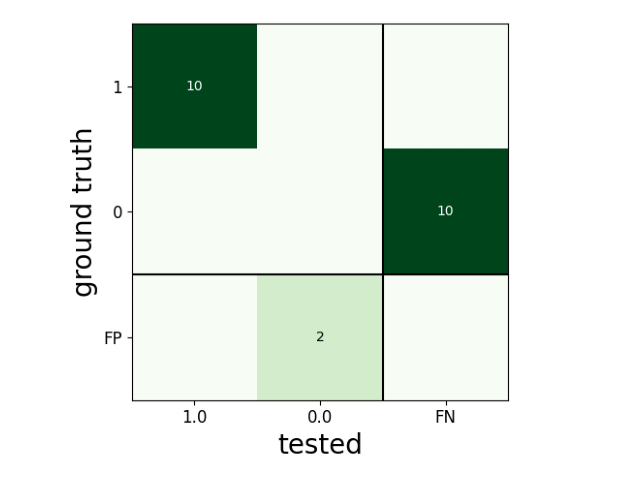

Time:


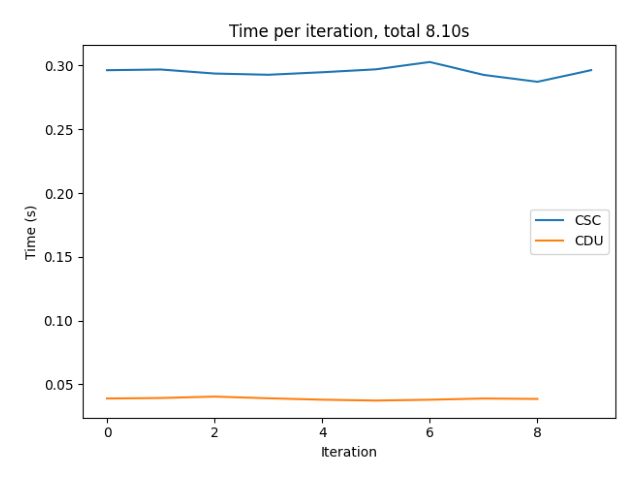

In [25]:
path = f"outputs/synth_experiments/experiment_{experiment}/single/interp_2_10/seed_{experiment+10}"
helper.show_plots(path)

In [26]:
# Single run without interpolation
!ssrun dataset=synth_dataset_exp$experiment model=synth_model_exp$experiment experiment=$experiment model.cdl.interpolate=0


experiment: 3
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: synth
  name: synthetic
  recording: synthetic
  uri: null
  tstart_s: null
  tstop_s: null
  duration_s: null
  tstart_test_s: null
  tstop_test_s: null
  channel: 0
  detect_threshold: 5
  preprocess: false
  preprocess_params:
    freq_min: null
    freq_max: null
  window:
    split: true
    window_size_s: 0.015
  sources:
    num: 2
    length_ms: 10.125
  gen:
    seed: 13
    noise: 0.1
    amps:
    - 1
    - 2
    numOfEvents: 10
    T: 3
  fs: 8000
model:
  dictionary:
    num_elements: 2
    element_length_ms: 10.125
    init_templates: real_noisy
    real_random_noise: 0.2
    real_offset_ms: 0.5
  cdl:
    num_iterations: 10
    interpolate: 0
    sparsity_tol: 1
    sparsity_tol_test: 25
    rel_amp_split_test: 0.6
    error_tol: 0.01
    interpolator_type: sinc
    permute_templates: false

Working direc


extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

detect peaks using by_channel: 100%|##########| 3/3 [00:00<00:00, 352.60it/s]

0it [00:00, ?it/s]
20it [00:00, 1419.32it/s]

100%|██████████| 20/20 [00:00<00:00, 661.46it/s]

100%|██████████| 20/20 [00:00<00:00, 632.35it/s]

100%|██████████| 20/20 [00:00<00:00, 516.51it/s]

100%|██████████| 20/20 [00:00<00:00, 660.11it/s]
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\outputs\plot.py:126: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,5))

100%|██████████| 20/20 [00:00<00:00, 662.40it/s]

100%|██████████| 20/20 [00:00<00:00

Initial dictionary:


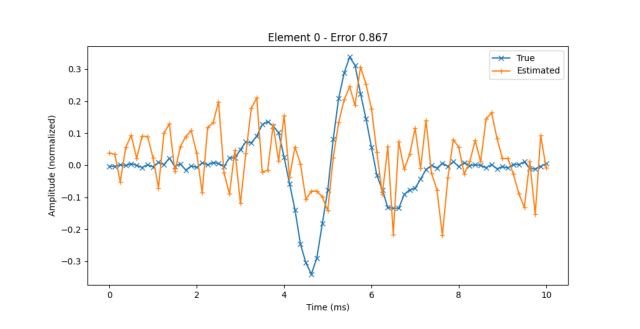

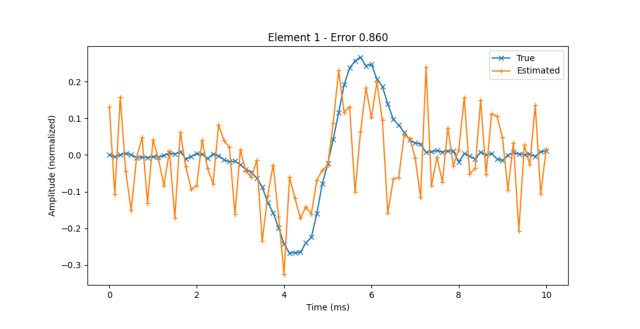

Final dictionary (shifted and interpolated truth):


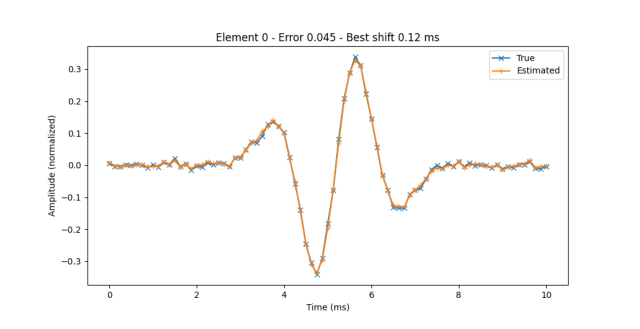

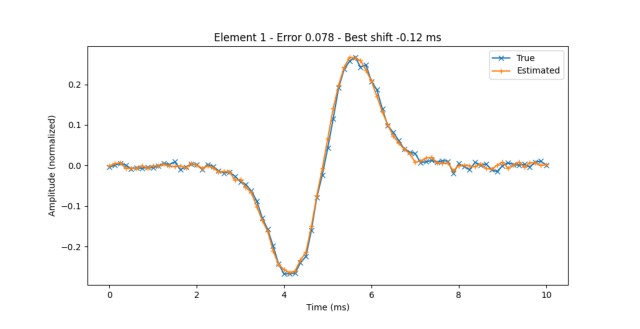

True positive on test set:


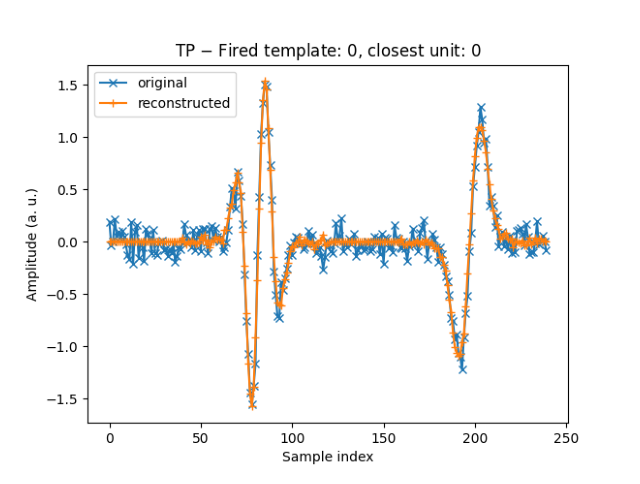

False positive on test set:
No false positive for test run.
Confusion matrix:


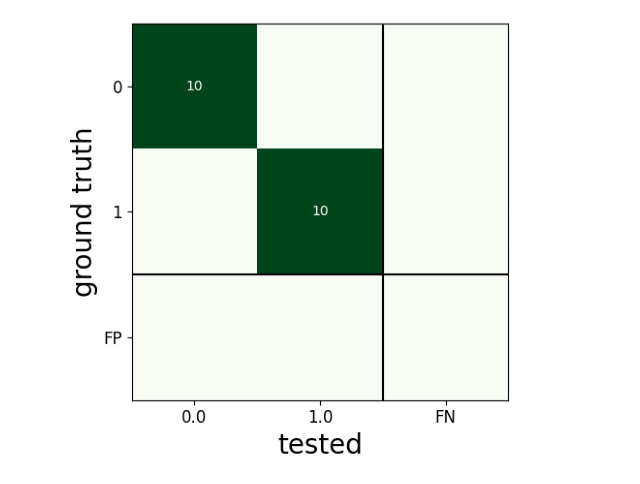

Time:


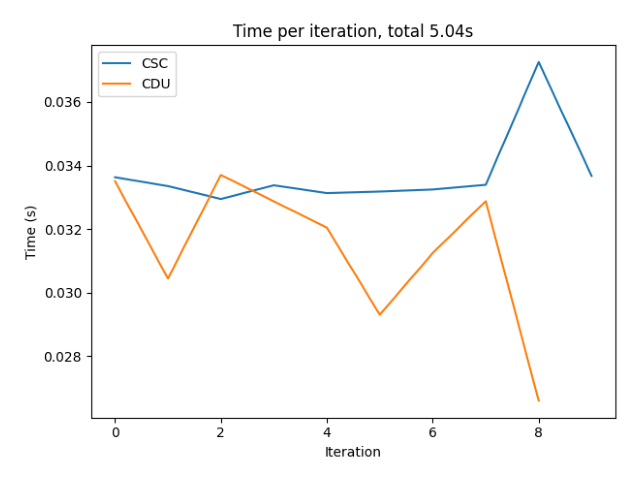

In [27]:
path = f"outputs/synth_experiments/experiment_{experiment}/single/interp_2_0/seed_{experiment+10}"
helper.show_plots(path)

In [28]:
# Run on multiple seeds
!ssrun --multirun dataset=synth_dataset_exp$experiment model=synth_model_exp$experiment experiment=$experiment dataset.gen.seed=range(1,6) model.cdl.interpolate=0,10 output.verbose=0 output.plot=1

[2024-01-08 09:40:54,388][HYDRA] Launching 10 jobs locally
[2024-01-08 09:40:54,388][HYDRA] 	#0 : dataset=synth_dataset_exp3 model=synth_model_exp3 experiment=3 dataset.gen.seed=1 model.cdl.interpolate=0 output.verbose=0 output.plot=1
Figure(2000x500)
Setting 'return_scaled' to False
[2024-01-08 09:40:58,369][HYDRA] 	#1 : dataset=synth_dataset_exp3 model=synth_model_exp3 experiment=3 dataset.gen.seed=1 model.cdl.interpolate=10 output.verbose=0 output.plot=1
Figure(1000x500)
Figure(640x480)
Figure(640x480)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(640x480)
Figure(2000x500)
Setting 'return_scaled' to False
[2024-01-08 09:41:07,933][HYDRA] 	#2 : dataset=synth_dataset_exp3 model=synth_model_exp3 experiment=3 dataset.gen.seed=2 model.cdl.interpolate=0 output.verbose=0 output.plot=1
Figure(1000x500)
Figure(640x480)
Figure(640x480)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000


extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

detect peaks using by_channel: 100%|##########| 3/3 [00:00<00:00, 3001.65it/s]
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\model\cdl.py:399: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_spike_sorting["diff"] = diffs_norm
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\model\cdl.py:399: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view

In [35]:
helper.report_multi_run_results(experiment)

Averaged accuracy:
interpolation: 0
unit 0: 1.000 +/- 0.000
unit 1: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000

interpolation: 10
unit 0: 1.000 +/- 0.000
unit 1: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000


--------------------------
Averaged precision:
interpolation: 0
unit 0: 1.000 +/- 0.000
unit 1: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000

interpolation: 10
unit 0: 1.000 +/- 0.000
unit 1: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000


--------------------------
Averaged recall:
interpolation: 0
unit 0: 1.000 +/- 0.000
unit 1: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000

interpolation: 10
unit 0: 1.000 +/- 0.000
unit 1: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000


--------------------------
Averaged error and time offset by interpolation and unit:
interpolation: 0
unit 0:
	error: 0.099 +/- 0.046
	offset: -0.050 ms +/- 0.061 ms
unit 1:
	error: 0.097 +/- 0.027
	offset: 0.075 ms +/- 0.218 ms
Overall:
	error: 0.09770331927637343 +/- 0.037966743316896256
	offset: 0.0125 +/- 0.171846588560844

interpol

**Observations**: Here again, we get near-optimal results. This experiment and the previous ones indicate that the algorithm is sensitive to initialization, as intializing with random noise gives bad results, and therefore getting a first coarse estimation of the templates helps a lot; moreover, this initialization does not have to be precise as shown here. Also, this time grid refinement diminishes the final reconstruction error. Lastly, note that the algorithm tends to learn the opposite of the true template; this is not problematic as the reconstruction can be done by taking an negative code, so this was not penalized in the computation of the error.

#### Experiment 4

Dictionary is initialized with real templates, horizontally offset by +2 ms.

In [30]:
experiment = 4

In [31]:
# Single run with interpolation
!ssrun dataset=synth_dataset_exp$experiment model=synth_model_exp$experiment experiment=$experiment


experiment: 4
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: synth
  name: synthetic
  recording: synthetic
  uri: null
  tstart_s: null
  tstop_s: null
  duration_s: null
  tstart_test_s: null
  tstop_test_s: null
  channel: 0
  detect_threshold: 5
  preprocess: false
  preprocess_params:
    freq_min: null
    freq_max: null
  window:
    split: true
    window_size_s: 0.015
  sources:
    num: 2
    length_ms: 10.125
  gen:
    seed: 14
    noise: 0.1
    amps:
    - 1
    - 2
    numOfEvents: 10
    T: 3
  fs: 8000
model:
  dictionary:
    num_elements: 2
    element_length_ms: 10.125
    init_templates: real_offset
    real_random_noise: 0.2
    real_offset_ms: 2
  cdl:
    num_iterations: 10
    interpolate: 10
    sparsity_tol: 1
    sparsity_tol_test: 25
    rel_amp_split_test: 0.6
    error_tol: 0.01
    interpolator_type: sinc
    permute_templates: false

Working direc


extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

detect peaks using by_channel: 100%|##########| 3/3 [00:00<?, ?it/s]

0it [00:00, ?it/s]
20it [00:00, 1936.88it/s]
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\model\dictionary.py:137: RuntimeWarning: invalid value encountered in sqrt
  dist = np.sqrt(1-np.power(np.dot(np.roll(interpolated_gt,o),estimated_dict),2))

100%|██████████| 20/20 [00:00<00:00, 66.32it/s]

100%|██████████| 20/20 [00:00<00:00, 63.99it/s]

100%|██████████| 20/20 [00:00<00:00, 64.00it/s]

100%|██████████| 20/20 [00:00<00:00, 69.81it/s]
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\outputs\plot.py:126: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see

Initial dictionary:


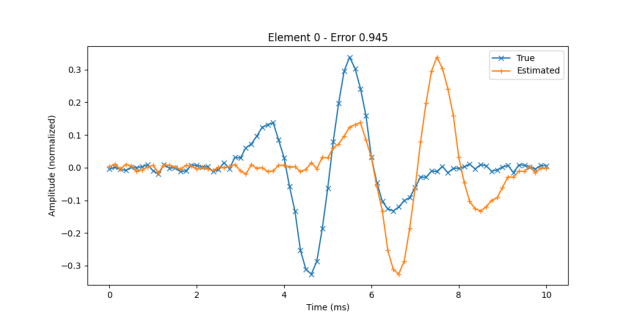

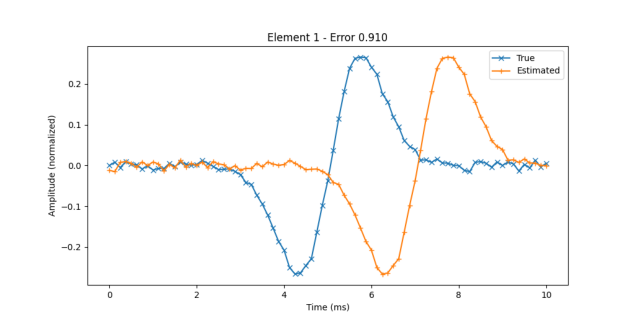

Final dictionary (shifted and interpolated truth):


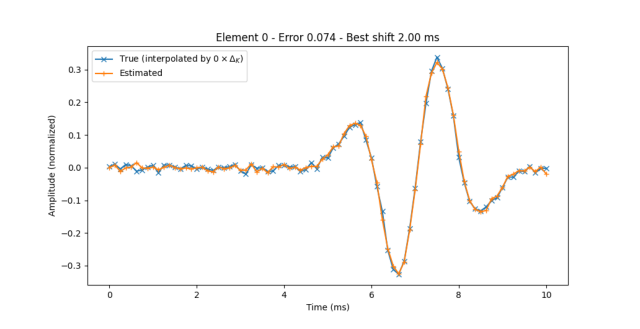

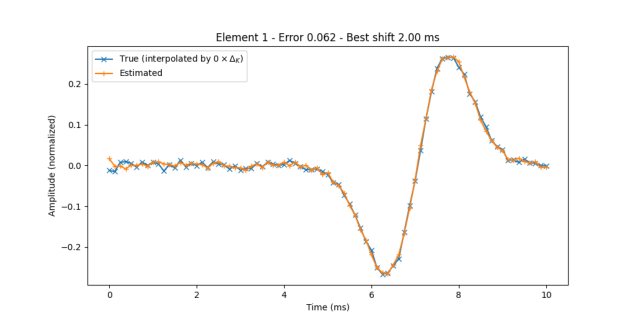

True positive on test set:


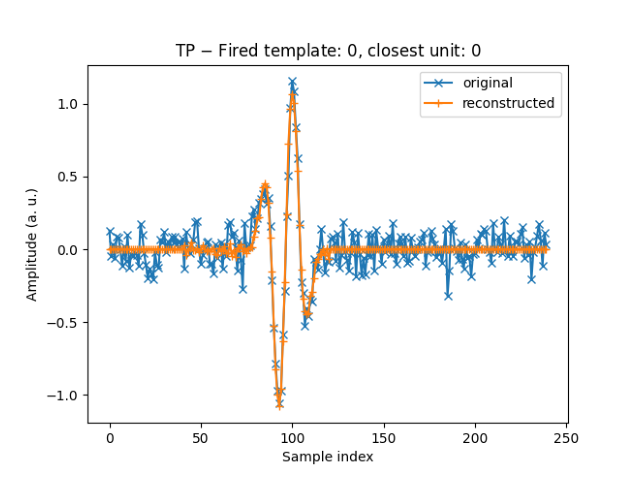

False positive on test set:


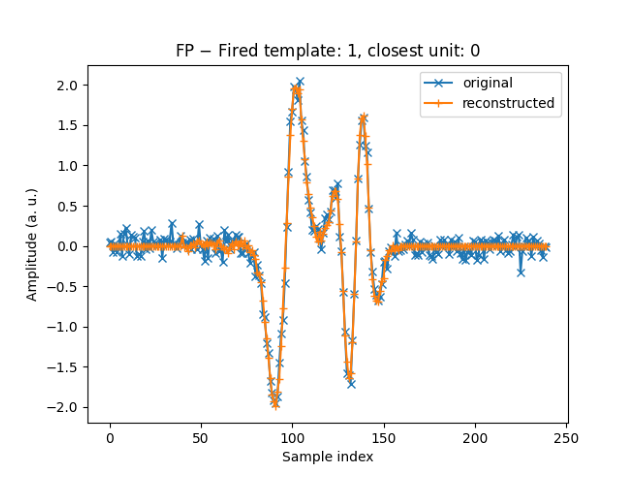

Confusion matrix:


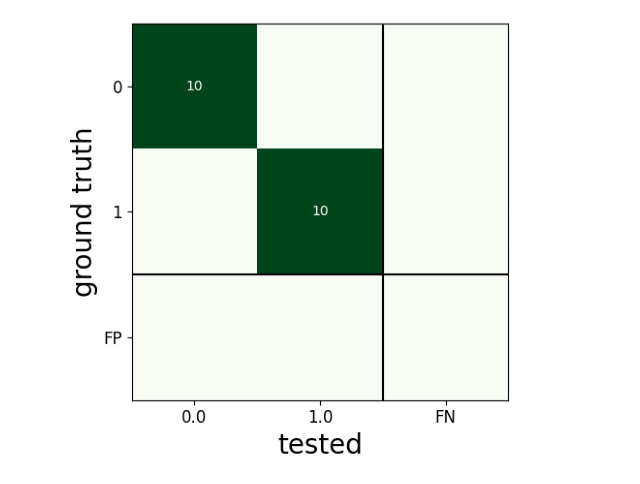

Time:


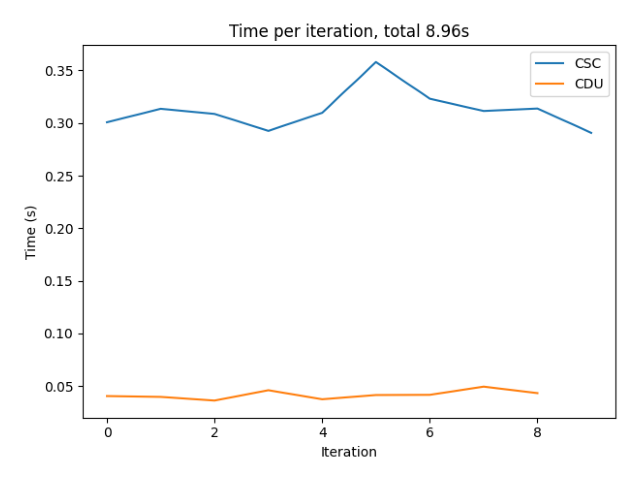

In [32]:
path = f"outputs/synth_experiments/experiment_{experiment}/single/interp_2_10/seed_{experiment+10}"
helper.show_plots(path)

In [33]:
# Single run without interpolation
!ssrun dataset=synth_dataset_exp$experiment model=synth_model_exp$experiment experiment=$experiment model.cdl.interpolate=0


experiment: 4
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: synth
  name: synthetic
  recording: synthetic
  uri: null
  tstart_s: null
  tstop_s: null
  duration_s: null
  tstart_test_s: null
  tstop_test_s: null
  channel: 0
  detect_threshold: 5
  preprocess: false
  preprocess_params:
    freq_min: null
    freq_max: null
  window:
    split: true
    window_size_s: 0.015
  sources:
    num: 2
    length_ms: 10.125
  gen:
    seed: 14
    noise: 0.1
    amps:
    - 1
    - 2
    numOfEvents: 10
    T: 3
  fs: 8000
model:
  dictionary:
    num_elements: 2
    element_length_ms: 10.125
    init_templates: real_offset
    real_random_noise: 0.2
    real_offset_ms: 2
  cdl:
    num_iterations: 10
    interpolate: 0
    sparsity_tol: 1
    sparsity_tol_test: 25
    rel_amp_split_test: 0.6
    error_tol: 0.01
    interpolator_type: sinc
    permute_templates: false

Working direct


extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

detect peaks using by_channel: 100%|##########| 3/3 [00:00<?, ?it/s]

0it [00:00, ?it/s]
20it [00:00, 991.36it/s]
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\model\dictionary.py:137: RuntimeWarning: invalid value encountered in sqrt
  dist = np.sqrt(1-np.power(np.dot(np.roll(interpolated_gt,o),estimated_dict),2))

100%|██████████| 20/20 [00:00<00:00, 547.18it/s]

100%|██████████| 20/20 [00:00<00:00, 660.89it/s]

100%|██████████| 20/20 [00:00<00:00, 588.33it/s]

100%|██████████| 20/20 [00:00<00:00, 521.23it/s]
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\outputs\plot.py:126: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, 

Initial dictionary:


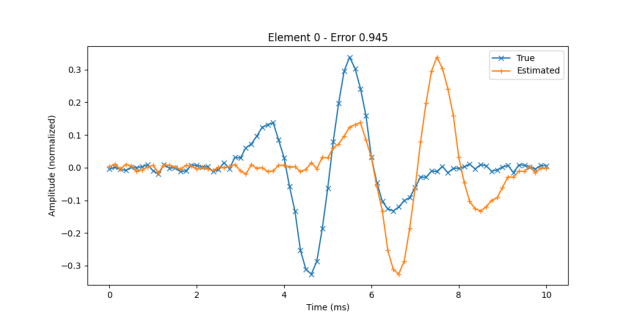

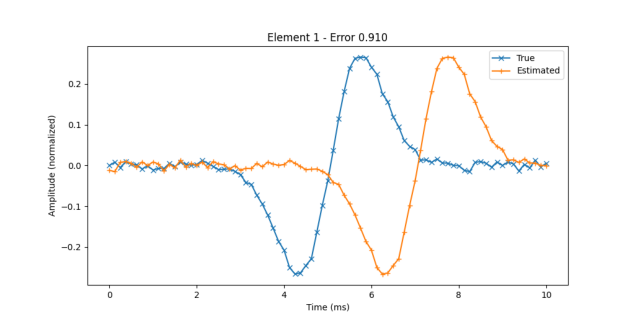

Final dictionary (shifted and interpolated truth):


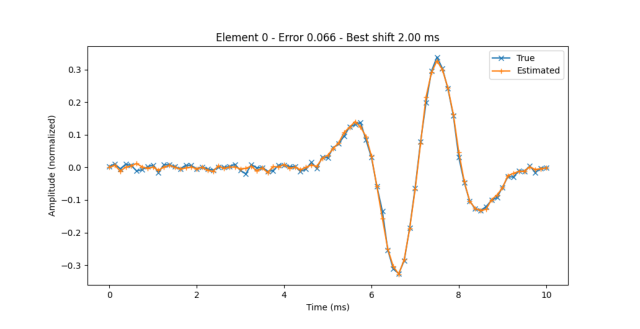

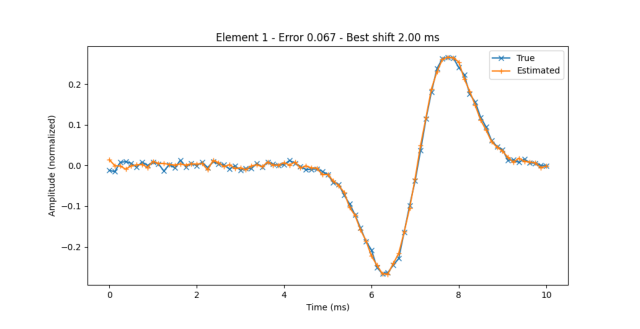

True positive on test set:


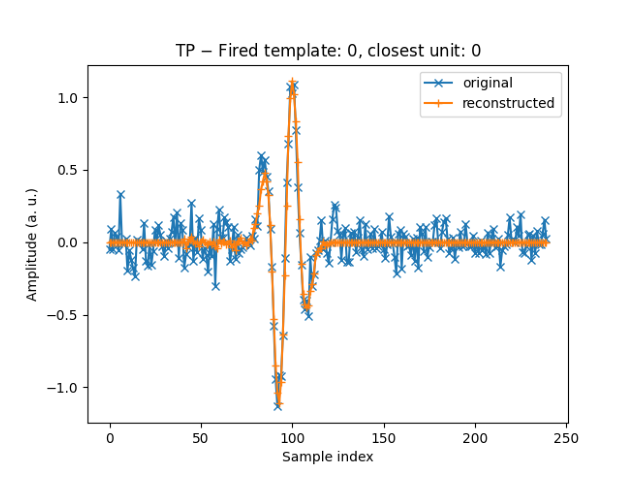

False positive on test set:


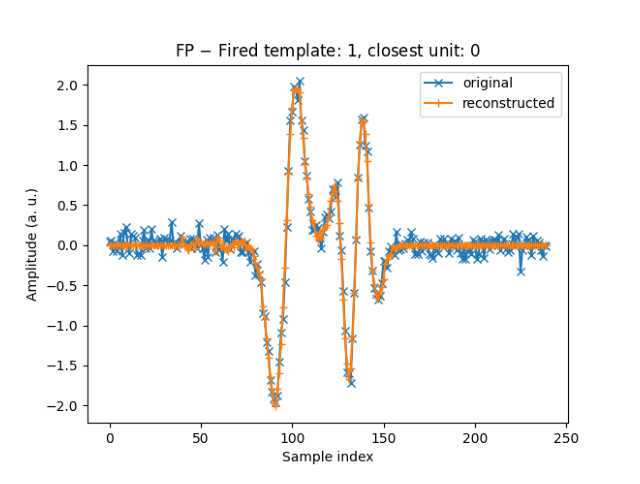

Confusion matrix:


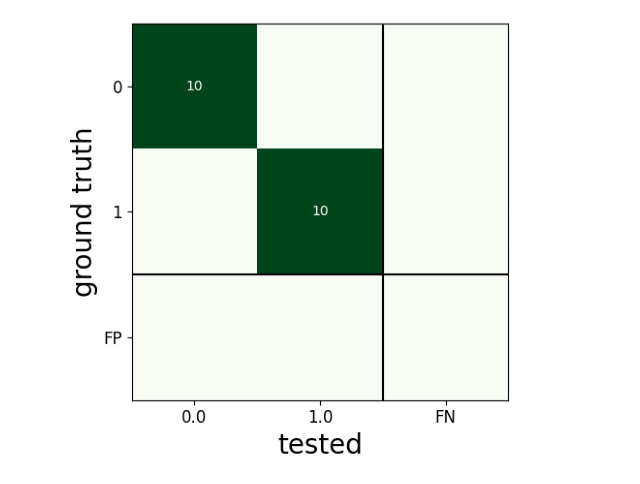

Time:


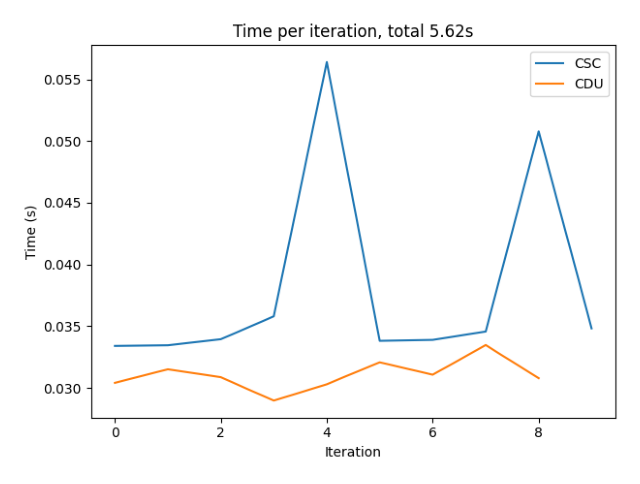

In [34]:
path = f"outputs/synth_experiments/experiment_{experiment}/single/interp_2_0/seed_{experiment+10}"
helper.show_plots(path)

In [35]:
# Run on multiple seeds
!ssrun --multirun dataset=synth_dataset_exp$experiment model=synth_model_exp$experiment experiment=$experiment dataset.gen.seed=range(1,6) model.cdl.interpolate=0,10 output.verbose=0 output.plot=1

[2024-01-08 09:42:45,628][HYDRA] Launching 10 jobs locally
[2024-01-08 09:42:45,628][HYDRA] 	#0 : dataset=synth_dataset_exp4 model=synth_model_exp4 experiment=4 dataset.gen.seed=1 model.cdl.interpolate=0 output.verbose=0 output.plot=1
Figure(2000x500)
Setting 'return_scaled' to False
[2024-01-08 09:42:49,655][HYDRA] 	#1 : dataset=synth_dataset_exp4 model=synth_model_exp4 experiment=4 dataset.gen.seed=1 model.cdl.interpolate=10 output.verbose=0 output.plot=1
Figure(1000x500)
Figure(640x480)
Figure(640x480)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(640x480)
Figure(2000x500)
Setting 'return_scaled' to False
[2024-01-08 09:42:59,437][HYDRA] 	#2 : dataset=synth_dataset_exp4 model=synth_model_exp4 experiment=4 dataset.gen.seed=2 model.cdl.interpolate=0 output.verbose=0 output.plot=1
Figure(1000x500)
Figure(640x480)
Figure(640x480)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000


extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<00:00, 3392.53it/s]

extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

detect peaks using by_channel: 100%|##########| 3/3 [00:00<00:00, 296.87it/s]
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\model\dictionary.py:137: RuntimeWarning: invalid value encountered in sqrt
  dist = np.sqrt(1-np.power(np.dot(np.roll(interpolated_gt,o),estimated_dict),2))
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\model\cdl.py:399: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_spike_sorting["diff"] = diffs_norm
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\model\cdl.py:399: SettingWithCopyWarning: 
A value is trying to be se

In [37]:
helper.report_multi_run_results(experiment)

Averaged accuracy:
interpolation: 0
unit 0: 1.000 +/- 0.000
unit 1: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000

interpolation: 10
unit 0: 1.000 +/- 0.000
unit 1: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000


--------------------------
Averaged precision:
interpolation: 0
unit 0: 1.000 +/- 0.000
unit 1: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000

interpolation: 10
unit 0: 1.000 +/- 0.000
unit 1: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000


--------------------------
Averaged recall:
interpolation: 0
unit 0: 1.000 +/- 0.000
unit 1: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000

interpolation: 10
unit 0: 1.000 +/- 0.000
unit 1: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000


--------------------------
Averaged error and time offset by interpolation and unit:
interpolation: 0
unit 0:
	error: 0.081 +/- 0.016
	offset: 2.000 ms +/- 0.000 ms
unit 1:
	error: 0.064 +/- 0.013
	offset: 2.000 ms +/- 0.000 ms
Overall:
	error: 0.07218912357541174 +/- 0.017047112610119923
	offset: 2.0 +/- 0.0

interpolation: 10
unit 0:


**Observations**: The algorithm preserves the shift in its learnt dictionary, which does not hinder reconstruction as the code can be adapted to solve this issue; but this makes interpreting the event detection more difficult in a broader context of application.

#### Experiment 5

The signal is generated using 5 templates

In [38]:
experiment = 5

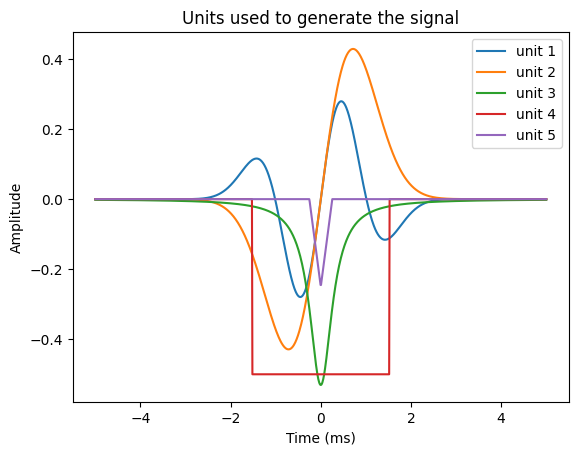

In [39]:
filter_length = 10.125
factor = 10/filter_length
dictionary = {}
dictionary[0] = lambda x: (factor*x)*np.exp(-(factor*x)**2)*np.cos(2*np.pi*(factor*x)/4)
dictionary[1] = lambda x: (factor*x)*np.exp(-(factor*x)**2)
gamma = 0.3
dictionary[2] = lambda x: -0.5/np.pi * gamma / ((factor*x)**2 + gamma**2)  # Cauchy distribution-shaped
dictionary[3] = lambda x: -0.5*(np.abs((factor*x)) <= 1.5)
dictionary[4] = lambda x: -0.5*np.where(np.abs((factor*x)) <= 0.25, 0.5 - 2 * np.abs((factor*x)), 0)


times = np.linspace(-5, 5, 1000)
for i in range(5):
    plt.plot(times, dictionary[i](times), label=f"unit {i+1}")
plt.xlabel("Time (ms)")
plt.ylabel("Amplitude")
plt.legend()
plt.title("Units used to generate the signal")
plt.show()

In [39]:
# Single run with interpolation
!ssrun dataset=synth_dataset_exp$experiment model=synth_model_exp$experiment experiment=$experiment


experiment: 5
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: synth
  name: synthetic
  recording: synthetic
  uri: null
  tstart_s: null
  tstop_s: null
  duration_s: null
  tstart_test_s: null
  tstop_test_s: null
  channel: 0
  detect_threshold: 5
  preprocess: false
  preprocess_params:
    freq_min: null
    freq_max: null
  window:
    split: true
    window_size_s: 0.015
  sources:
    num: 5
    length_ms: 10.125
  gen:
    seed: 15
    noise: 0.1
    amps:
    - 1
    - 2
    numOfEvents: 10
    T: 3
  fs: 8000
model:
  dictionary:
    num_elements: 5
    element_length_ms: 10.125
    init_templates: real_noisy
    real_random_noise: 0.2
    real_offset_ms: 0.5
  cdl:
    num_iterations: 10
    interpolate: 10
    sparsity_tol: 1
    sparsity_tol_test: 25
    rel_amp_split_test: 0.6
    error_tol: 0.01
    interpolator_type: sinc
    permute_templates: false
  gen:
    nu


extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

detect peaks using by_channel: 100%|##########| 3/3 [00:00<00:00, 2903.97it/s]

0it [00:00, ?it/s]
49it [00:00, 1938.86it/s]

100%|██████████| 49/49 [00:01<00:00, 27.38it/s]
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\outputs\plot.py:141: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,5))

100%|██████████| 49/49 [00:01<00:00, 26.78it/s]

100%|██████████| 49/49 [00:01<00:00, 25.77it/s]

100%|██████████| 49/49 [00:01<00:00, 26.67it/s]

100%|██████████| 49/49 [00:01<00:00, 26.13it/s]

100%|██████████| 49/49 [00:01<00:00, 27

Initial dictionary:


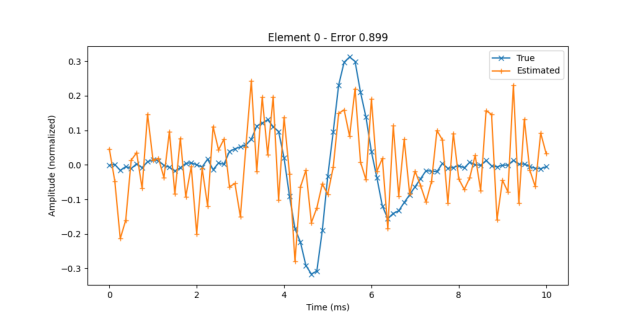

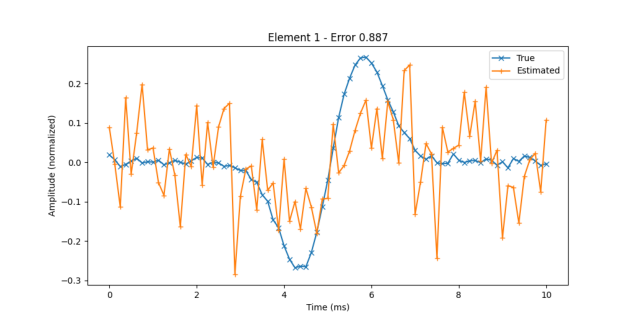

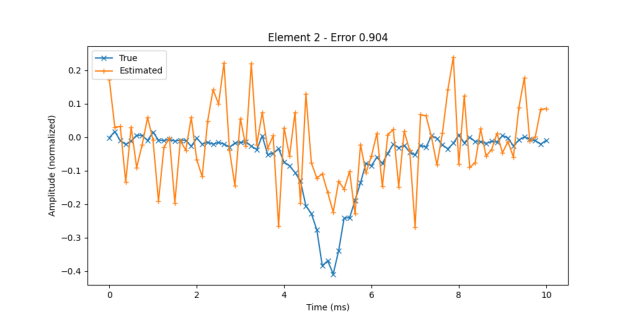

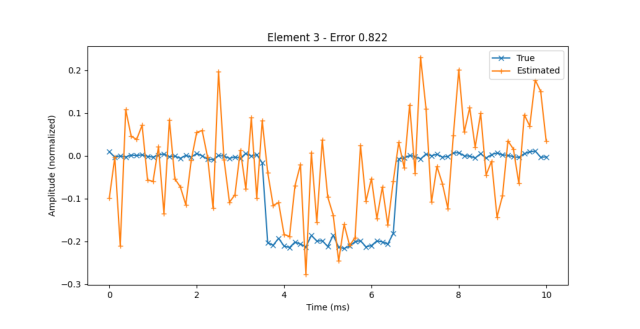

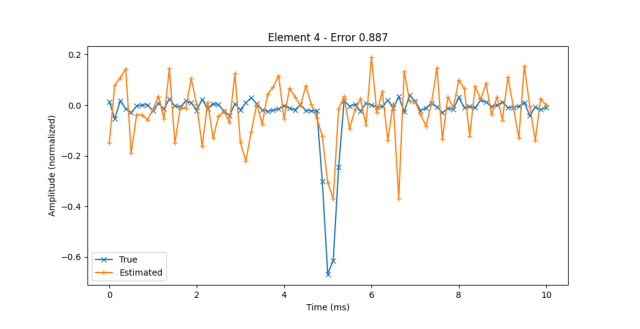

Final dictionary (shifted and interpolated truth):


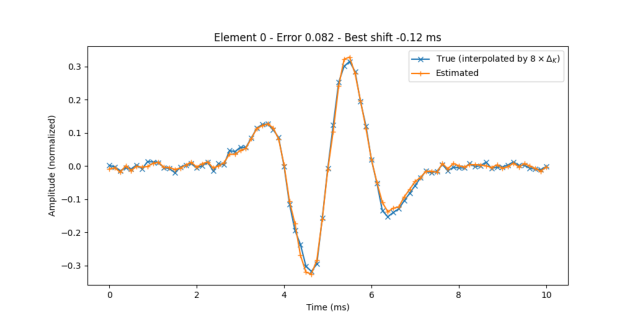

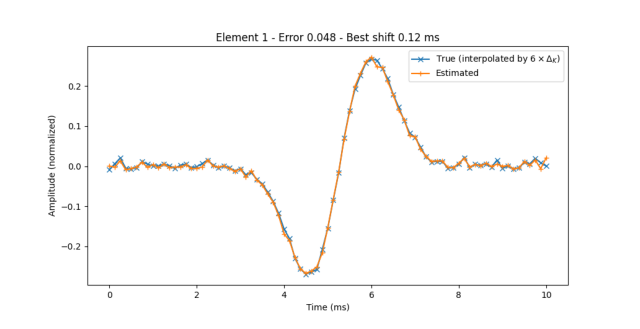

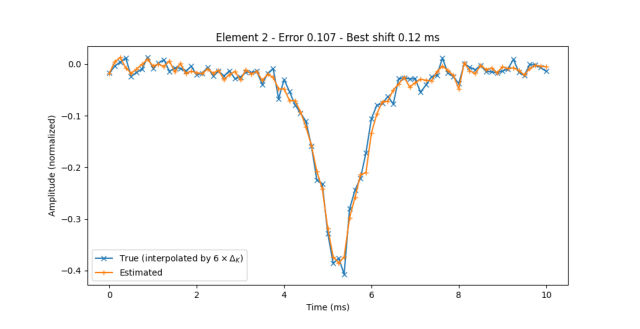

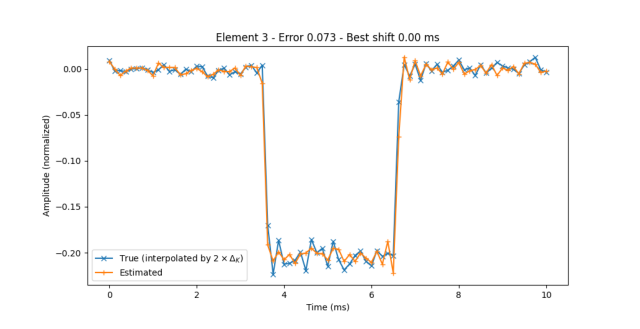

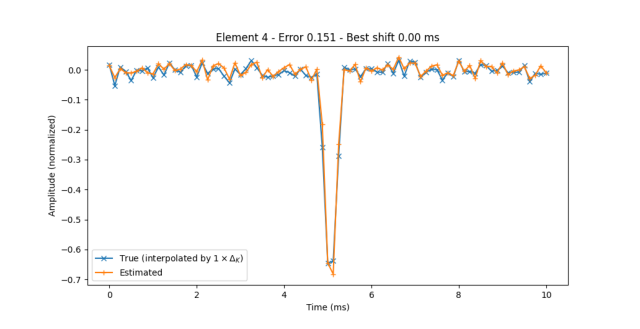

True positive on test set:


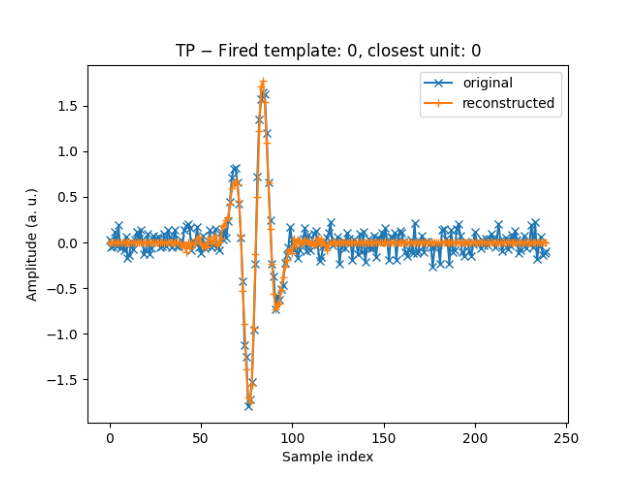

False positive on test set:


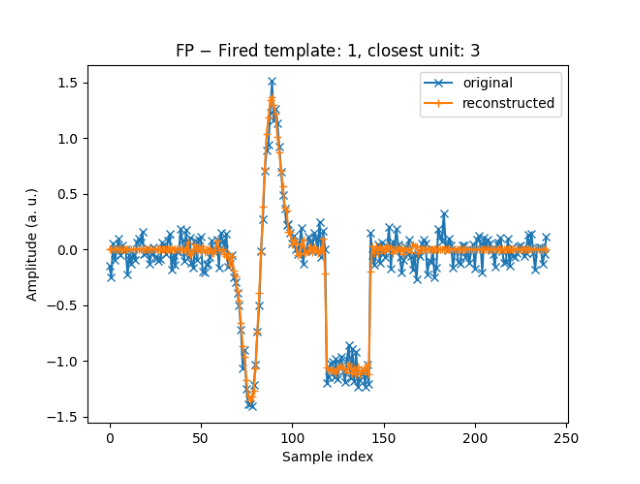

Confusion matrix:


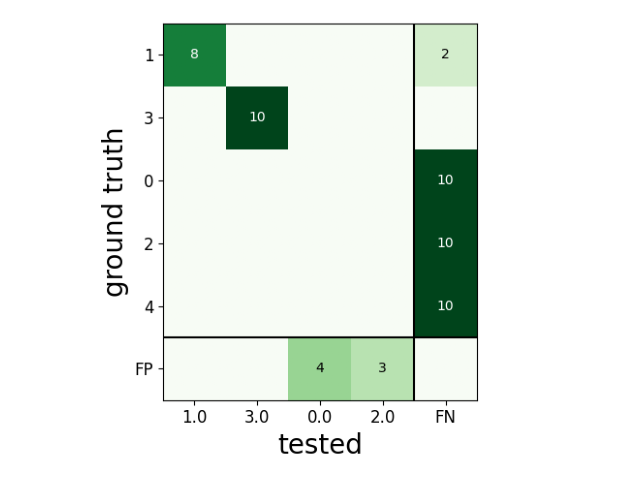

Time:


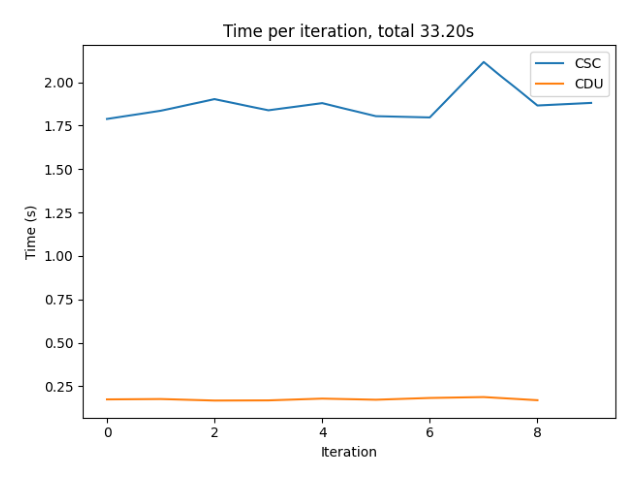

In [40]:
path = f"outputs/synth_experiments/experiment_{experiment}/single/interp_5_10/seed_{experiment+10}/"
helper.show_plots(path, num_elements=5)

In [42]:
# Single run without interpolation
!ssrun dataset=synth_dataset_exp$experiment model=synth_model_exp$experiment experiment=$experiment model.cdl.interpolate=0


experiment: 5
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: synth
  name: synthetic
  recording: synthetic
  uri: null
  tstart_s: null
  tstop_s: null
  duration_s: null
  tstart_test_s: null
  tstop_test_s: null
  channel: 0
  detect_threshold: 5
  preprocess: false
  preprocess_params:
    freq_min: null
    freq_max: null
  window:
    split: true
    window_size_s: 0.015
  sources:
    num: 5
    length_ms: 10.125
  gen:
    seed: 15
    noise: 0.1
    amps:
    - 1
    - 2
    numOfEvents: 10
    T: 3
  fs: 8000
model:
  dictionary:
    num_elements: 5
    element_length_ms: 10.125
    init_templates: real_noisy
    real_random_noise: 0.2
    real_offset_ms: 0.5
  cdl:
    num_iterations: 10
    interpolate: 0
    sparsity_tol: 1
    sparsity_tol_test: 25
    rel_amp_split_test: 0.6
    error_tol: 0.01
    interpolator_type: sinc
    permute_templates: false
  gen:
    num


extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<00:00, 2969.77it/s]

extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

detect peaks using by_channel: 100%|##########| 3/3 [00:00<?, ?it/s]

0it [00:00, ?it/s]
49it [00:00, 1567.90it/s]

100%|██████████| 49/49 [00:00<00:00, 265.52it/s]
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\outputs\plot.py:141: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,5))

100%|██████████| 49/49 [00:00<00:00, 281.17it/s]

100%|██████████| 49/49 [00:00<00:00, 266.80it/s]

100%|██████████| 49/49 [00:00<00:00, 264.52it/s]

100%|██████████| 49/49 [00:00<00:00, 259.76it/s]

100%|██████████| 49/49 [00:00<00:0

Initial dictionary:


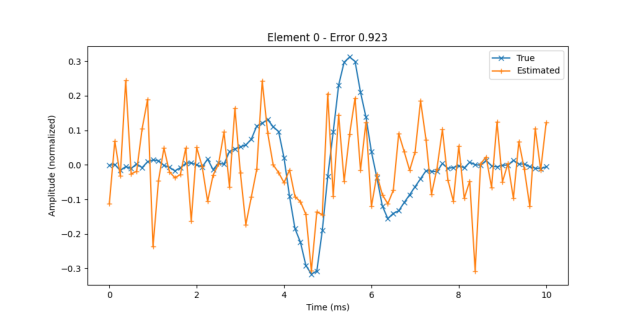

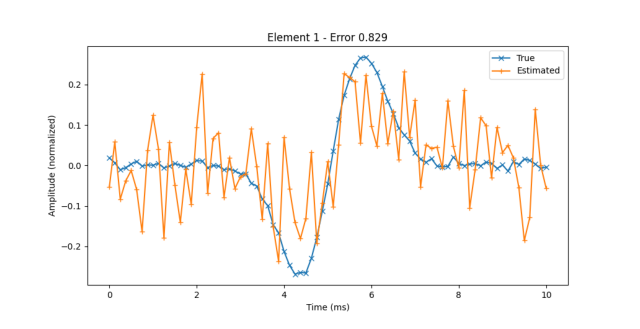

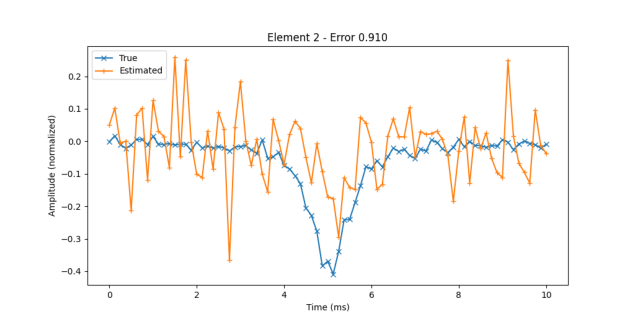

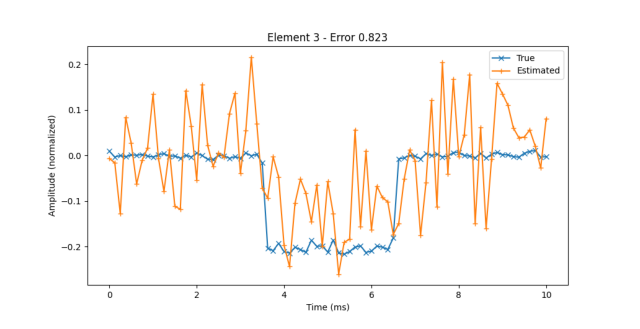

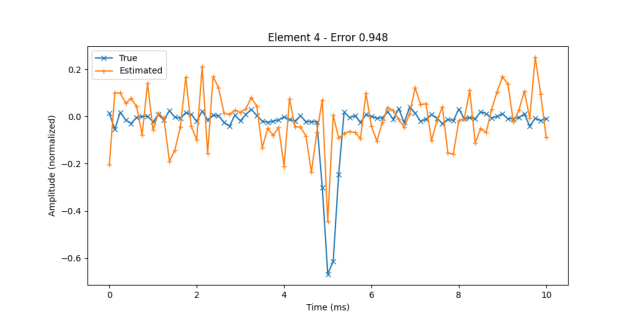

Final dictionary (shifted and interpolated truth):


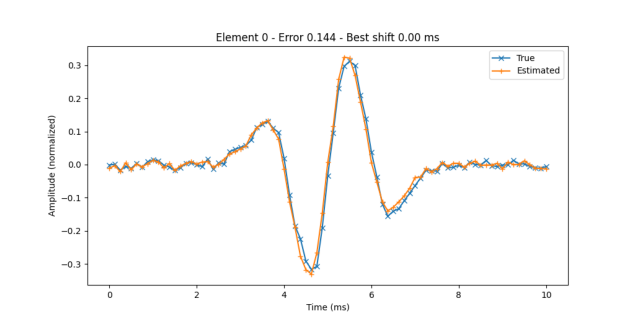

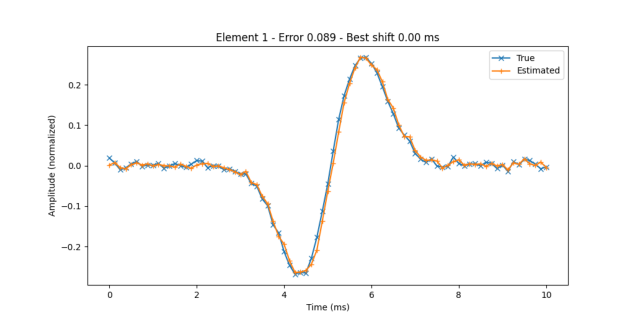

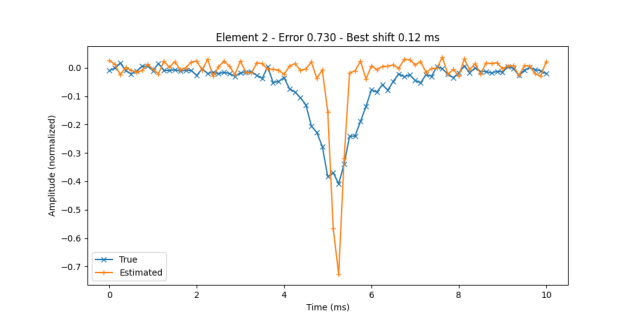

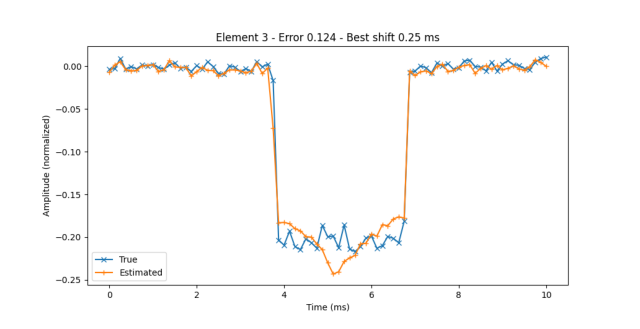

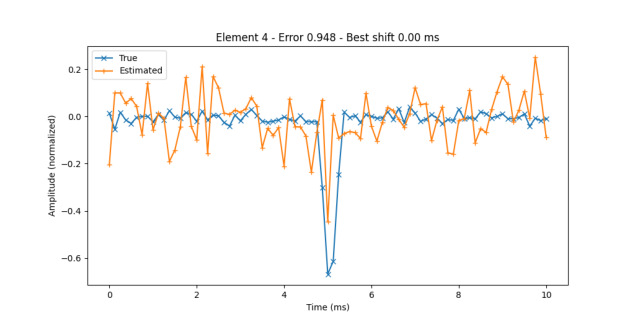

True positive on test set:


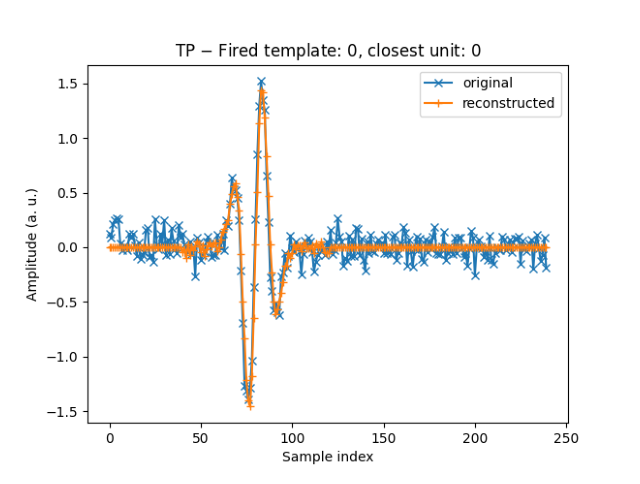

False positive on test set:


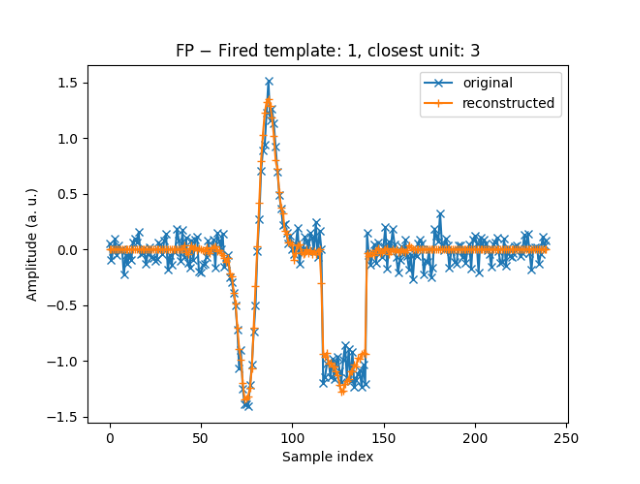

Confusion matrix:


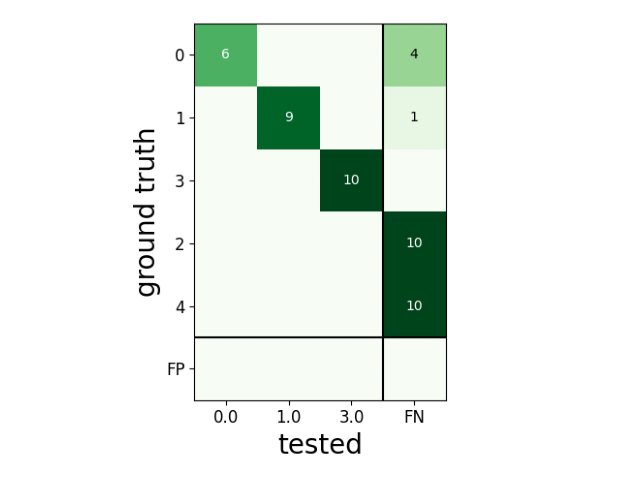

Time:


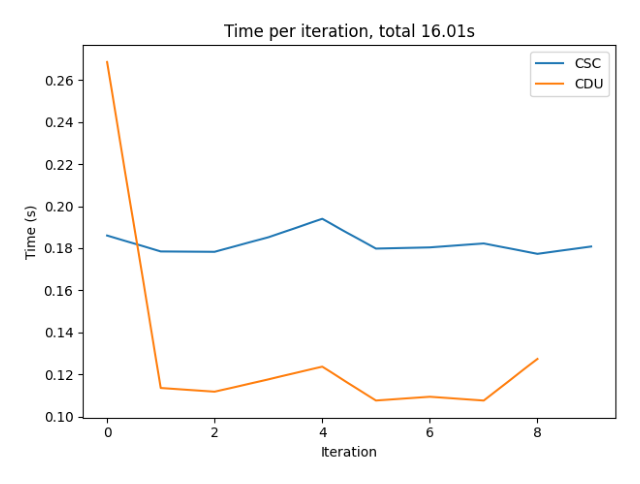

In [45]:
path = f"outputs/synth_experiments/experiment_{experiment}/single/interp_5_0/seed_{experiment+10}/"
helper.show_plots(path, num_elements=5)

In [43]:
# Run on multiple seeds
!ssrun --multirun dataset=synth_dataset_exp$experiment model=synth_model_exp$experiment experiment=$experiment dataset.gen.seed=range(1,6) model.cdl.interpolate=0,10 output.verbose=0 output.plot=1

[2024-01-08 09:45:20,268][HYDRA] Launching 10 jobs locally
[2024-01-08 09:45:20,270][HYDRA] 	#0 : dataset=synth_dataset_exp5 model=synth_model_exp5 experiment=5 dataset.gen.seed=1 model.cdl.interpolate=0 output.verbose=0 output.plot=1
Figure(2000x500)
Setting 'return_scaled' to False
[2024-01-08 09:45:29,337][HYDRA] 	#1 : dataset=synth_dataset_exp5 model=synth_model_exp5 experiment=5 dataset.gen.seed=1 model.cdl.interpolate=10 output.verbose=0 output.plot=1
Figure(1000x500)
Figure(640x480)
Figure(640x480)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(640x480)
Figure(2000x500)
Setting 'return_scaled' to False
[2024-01-08 09:46:02,163][HYDRA] 	#2 : dataset=synth_dataset_exp5 model=synth_model


extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<00:00, 3007.39it/s]

extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

detect peaks using by_channel: 100%|##########| 3/3 [00:00<?, ?it/s]
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\outputs\plot.py:141: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,5))
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\model\cdl.py:399: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

In [46]:
helper.report_multi_run_results(experiment, num_elements=5)

Averaged accuracy:
interpolation: 0
unit 0: 0.380 +/- 0.319
unit 1: 0.740 +/- 0.102
unit 2: 0.000 +/- 0.000
unit 3: 0.967 +/- 0.067
unit 4: 0.000 +/- 0.000
Overall: 0.417 +/- 0.418

interpolation: 10
unit 0: 0.260 +/- 0.332
unit 1: 0.760 +/- 0.049
unit 2: 0.000 +/- 0.000
unit 3: 0.967 +/- 0.067
unit 4: 0.000 +/- 0.000
Overall: 0.397 +/- 0.426


--------------------------
Averaged precision:
interpolation: 0
unit 0: 0.600 +/- 0.490
unit 1: 1.000 +/- 0.000
unit 2: 0.000 +/- 0.000
unit 3: 0.967 +/- 0.067
unit 4: 0.000 +/- 0.000
Overall: 0.513 +/- 0.494

interpolation: 10
unit 0: 0.400 +/- 0.490
unit 1: 1.000 +/- 0.000
unit 2: 0.000 +/- 0.000
unit 3: 0.967 +/- 0.067
unit 4: 0.000 +/- 0.000
Overall: 0.473 +/- 0.494


--------------------------
Averaged recall:
interpolation: 0
unit 0: 0.380 +/- 0.319
unit 1: 0.740 +/- 0.102
unit 2: 0.000 +/- 0.000
unit 3: 1.000 +/- 0.000
unit 4: 0.000 +/- 0.000
Overall: 0.424 +/- 0.425

interpolation: 10
unit 0: 0.260 +/- 0.332
unit 1: 0.760 +/- 0.049
unit 

**Observations**: Both algorithms struggle with a greater number of sources, especially due to units 3 and 5 which are very similar. Interestingly here, the recosntruction of the 

#### Experiment 6
SNR is increased to 0.3 (default was 0.1).

In [45]:
experiment = 6

In [46]:
# Single run with interpolation
!ssrun dataset=synth_dataset_exp$experiment model=synth_model_exp$experiment experiment=$experiment


experiment: 6
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: synth
  name: synthetic
  recording: synthetic
  uri: null
  tstart_s: null
  tstop_s: null
  duration_s: null
  tstart_test_s: null
  tstop_test_s: null
  channel: 0
  detect_threshold: 5
  preprocess: false
  preprocess_params:
    freq_min: null
    freq_max: null
  window:
    split: true
    window_size_s: 0.015
  sources:
    num: 2
    length_ms: 10.125
  gen:
    seed: 16
    noise: 0.3
    amps:
    - 1
    - 2
    numOfEvents: 10
    T: 3
  fs: 8000
model:
  dictionary:
    num_elements: 2
    element_length_ms: 10.125
    init_templates: real_noisy
    real_random_noise: 0.2
    real_offset_ms: 0.5
  cdl:
    num_iterations: 10
    interpolate: 10
    sparsity_tol: 1
    sparsity_tol_test: 25
    rel_amp_split_test: 0.6
    error_tol: 0.01
    interpolator_type: sinc
    permute_templates: false

Working dire


extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

detect peaks using by_channel: 100%|##########| 3/3 [00:00<00:00, 2990.24it/s]

0it [00:00, ?it/s]
13it [00:00, 941.86it/s]

100%|██████████| 13/13 [00:00<00:00, 66.63it/s]

100%|██████████| 13/13 [00:00<00:00, 67.26it/s]

100%|██████████| 13/13 [00:00<00:00, 67.46it/s]

100%|██████████| 13/13 [00:00<00:00, 71.09it/s]
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\outputs\plot.py:126: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,5))

100%|██████████| 13/13 [00:00<00:00, 67.21it/s]

100%|██████████| 13/13 [00:00<00:00, 68.

Initial dictionary:


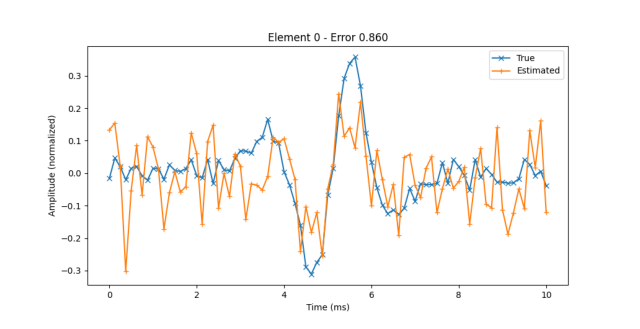

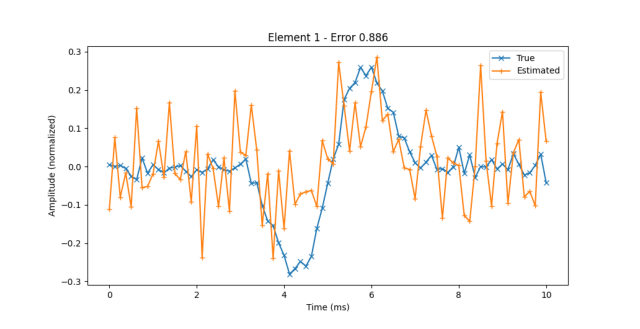

Final dictionary (shifted and interpolated truth):


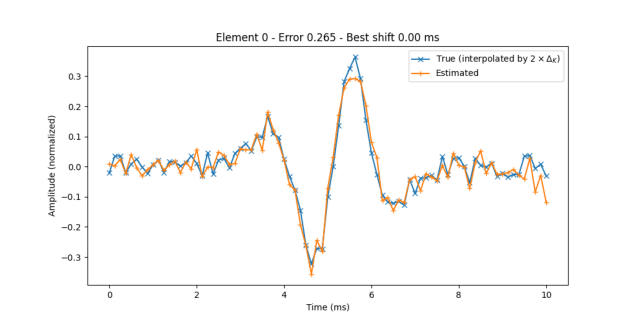

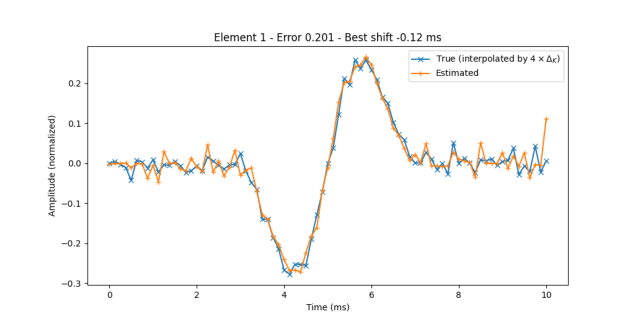

True positive on test set:


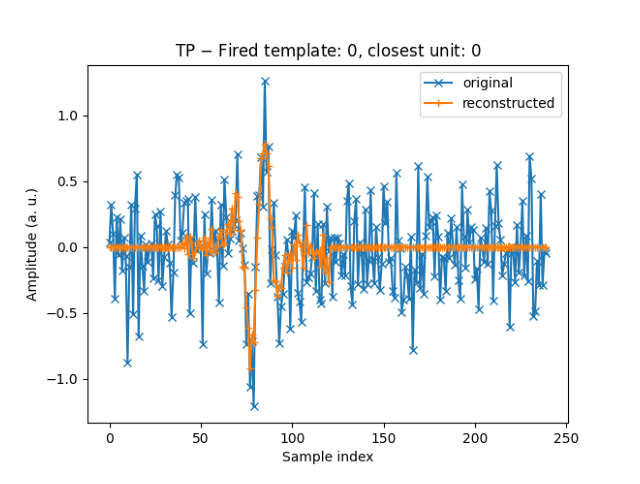

False positive on test set:


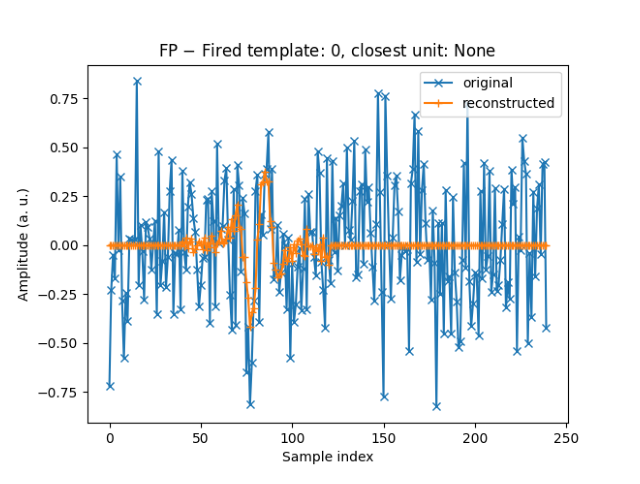

Confusion matrix:


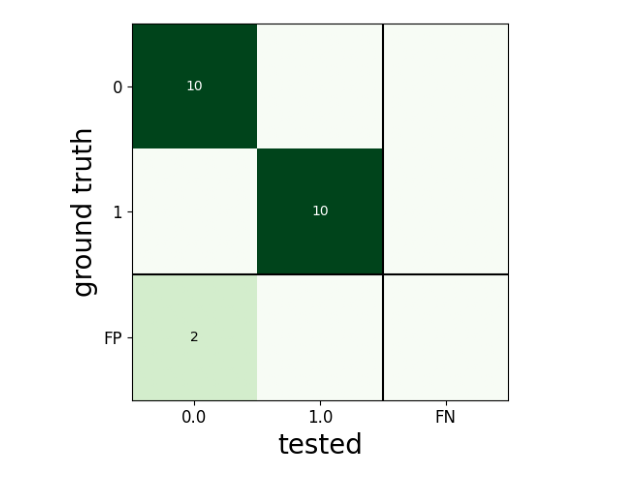

Time:


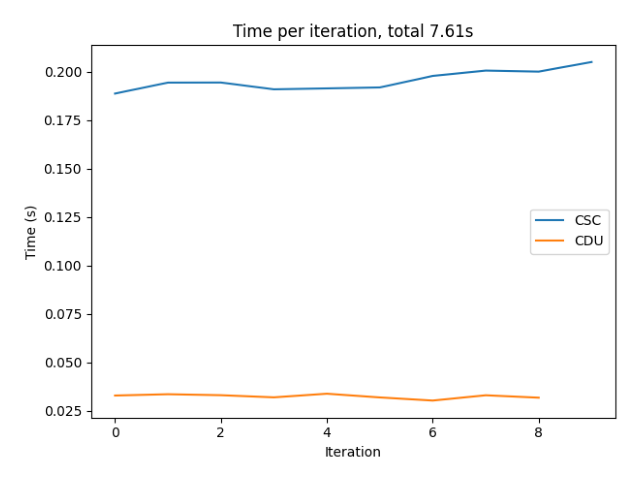

In [47]:
path = f"outputs/synth_experiments/experiment_{experiment}/single/interp_2_10/seed_{experiment+10}"
helper.show_plots(path)

In [48]:
# Single run without interpolation
!ssrun dataset=synth_dataset_exp$experiment model=synth_model_exp$experiment experiment=$experiment model.cdl.interpolate=0


experiment: 6
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: synth
  name: synthetic
  recording: synthetic
  uri: null
  tstart_s: null
  tstop_s: null
  duration_s: null
  tstart_test_s: null
  tstop_test_s: null
  channel: 0
  detect_threshold: 5
  preprocess: false
  preprocess_params:
    freq_min: null
    freq_max: null
  window:
    split: true
    window_size_s: 0.015
  sources:
    num: 2
    length_ms: 10.125
  gen:
    seed: 16
    noise: 0.3
    amps:
    - 1
    - 2
    numOfEvents: 10
    T: 3
  fs: 8000
model:
  dictionary:
    num_elements: 2
    element_length_ms: 10.125
    init_templates: real_noisy
    real_random_noise: 0.2
    real_offset_ms: 0.5
  cdl:
    num_iterations: 10
    interpolate: 0
    sparsity_tol: 1
    sparsity_tol_test: 25
    rel_amp_split_test: 0.6
    error_tol: 0.01
    interpolator_type: sinc
    permute_templates: false

Working direc


extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

detect peaks using by_channel: 100%|##########| 3/3 [00:00<?, ?it/s]

0it [00:00, ?it/s]
13it [00:00, 1420.72it/s]

100%|██████████| 13/13 [00:00<00:00, 639.37it/s]

100%|██████████| 13/13 [00:00<00:00, 483.65it/s]

100%|██████████| 13/13 [00:00<00:00, 752.47it/s]

100%|██████████| 13/13 [00:00<00:00, 639.38it/s]
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\outputs\plot.py:126: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,5))

100%|██████████| 13/13 [00:00<00:00, 556.22it/s]

100%|██████████| 13/13 [00:00<00:00, 639.47i

Initial dictionary:


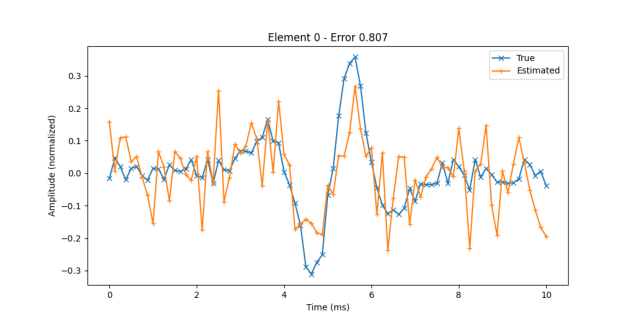

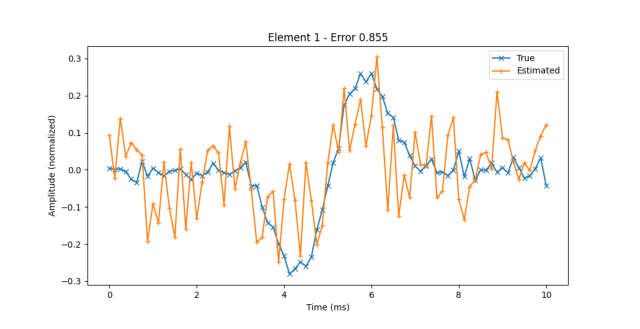

Final dictionary (shifted and interpolated truth):


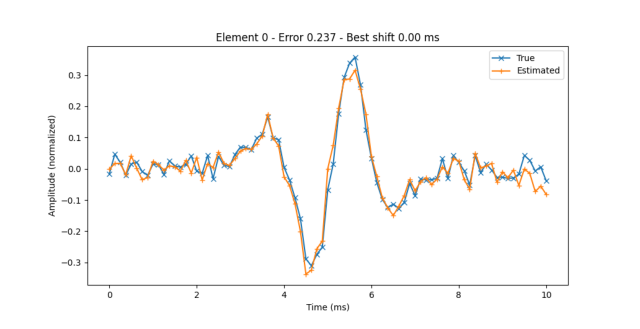

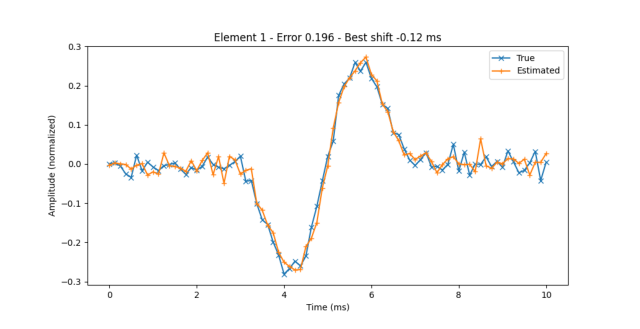

True positive on test set:


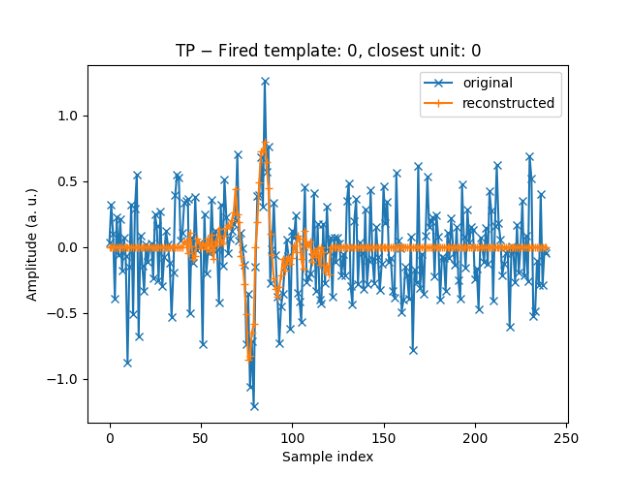

False positive on test set:


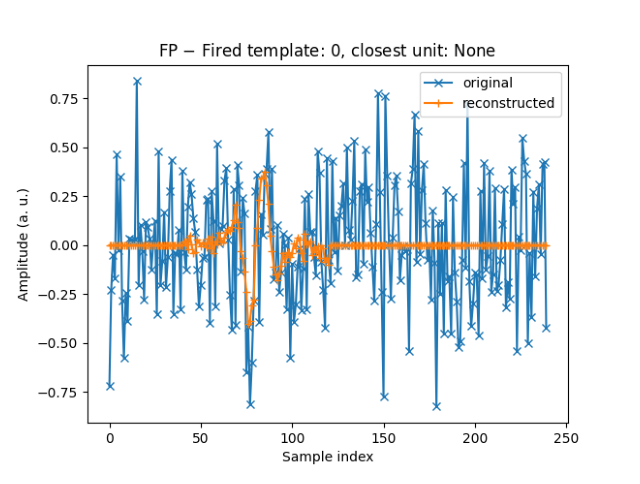

Confusion matrix:


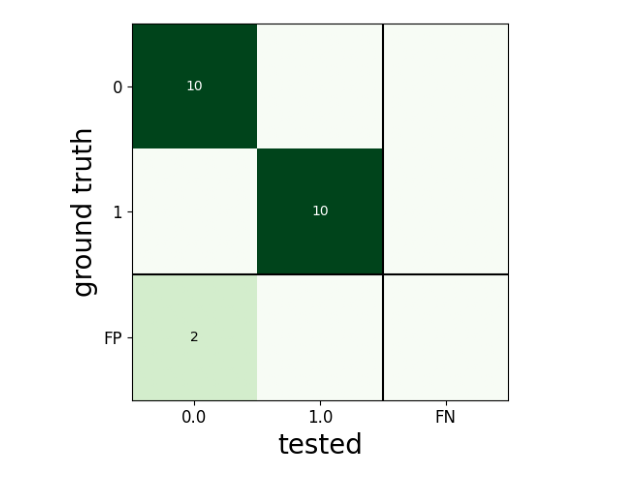

Time:


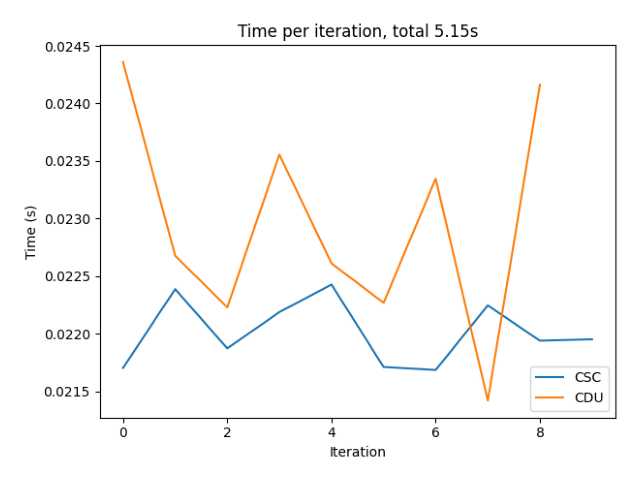

In [49]:
path = f"outputs/synth_experiments/experiment_{experiment}/single/interp_2_0/seed_{experiment+10}"
helper.show_plots(path)

In [50]:
# Run on multiple seeds
!ssrun --multirun dataset=synth_dataset_exp$experiment model=synth_model_exp$experiment experiment=$experiment dataset.gen.seed=range(1,6) model.cdl.interpolate=0,10 output.verbose=0 output.plot=1

[2024-01-08 09:49:23,580][HYDRA] Launching 10 jobs locally
[2024-01-08 09:49:23,580][HYDRA] 	#0 : dataset=synth_dataset_exp6 model=synth_model_exp6 experiment=6 dataset.gen.seed=1 model.cdl.interpolate=0 output.verbose=0 output.plot=1
Figure(2000x500)
Setting 'return_scaled' to False
[2024-01-08 09:49:27,252][HYDRA] 	#1 : dataset=synth_dataset_exp6 model=synth_model_exp6 experiment=6 dataset.gen.seed=1 model.cdl.interpolate=10 output.verbose=0 output.plot=1
Figure(1000x500)
Figure(640x480)
Figure(640x480)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(640x480)
Figure(2000x500)
Setting 'return_scaled' to False
[2024-01-08 09:49:37,381][HYDRA] 	#2 : dataset=synth_dataset_exp6 model=synth_model_exp6 experiment=6 dataset.gen.seed=2 model.cdl.interpolate=0 output.verbose=0 output.plot=1
Figure(1000x500)
Figure(640x480)
Figure(640x480)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000


extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

detect peaks using by_channel: 100%|##########| 3/3 [00:00<?, ?it/s]
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\model\cdl.py:399: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_spike_sorting["diff"] = diffs_norm
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\model\cdl.py:399: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-

In [51]:
helper.report_multi_run_results(experiment)

Averaged accuracy by interpolation and unit:
interpolation: 0
unit 0: 0.497 +/- 0.417
unit 1: 1.000 +/- 0.000
Overall: 0.748 +/- 0.388

interpolation: 10
unit 0: 0.767 +/- 0.389
unit 1: 1.000 +/- 0.000
Overall: 0.883 +/- 0.299


--------------------------
Averaged error and time offset by interpolation and unit:
interpolation: 0
unit 0:
	error: 0.266 +/- 0.050
	offset: 0.075 ms +/- 0.600 ms
unit 1:
	error: 0.196 +/- 0.028
	offset: 0.125 ms +/- 0.112 ms
Overall:
	error: 0.2311286831187347 +/- 0.053694198296824015
	offset: 0.1 +/- 0.43229041164476456

interpolation: 10
unit 0:
	error: 0.221 +/- 0.028
	offset: 0.175 ms +/- 0.423 ms
unit 1:
	error: 0.198 +/- 0.035
	offset: 0.025 ms +/- 0.200 ms
Overall:
	error: 0.20944576202644613 +/- 0.03351756634545534
	offset: 0.1 +/- 0.33911649915626346



#### Experiment 7
A larger segment is used to pre-select peaks before identification. It is set to 60ms, when the default was 15ms.

In [52]:
experiment = 7

In [53]:
# Single run with interpolation
!ssrun dataset=synth_dataset_exp$experiment model=synth_model_exp$experiment experiment=$experiment


experiment: 7
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: synth
  name: synthetic
  recording: synthetic
  uri: null
  tstart_s: null
  tstop_s: null
  duration_s: null
  tstart_test_s: null
  tstop_test_s: null
  channel: 0
  detect_threshold: 5
  preprocess: false
  preprocess_params:
    freq_min: null
    freq_max: null
  window:
    split: true
    window_size_s: 0.06
  sources:
    num: 2
    length_ms: 10.125
  gen:
    seed: 17
    noise: 0.1
    amps:
    - 1
    - 2
    numOfEvents: 10
    T: 3
  fs: 8000
model:
  dictionary:
    num_elements: 2
    element_length_ms: 10.125
    init_templates: real_noisy
    real_random_noise: 0.2
    real_offset_ms: 0.5
  cdl:
    num_iterations: 10
    interpolate: 10
    sparsity_tol: 1
    sparsity_tol_test: 25
    rel_amp_split_test: 0.6
    error_tol: 0.01
    interpolator_type: sinc
    permute_templates: false

Working direc


extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

detect peaks using by_channel: 100%|##########| 3/3 [00:00<?, ?it/s]

0it [00:00, ?it/s]
19it [00:00, 935.37it/s]

100%|██████████| 19/19 [00:00<00:00, 57.49it/s]

100%|██████████| 19/19 [00:00<00:00, 58.98it/s]

100%|██████████| 19/19 [00:00<00:00, 58.32it/s]

100%|██████████| 19/19 [00:00<00:00, 59.62it/s]
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\outputs\plot.py:126: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,5))

100%|██████████| 19/19 [00:00<00:00, 59.46it/s]

100%|██████████| 19/19 [00:00<00:00, 58.27it/s]

1

Initial dictionary:


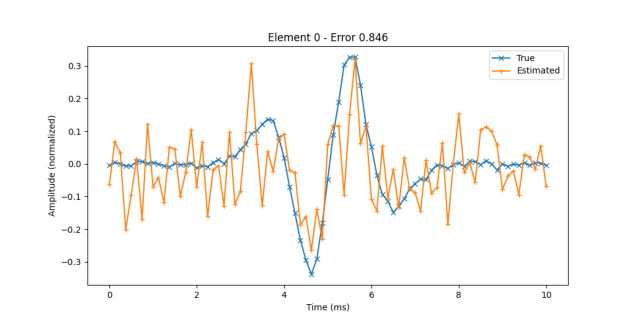

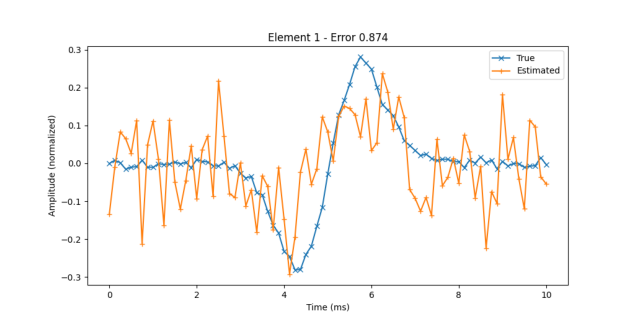

Final dictionary (shifted and interpolated truth):


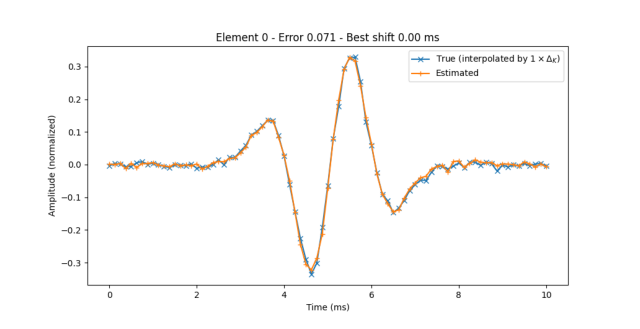

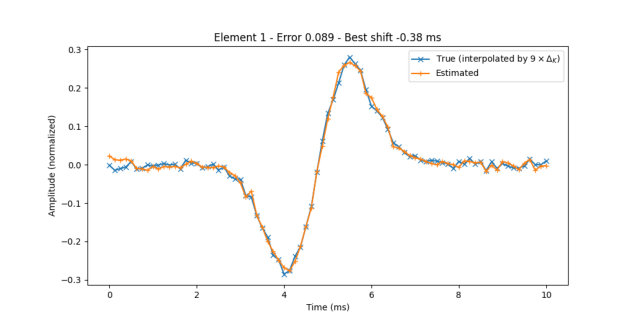

True positive on test set:


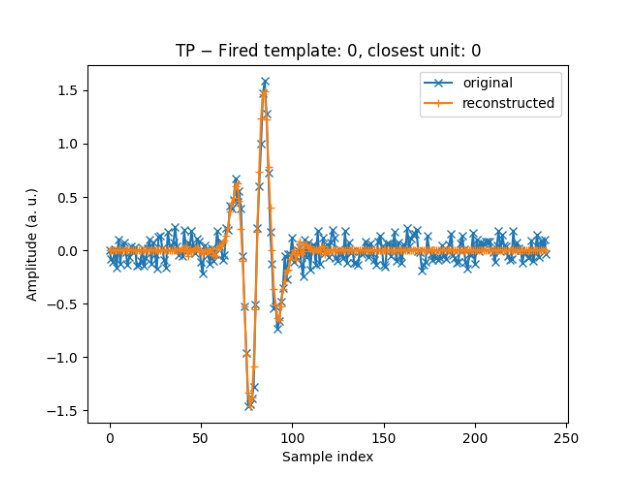

False positive on test set:


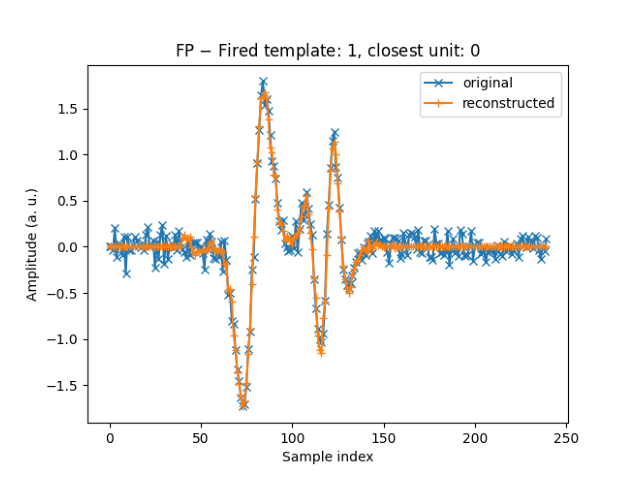

Confusion matrix:


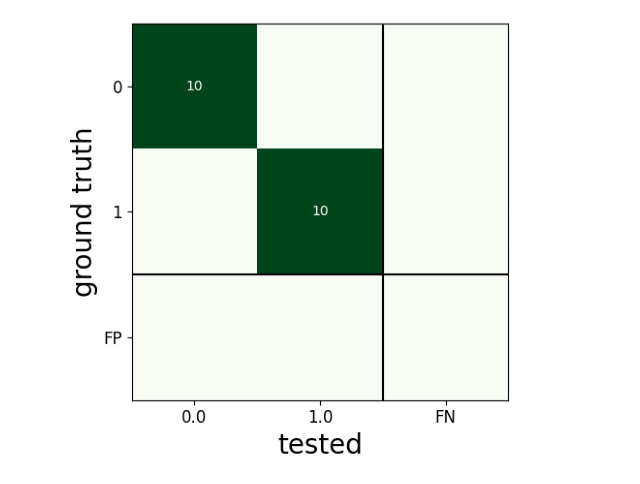

Time:


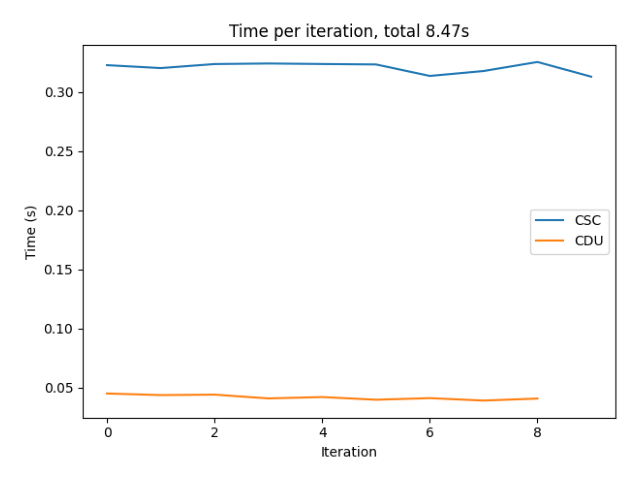

In [54]:
path = f"outputs/synth_experiments/experiment_{experiment}/single/interp_2_10/seed_{experiment+10}"
helper.show_plots(path)

In [55]:
# Single run without interpolation
!ssrun dataset=synth_dataset_exp$experiment model=synth_model_exp$experiment experiment=$experiment model.cdl.interpolate=0


experiment: 7
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: synth
  name: synthetic
  recording: synthetic
  uri: null
  tstart_s: null
  tstop_s: null
  duration_s: null
  tstart_test_s: null
  tstop_test_s: null
  channel: 0
  detect_threshold: 5
  preprocess: false
  preprocess_params:
    freq_min: null
    freq_max: null
  window:
    split: true
    window_size_s: 0.06
  sources:
    num: 2
    length_ms: 10.125
  gen:
    seed: 17
    noise: 0.1
    amps:
    - 1
    - 2
    numOfEvents: 10
    T: 3
  fs: 8000
model:
  dictionary:
    num_elements: 2
    element_length_ms: 10.125
    init_templates: real_noisy
    real_random_noise: 0.2
    real_offset_ms: 0.5
  cdl:
    num_iterations: 10
    interpolate: 0
    sparsity_tol: 1
    sparsity_tol_test: 25
    rel_amp_split_test: 0.6
    error_tol: 0.01
    interpolator_type: sinc
    permute_templates: false

Working direct


extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

detect peaks using by_channel: 100%|##########| 3/3 [00:00<?, ?it/s]

0it [00:00, ?it/s]
19it [00:00, 942.32it/s]

100%|██████████| 19/19 [00:00<00:00, 471.31it/s]

100%|██████████| 19/19 [00:00<00:00, 602.36it/s]

100%|██████████| 19/19 [00:00<00:00, 622.43it/s]

100%|██████████| 19/19 [00:00<00:00, 471.17it/s]
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\outputs\plot.py:126: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,5))

100%|██████████| 19/19 [00:00<00:00, 467.21it/s]

100%|██████████| 19/19 [00:00<00:00, 541.82it

Initial dictionary:


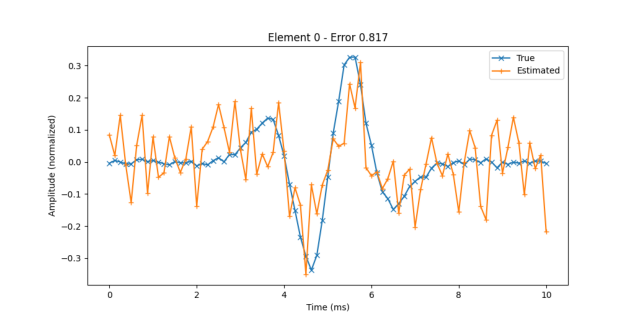

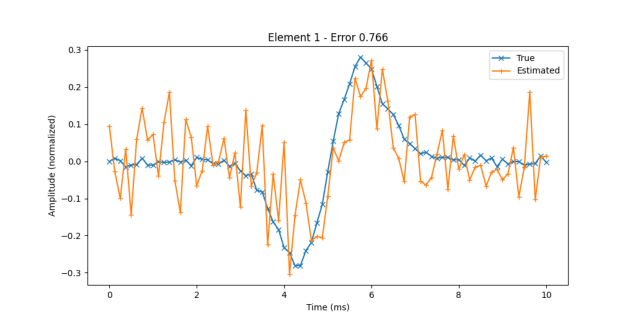

Final dictionary (shifted and interpolated truth):


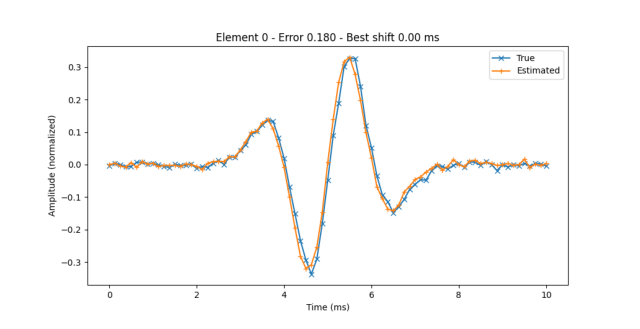

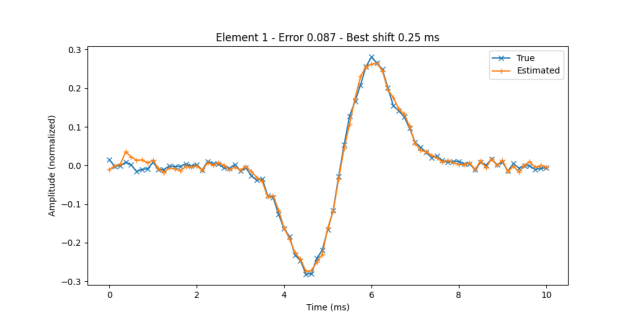

True positive on test set:


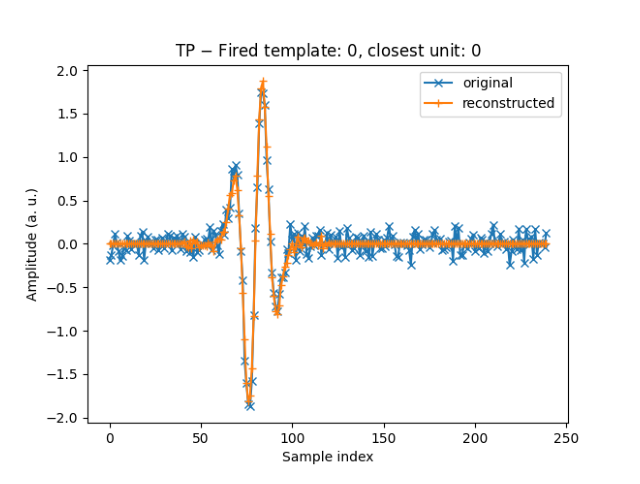

False positive on test set:


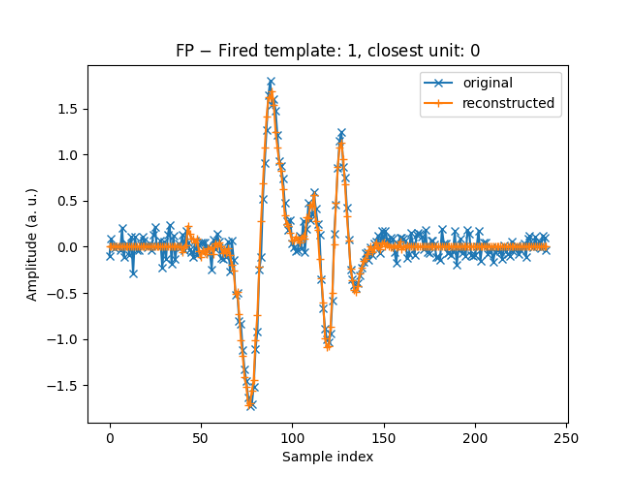

Confusion matrix:


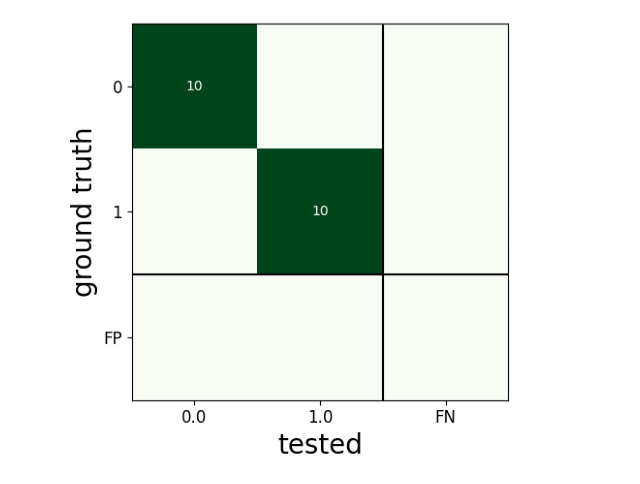

Time:


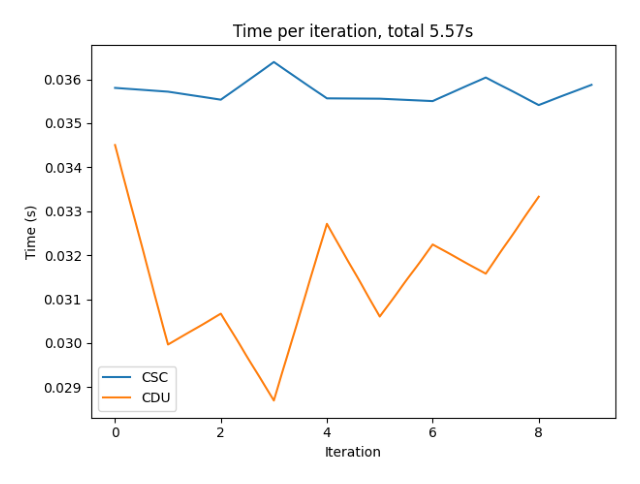

In [56]:
path = f"outputs/synth_experiments/experiment_{experiment}/single/interp_2_0/seed_{experiment+10}"
helper.show_plots(path)

In [57]:
# Run on multiple seeds
!ssrun --multirun dataset=synth_dataset_exp$experiment model=synth_model_exp$experiment experiment=$experiment dataset.gen.seed=range(1,6) model.cdl.interpolate=0,10 output.verbose=0 output.plot=1

[2024-01-08 09:51:09,473][HYDRA] Launching 10 jobs locally
[2024-01-08 09:51:09,473][HYDRA] 	#0 : dataset=synth_dataset_exp7 model=synth_model_exp7 experiment=7 dataset.gen.seed=1 model.cdl.interpolate=0 output.verbose=0 output.plot=1
Figure(2000x500)
Setting 'return_scaled' to False
[2024-01-08 09:51:13,571][HYDRA] 	#1 : dataset=synth_dataset_exp7 model=synth_model_exp7 experiment=7 dataset.gen.seed=1 model.cdl.interpolate=10 output.verbose=0 output.plot=1
Figure(1000x500)
Figure(640x480)
Figure(640x480)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(640x480)
Figure(2000x500)
Setting 'return_scaled' to False
[2024-01-08 09:51:23,631][HYDRA] 	#2 : dataset=synth_dataset_exp7 model=synth_model_exp7 experiment=7 dataset.gen.seed=2 model.cdl.interpolate=0 output.verbose=0 output.plot=1
Figure(1000x500)
Figure(640x480)
Figure(640x480)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000


extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

detect peaks using by_channel: 100%|##########| 3/3 [00:00<?, ?it/s]
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\model\cdl.py:399: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_spike_sorting["diff"] = diffs_norm
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\model\cdl.py:399: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-

In [58]:
helper.report_multi_run_results(experiment)

Averaged accuracy by interpolation and unit:
interpolation: 0
unit 0: 1.000 +/- 0.000
unit 1: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000

interpolation: 10
unit 0: 0.700 +/- 0.400
unit 1: 0.800 +/- 0.400
Overall: 0.750 +/- 0.403


--------------------------
Averaged error and time offset by interpolation and unit:
interpolation: 0
unit 0:
	error: 0.144 +/- 0.049
	offset: 0.025 ms +/- 0.050 ms
unit 1:
	error: 0.100 +/- 0.030
	offset: -0.050 ms +/- 0.100 ms
Overall:
	error: 0.12177540153350505 +/- 0.04635303972537101
	offset: -0.0125 +/- 0.08750000000000001

interpolation: 10
unit 0:
	error: 0.208 +/- 0.230
	offset: -0.225 ms +/- 0.330 ms
unit 1:
	error: 0.242 +/- 0.348
	offset: 0.000 ms +/- 0.079 ms
Overall:
	error: 0.22510794890623273 +/- 0.29523165790861816
	offset: -0.1125 +/- 0.26487025125521363



#### Experiment 8
The cubic interpolator is used (default was sinc).

In [59]:
experiment = 8

In [60]:
# Single run with interpolation
!ssrun dataset=synth_dataset_exp$experiment model=synth_model_exp$experiment experiment=$experiment


experiment: 8
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: synth
  name: synthetic
  recording: synthetic
  uri: null
  tstart_s: null
  tstop_s: null
  duration_s: null
  tstart_test_s: null
  tstop_test_s: null
  channel: 0
  detect_threshold: 5
  preprocess: false
  preprocess_params:
    freq_min: null
    freq_max: null
  window:
    split: true
    window_size_s: 0.015
  sources:
    num: 2
    length_ms: 10.125
  gen:
    seed: 18
    noise: 0.1
    amps:
    - 1
    - 2
    numOfEvents: 10
    T: 3
  fs: 8000
model:
  dictionary:
    num_elements: 2
    element_length_ms: 10.125
    init_templates: real_noisy
    real_random_noise: 0.2
    real_offset_ms: 0.5
  cdl:
    num_iterations: 10
    interpolate: 10
    sparsity_tol: 1
    sparsity_tol_test: 25
    rel_amp_split_test: 0.6
    error_tol: 0.01
    interpolator_type: cubic
    permute_templates: false

Working dir


extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<00:00, 3239.68it/s]

detect peaks using by_channel: 100%|##########| 3/3 [00:00<?, ?it/s]

0it [00:00, ?it/s]
19it [00:00, 936.17it/s]

100%|██████████| 19/19 [00:00<00:00, 66.27it/s]

100%|██████████| 19/19 [00:00<00:00, 66.87it/s]

100%|██████████| 19/19 [00:00<00:00, 66.43it/s]

100%|██████████| 19/19 [00:00<00:00, 66.48it/s]
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\outputs\plot.py:126: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,5))

100%|██████████| 19/19 [00:00<00:00, 50.29it/s]

100%|██████████| 19/19 [00:00<00:00, 52.

Initial dictionary:


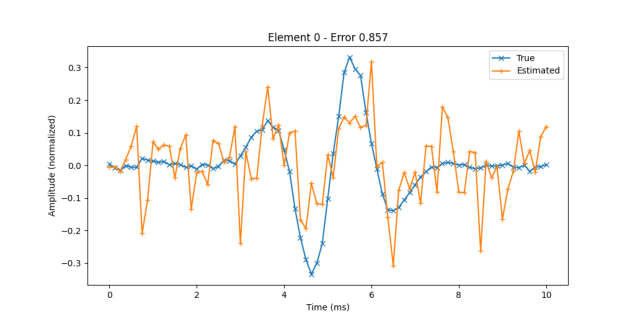

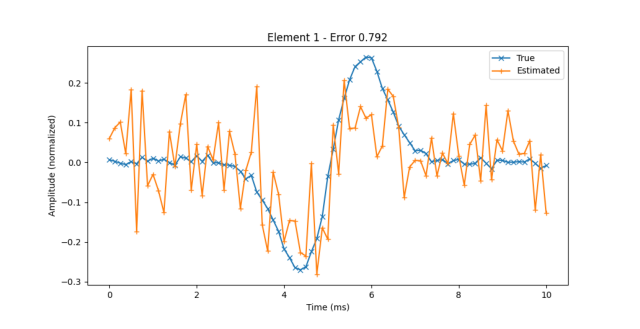

Final dictionary (shifted and interpolated truth):


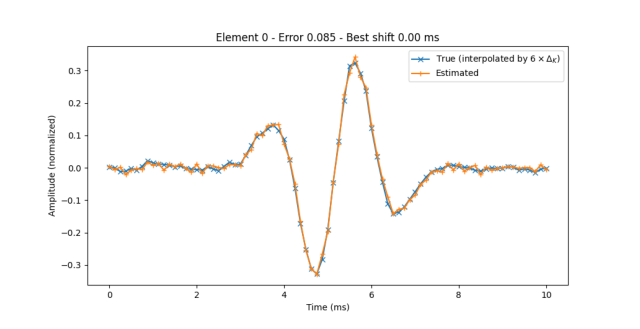

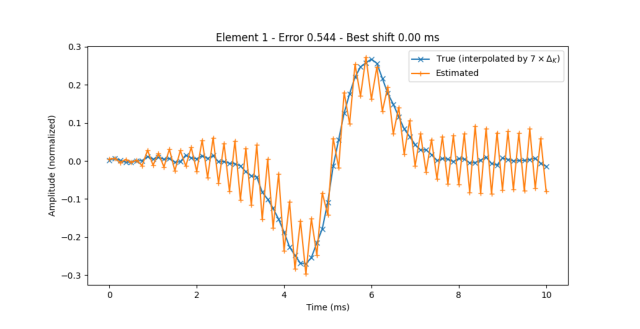

True positive on test set:


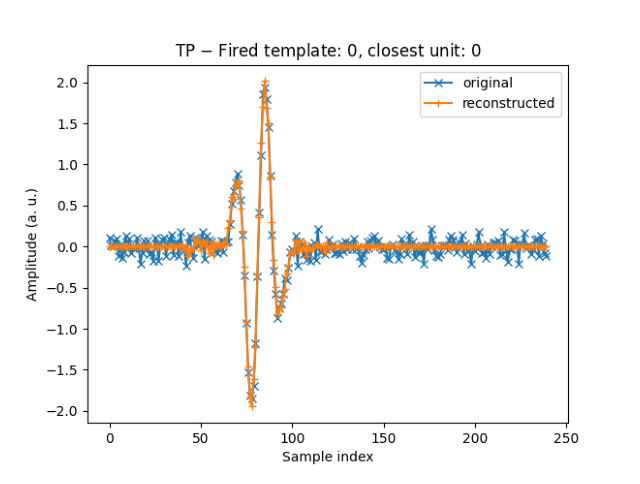

False positive on test set:
No false positive for test run.
Confusion matrix:


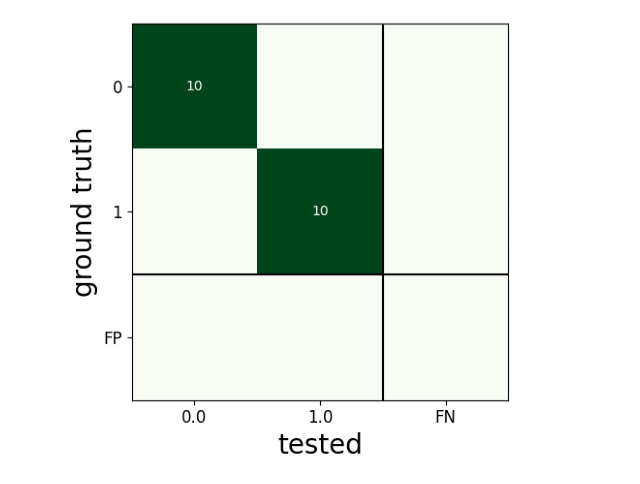

Time:


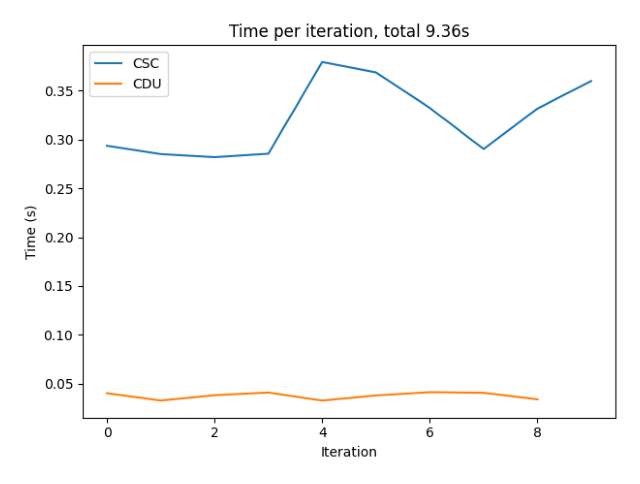

In [61]:
path = f"outputs/synth_experiments/experiment_{experiment}/single/interp_2_10/seed_{experiment+10}"
helper.show_plots(path)

In [62]:
# Single run without interpolation
!ssrun dataset=synth_dataset_exp$experiment model=synth_model_exp$experiment experiment=$experiment model.cdl.interpolate=0


experiment: 8
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: synth
  name: synthetic
  recording: synthetic
  uri: null
  tstart_s: null
  tstop_s: null
  duration_s: null
  tstart_test_s: null
  tstop_test_s: null
  channel: 0
  detect_threshold: 5
  preprocess: false
  preprocess_params:
    freq_min: null
    freq_max: null
  window:
    split: true
    window_size_s: 0.015
  sources:
    num: 2
    length_ms: 10.125
  gen:
    seed: 18
    noise: 0.1
    amps:
    - 1
    - 2
    numOfEvents: 10
    T: 3
  fs: 8000
model:
  dictionary:
    num_elements: 2
    element_length_ms: 10.125
    init_templates: real_noisy
    real_random_noise: 0.2
    real_offset_ms: 0.5
  cdl:
    num_iterations: 10
    interpolate: 0
    sparsity_tol: 1
    sparsity_tol_test: 25
    rel_amp_split_test: 0.6
    error_tol: 0.01
    interpolator_type: cubic
    permute_templates: false

Working dire


extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

detect peaks using by_channel: 100%|##########| 3/3 [00:00<00:00, 1778.75it/s]

0it [00:00, ?it/s]
19it [00:00, 987.76it/s]

100%|██████████| 19/19 [00:00<00:00, 511.27it/s]

100%|██████████| 19/19 [00:00<00:00, 558.59it/s]

100%|██████████| 19/19 [00:00<00:00, 561.58it/s]

100%|██████████| 19/19 [00:00<00:00, 583.13it/s]
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\outputs\plot.py:126: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,5))

100%|██████████| 19/19 [00:00<00:00, 598.47it/s]

100%|██████████| 19/19 [00:00<00:00

Initial dictionary:


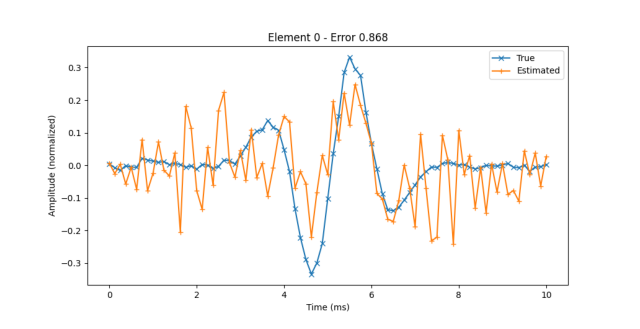

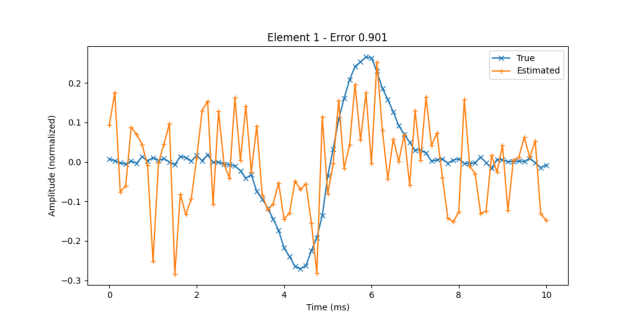

Final dictionary (shifted and interpolated truth):


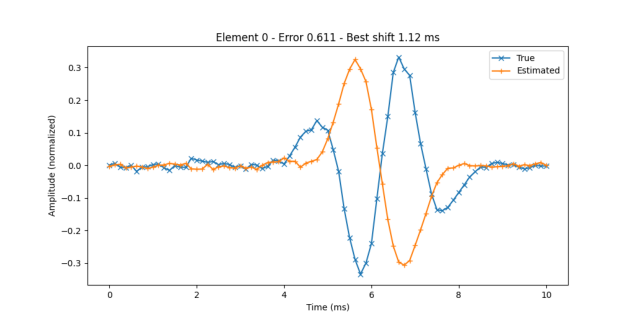

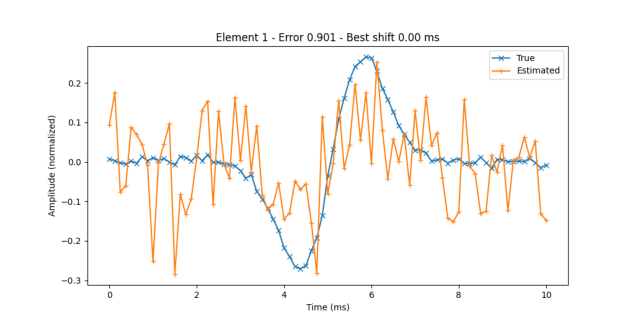

True positive on test set:


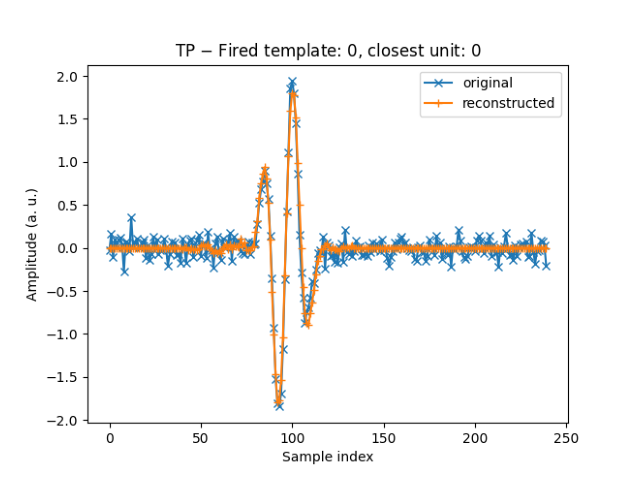

False positive on test set:
No false positive for test run.
Confusion matrix:


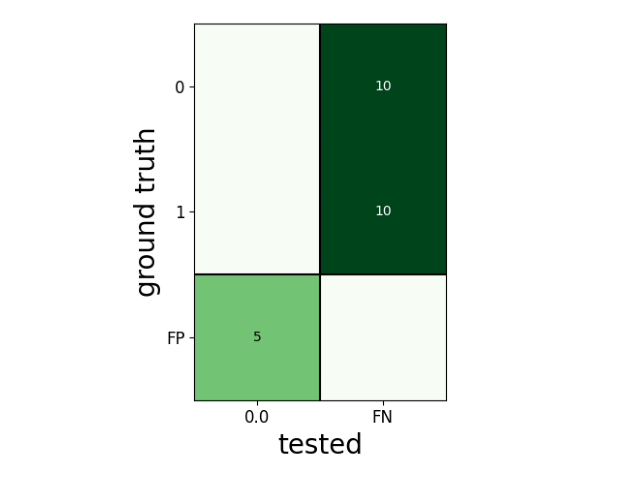

Time:


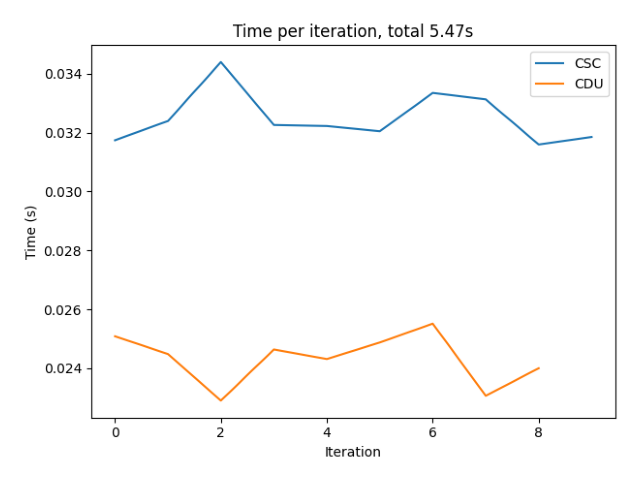

In [63]:
path = f"outputs/synth_experiments/experiment_{experiment}/single/interp_2_0/seed_{experiment+10}"
helper.show_plots(path)

In [64]:
# Run on multiple seeds
!ssrun --multirun dataset=synth_dataset_exp$experiment model=synth_model_exp$experiment experiment=$experiment dataset.gen.seed=range(1,6) model.cdl.interpolate=0,10 output.verbose=0 output.plot=1

[2024-01-08 09:53:02,703][HYDRA] Launching 10 jobs locally
[2024-01-08 09:53:02,703][HYDRA] 	#0 : dataset=synth_dataset_exp8 model=synth_model_exp8 experiment=8 dataset.gen.seed=1 model.cdl.interpolate=0 output.verbose=0 output.plot=1
Figure(2000x500)
Setting 'return_scaled' to False
[2024-01-08 09:53:06,585][HYDRA] 	#1 : dataset=synth_dataset_exp8 model=synth_model_exp8 experiment=8 dataset.gen.seed=1 model.cdl.interpolate=10 output.verbose=0 output.plot=1
Figure(1000x500)
Figure(640x480)
Figure(640x480)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(640x480)
Figure(2000x500)
Setting 'return_scaled' to False
[2024-01-08 09:53:16,761][HYDRA] 	#2 : dataset=synth_dataset_exp8 model=synth_model_exp8 experiment=8 dataset.gen.seed=2 model.cdl.interpolate=0 output.verbose=0 output.plot=1
Figure(1000x500)
Figure(640x480)
Figure(640x480)
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)
Figure(1000


extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]

detect peaks using by_channel: 100%|##########| 3/3 [00:00<00:00, 1840.15it/s]
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\model\cdl.py:399: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_spike_sorting["diff"] = diffs_norm
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\model\cdl.py:399: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view

In [65]:
helper.report_multi_run_results(experiment)

Averaged accuracy by interpolation and unit:
interpolation: 0
unit 0: 0.800 +/- 0.400
unit 1: 1.000 +/- 0.000
Overall: 0.900 +/- 0.300

interpolation: 10
unit 0: 1.000 +/- 0.000
unit 1: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000


--------------------------
Averaged error and time offset by interpolation and unit:
interpolation: 0
unit 0:
	error: 0.111 +/- 0.042
	offset: -0.225 ms +/- 0.450 ms
unit 1:
	error: 0.078 +/- 0.021
	offset: 0.000 ms +/- 0.112 ms
Overall:
	error: 0.09469851397021865 +/- 0.037107183153998226
	offset: -0.1125 +/- 0.34663561559655126

interpolation: 10
unit 0:
	error: 0.285 +/- 0.248
	offset: 0.000 ms +/- 0.079 ms
unit 1:
	error: 0.310 +/- 0.217
	offset: 0.050 ms +/- 0.061 ms
Overall:
	error: 0.2972704296419242 +/- 0.23318866922191755
	offset: 0.025 +/- 0.07500000000000001



### Real dataset

Here we focus on the real dataset [paired_mea64_yger](https://spikeforest.flatironinstitute.org/studyresults/paired_mea64c) from *spikeforest*. We selected the channel 18 of the recording *20170622_patch2*, with an SNR of 25 dB. There is one groundtruth unit, but in the recording we have spikes from other neurons as well.

Preprocessing is really important to get good results with CDL. Therefore, we start with good settings, and we compare the COMP and COMP-INTERP performance, with a dictionary of two templates.

We use a threshold of 5 for peak detection, and we use 2 sources because we manually identified two main clusters, including the groundtruth unit. The code uses K-Means for clustering to initialize templates.

Then, we vary the number of templates in the dictionary, and we see if COMP-INTERP performance stands out with less optimized settings.

#### Experiment 1: comparing COMP vs COMP-INTERP with a dictionary of 2 templates 

This cell takes about 1 minute to execute.

In [49]:
!ssrun dataset=real_dataset model=real_dataset_model ++model.cdl.interpolate=0

In [3]:
helper.report_multi_run_results('sandbox', 2, [0, 10], [None], "spikeforest")

Averaged accuracy:
interpolation: 0
unit 0: 0.909 +/- 0.000
Overall: 0.909 +/- 0.000

interpolation: 10
unit 0: 0.909 +/- 0.000
Overall: 0.909 +/- 0.000


--------------------------
Averaged precision:
interpolation: 0
unit 0: 0.909 +/- 0.000
Overall: 0.909 +/- 0.000

interpolation: 10
unit 0: 0.909 +/- 0.000
Overall: 0.909 +/- 0.000


--------------------------
Averaged recall:
interpolation: 0
unit 0: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000

interpolation: 10
unit 0: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000


--------------------------
Averaged error and time offset by interpolation and unit:
interpolation: 0
unit 0:
	error: 0.014 +/- 0.000
	offset: 0.000 ms +/- 0.000 ms
Overall:
	error: 0.014079144335731836 +/- 0.0
	offset: 0.0  ms +/- 0.0 ms

interpolation: 10
unit 0:
	error: 0.019 +/- 0.000
	offset: 0.000 ms +/- 0.000 ms
Overall:
	error: 0.018854184674960466 +/- 0.0
	offset: 0.0  ms +/- 0.0 ms


--------------------------
Averaged runtime by interpolation:
interpolation: 0
	CSC c

Initial dictionary:


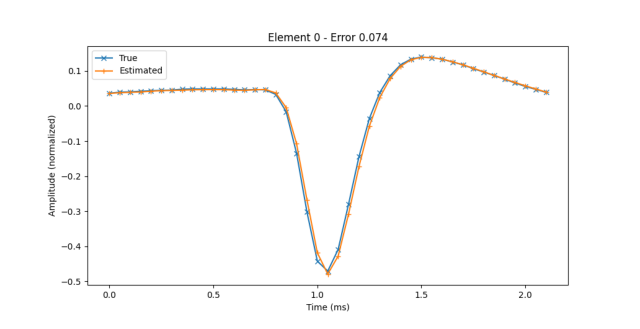

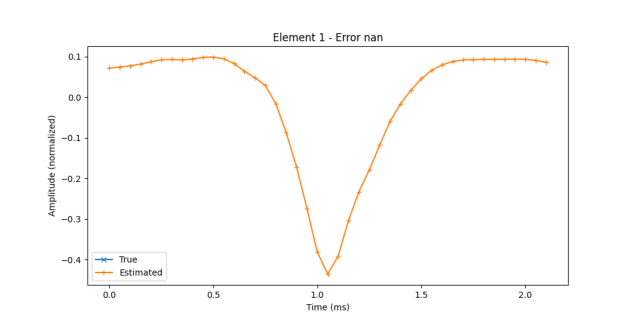

Final dictionary (shifted and interpolated truth):


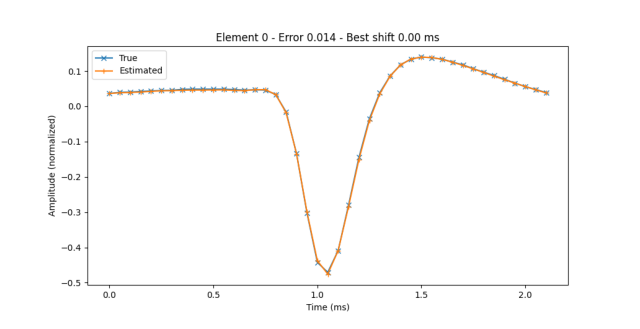

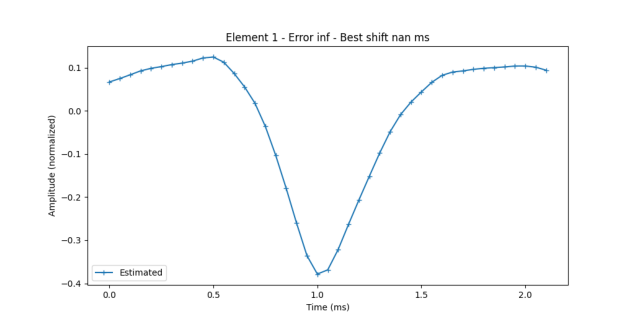

True positive on test set:


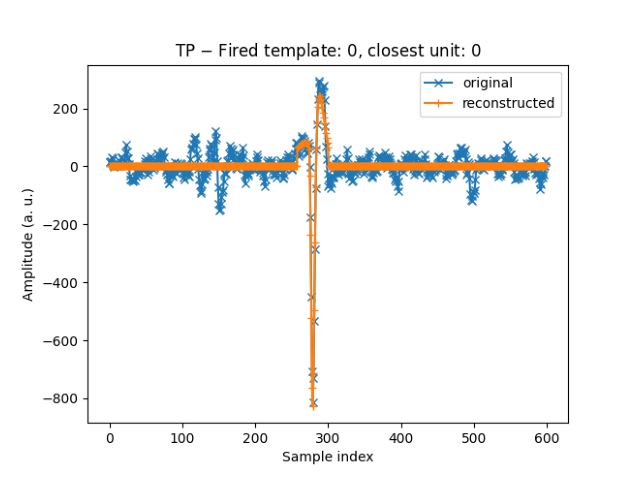

False positive on test set:


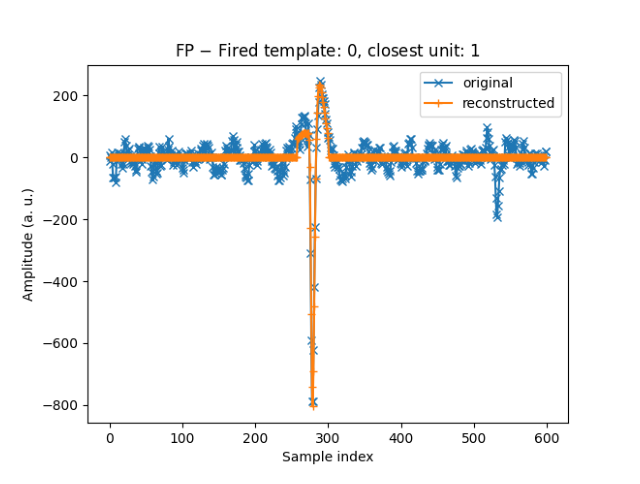

Confusion matrix train:


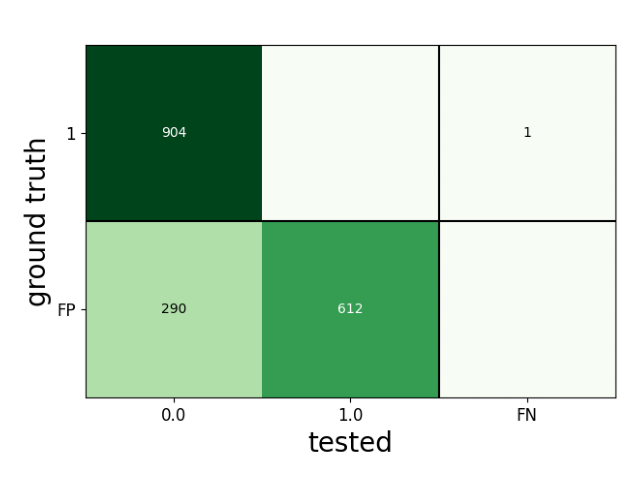

Confusion matrix test:


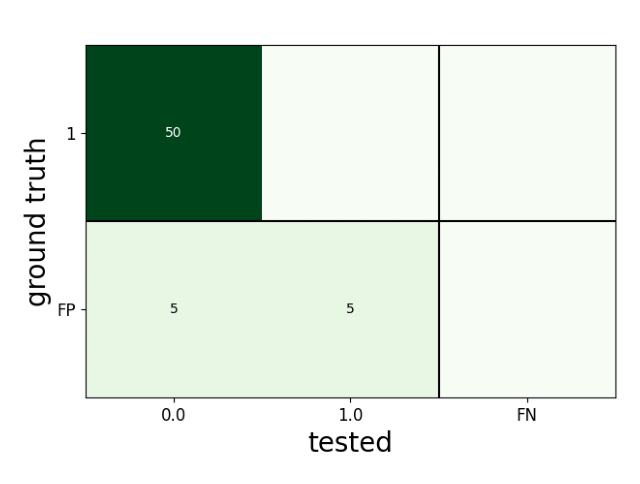

Time:


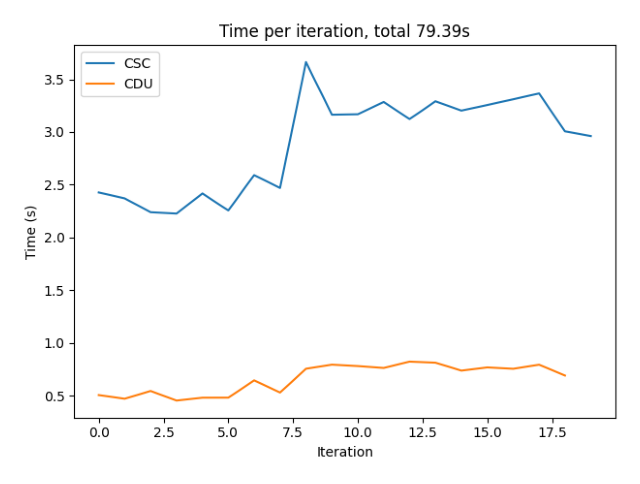

In [4]:
path = f"outputs/spikeforest_experiments/experiment_sandbox/single/interp_2_0/seed_None"
helper.show_plots(path, num_iterations=20, show_confusion_train=True)

This cell takes about 10 minutes to execute. It can be run from a terminal in the same directory as well, if you prefer.

In [ ]:
!ssrun dataset=real_dataset model=real_dataset_model ++model.cdl.interpolate=10

Initial dictionary:


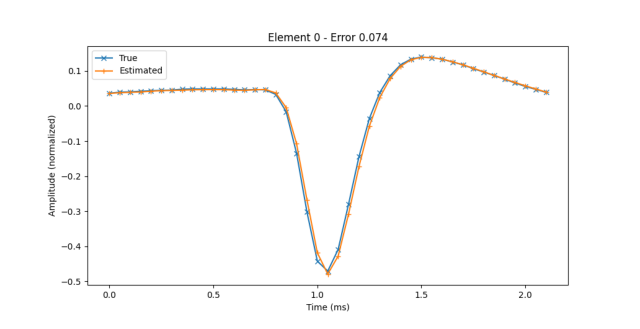

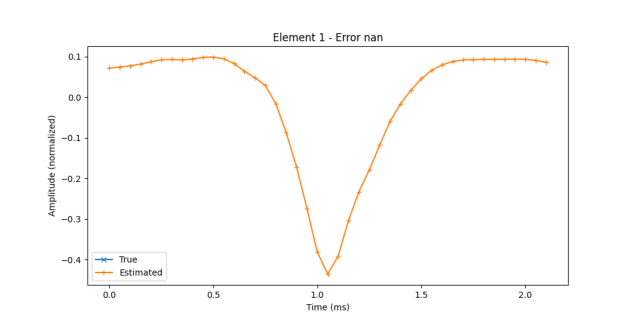

Final dictionary (shifted and interpolated truth):


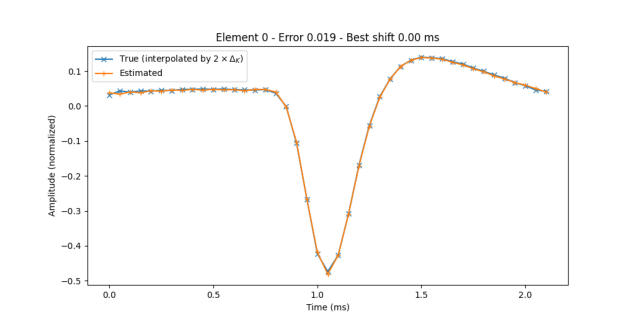

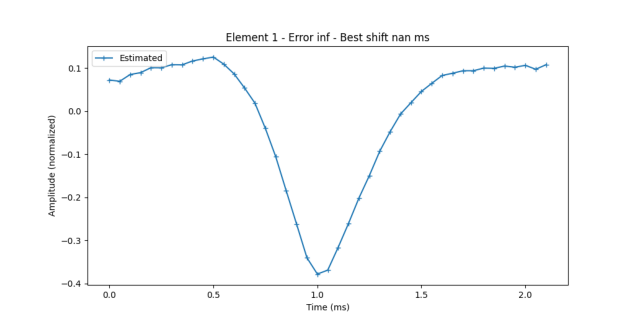

True positive on test set:


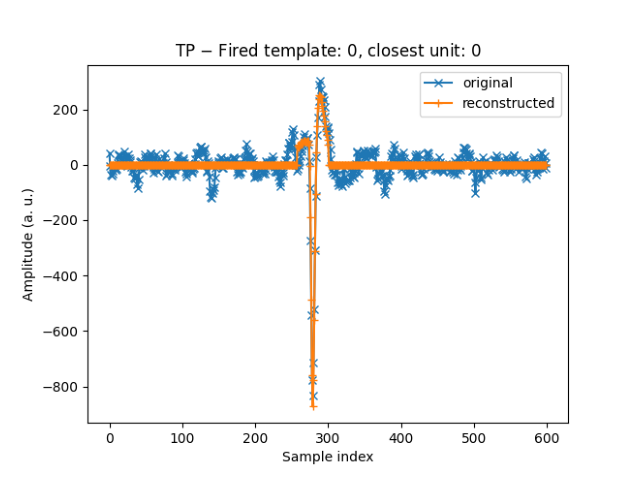

False positive on test set:


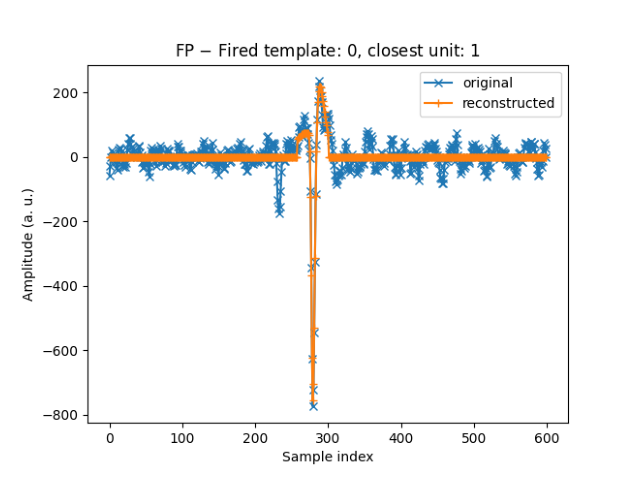

Confusion matrix train:


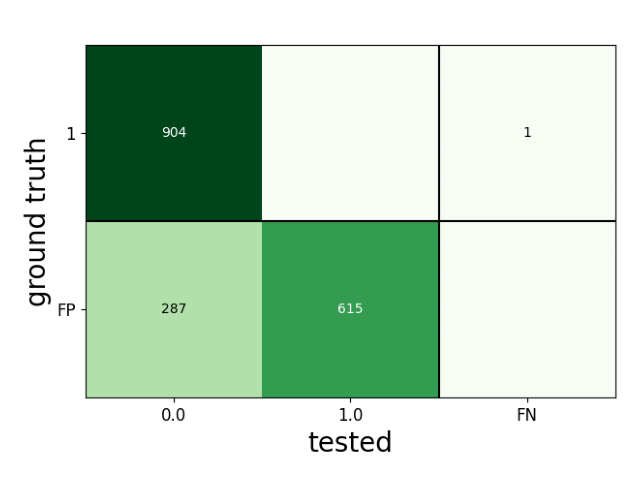

Confusion matrix test:


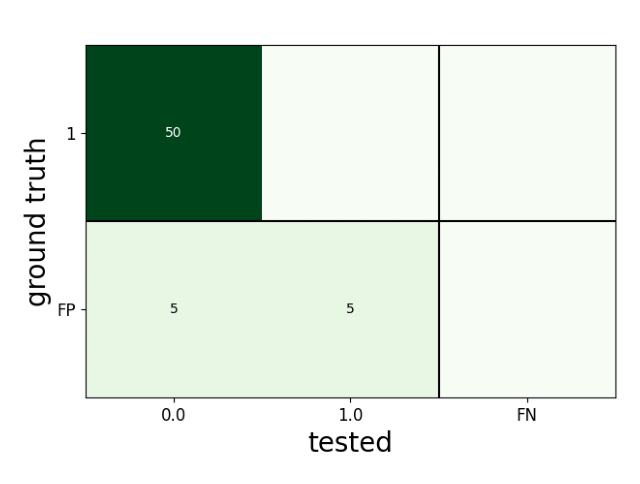

Time:


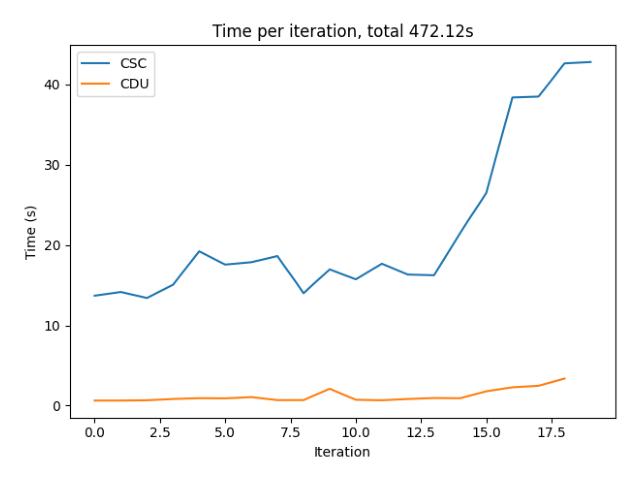

In [5]:
path = f"outputs/spikeforest_experiments/experiment_sandbox/single/interp_2_10/seed_None"
helper.show_plots(path, num_iterations=20, show_confusion_train=True)

NB. With only 10 iterations, the accuracy difference is not present.

#### Experiment 2: comparison with 3 sources

In this experiment, we check if, despite a bad clustering, it can learn good units. 

In [ ]:
!ssrun dataset=real_dataset model=real_dataset_model ++model.cdl.interpolate=0 ++model.dictionary.num_elements=3

In [7]:
helper.report_multi_run_results('sandbox', 3, [0, 10], [None], "spikeforest")

Averaged accuracy:
interpolation: 0
unit 0: 0.500 +/- 0.000
Overall: 0.500 +/- 0.000

interpolation: 10
unit 0: 0.000 +/- 0.000
Overall: 0.000 +/- 0.000


--------------------------
Averaged precision:
interpolation: 0
unit 0: 0.871 +/- 0.000
Overall: 0.871 +/- 0.000

interpolation: 10
unit 0: 0.000 +/- 0.000
Overall: 0.000 +/- 0.000


--------------------------
Averaged recall:
interpolation: 0
unit 0: 0.540 +/- 0.000
Overall: 0.540 +/- 0.000

interpolation: 10
unit 0: 0.000 +/- 0.000
Overall: 0.000 +/- 0.000


--------------------------
Averaged error and time offset by interpolation and unit:
interpolation: 0
unit 0:
	error: 0.021 +/- 0.000
	offset: 0.000 ms +/- 0.000 ms
Overall:
	error: 0.020990929308055923 +/- 0.0
	offset: 0.0  ms +/- 0.0 ms

interpolation: 10
unit 0:
	error: 0.058 +/- 0.000
	offset: 0.000 ms +/- 0.000 ms
Overall:
	error: 0.05807013121946115 +/- 0.0
	offset: 0.0  ms +/- 0.0 ms


--------------------------
Averaged runtime by interpolation:
interpolation: 0
	CSC cu

Initial dictionary:


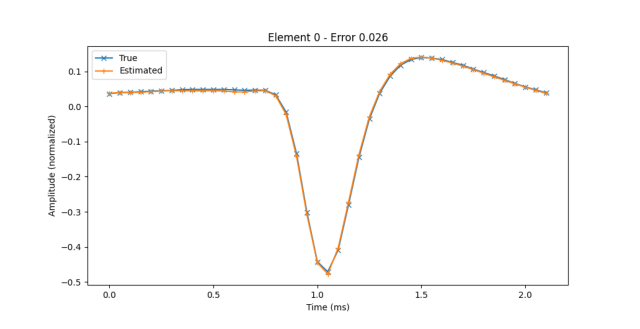

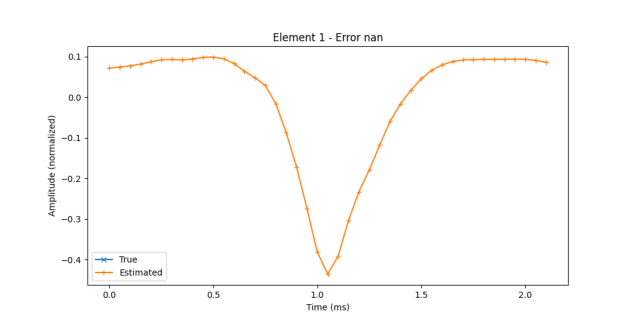

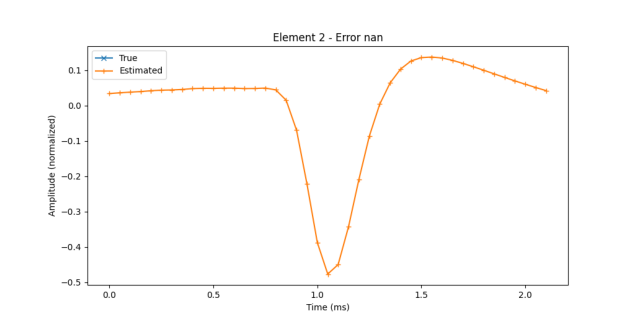

Final dictionary (shifted and interpolated truth):


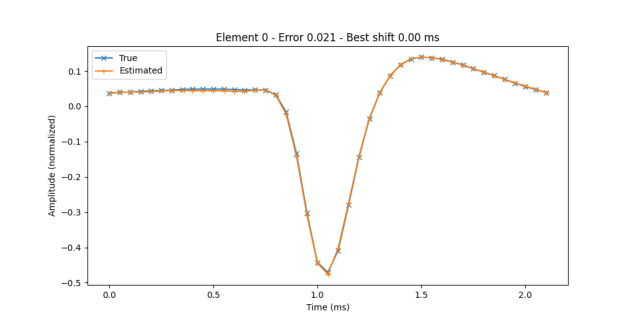

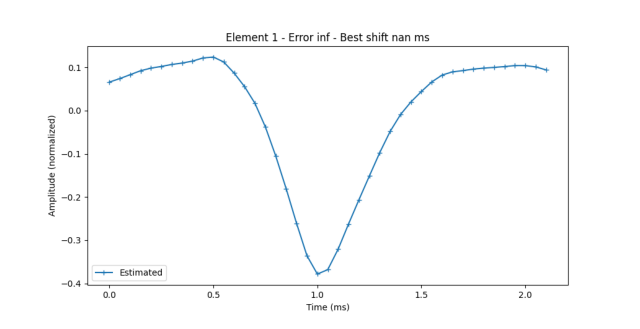

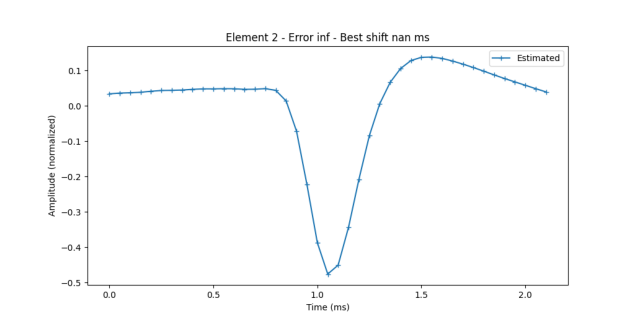

True positive on test set:


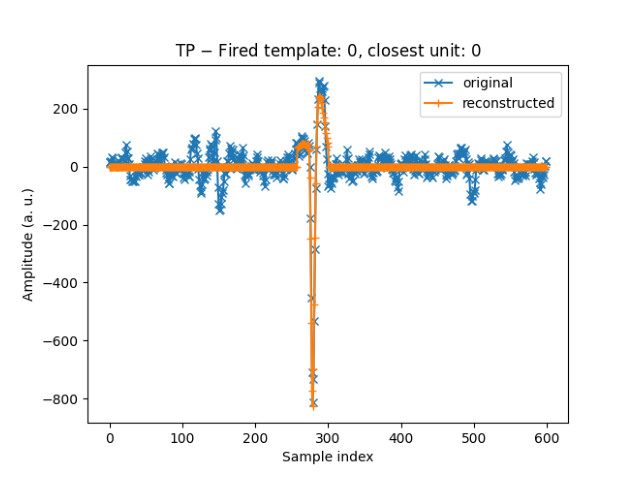

False positive on test set:


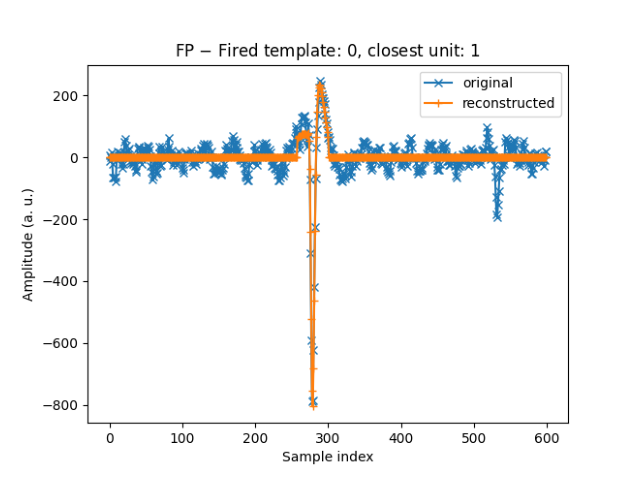

Confusion matrix train:


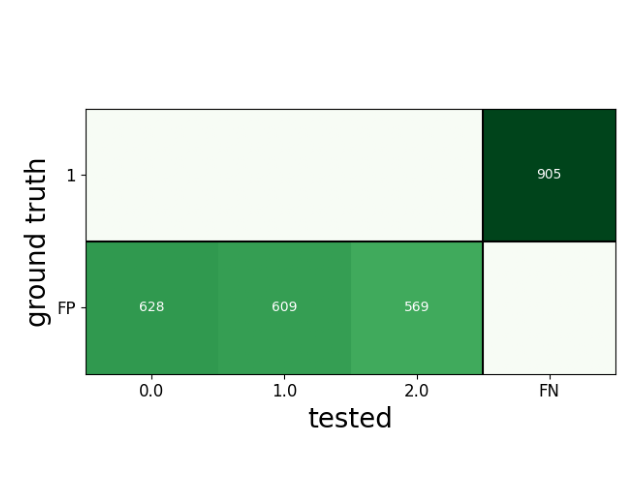

Confusion matrix test:


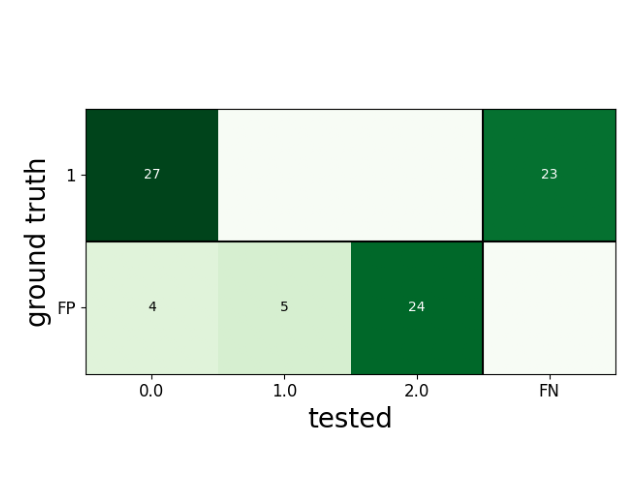

Time:


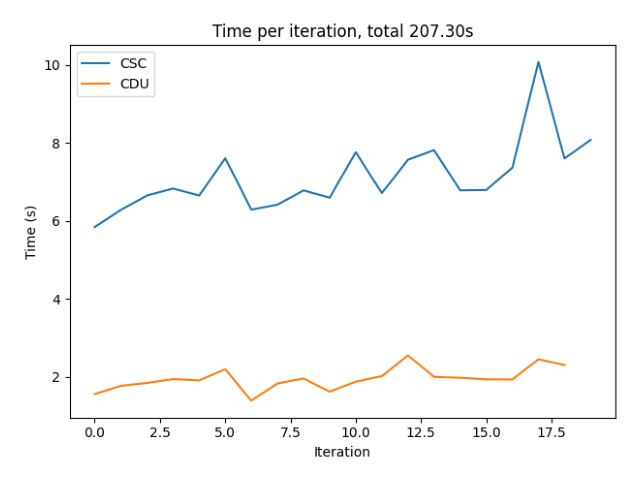

In [8]:
path = f"outputs/spikeforest_experiments/experiment_sandbox/single/interp_3_0/seed_None"
helper.show_plots(path, num_elements=3, num_iterations=20, show_confusion_train=True)

In [ ]:
!ssrun dataset=real_dataset model=real_dataset_model ++model.cdl.interpolate=10 ++model.dictionary.num_elements=3

Initial dictionary:


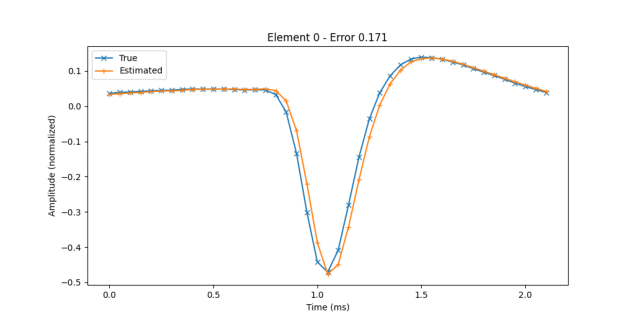

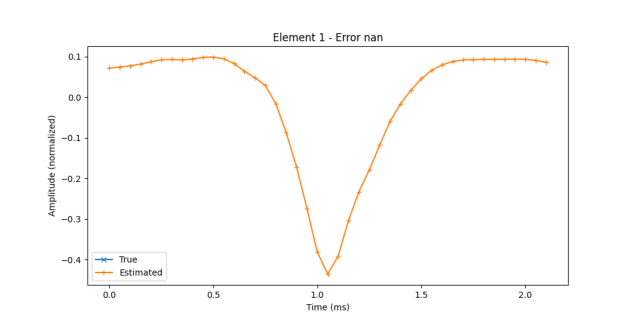

Final dictionary (shifted and interpolated truth):


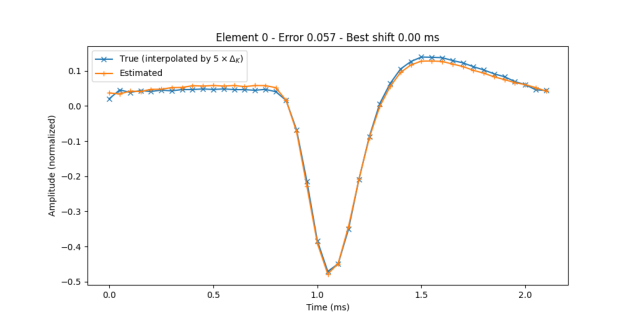

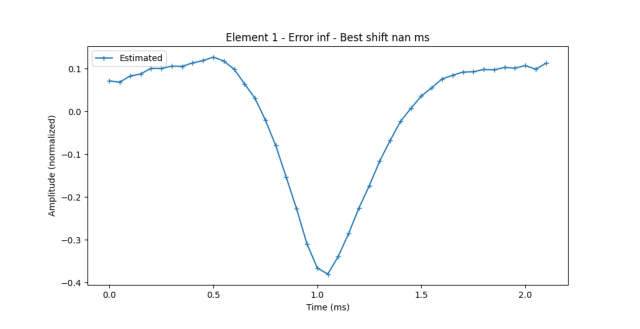

True positive on test set:


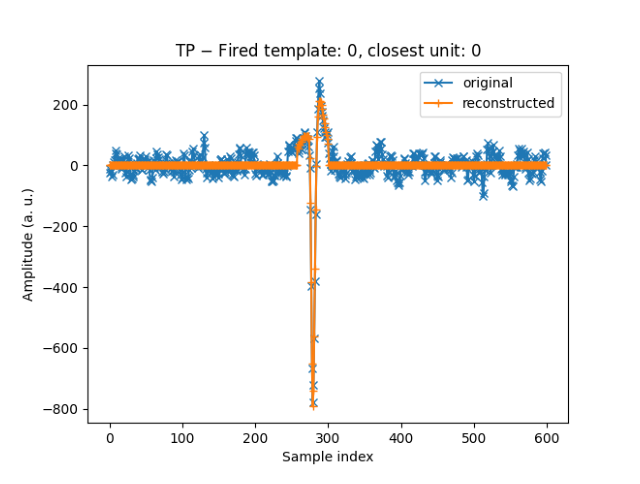

False positive on test set:


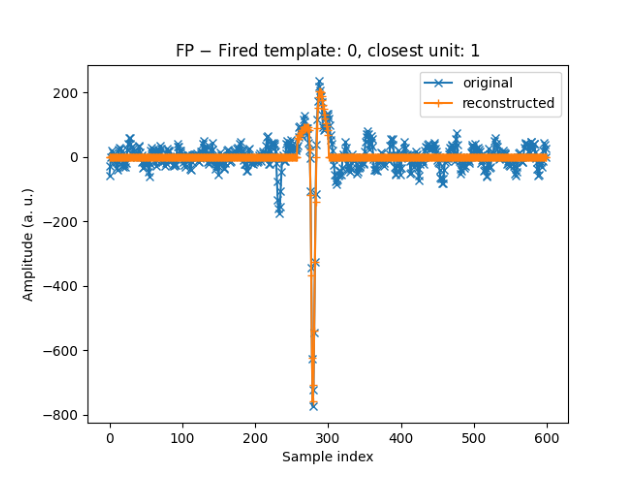

Confusion matrix train:


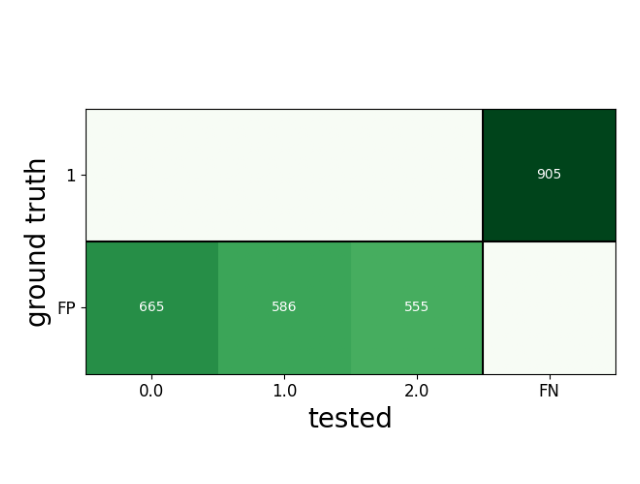

Confusion matrix test:


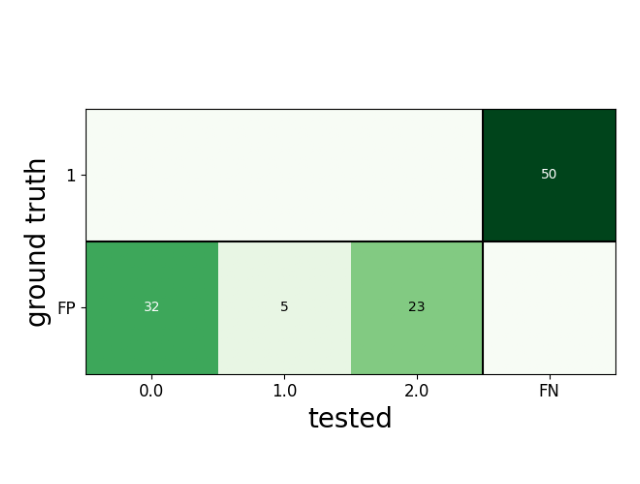

Time:


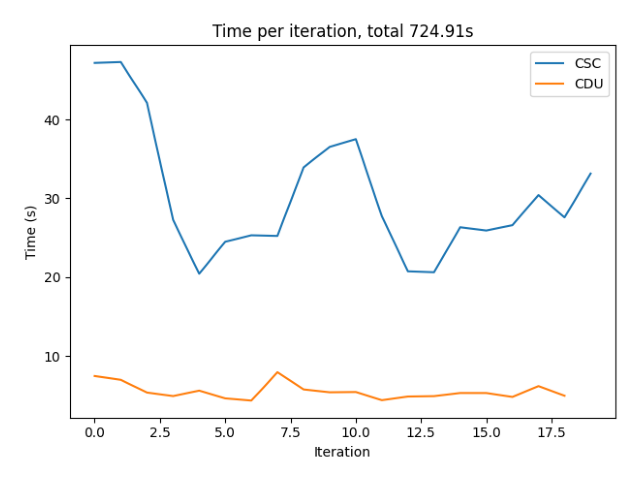

In [9]:
path = f"outputs/spikeforest_experiments/experiment_sandbox/single/interp_3_10/seed_None"
helper.show_plots(path, show_confusion_train=True)

In fact, a postprocessing which merges units would be necessary.

#### Experiment 3: comparison with 1 source

As we expect, we will get many false positives.

In [10]:
helper.report_multi_run_results('sandbox', 1, [0, 10], [None], "spikeforest")

Averaged accuracy:
interpolation: 0
unit 0: 0.909 +/- 0.000
Overall: 0.909 +/- 0.000

interpolation: 10
unit 0: 0.909 +/- 0.000
Overall: 0.909 +/- 0.000


--------------------------
Averaged precision:
interpolation: 0
unit 0: 0.909 +/- 0.000
Overall: 0.909 +/- 0.000

interpolation: 10
unit 0: 0.909 +/- 0.000
Overall: 0.909 +/- 0.000


--------------------------
Averaged recall:
interpolation: 0
unit 0: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000

interpolation: 10
unit 0: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000


--------------------------
Averaged error and time offset by interpolation and unit:
interpolation: 0
unit 0:
	error: 0.039 +/- 0.000
	offset: 0.000 ms +/- 0.000 ms
Overall:
	error: 0.0386792215178177 +/- 0.0
	offset: 0.0  ms +/- 0.0 ms

interpolation: 10
unit 0:
	error: 0.031 +/- 0.000
	offset: 0.000 ms +/- 0.000 ms
Overall:
	error: 0.03135915656969138 +/- 0.0
	offset: 0.0  ms +/- 0.0 ms


--------------------------
Averaged runtime by interpolation:
interpolation: 0
	CSC cumu

Initial dictionary:


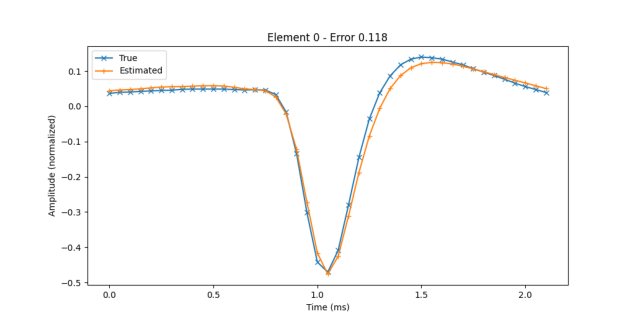

Final dictionary (shifted and interpolated truth):


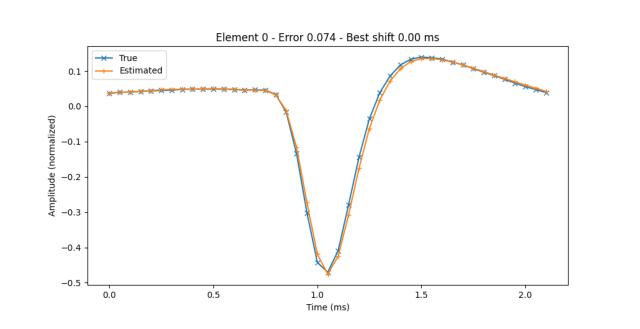

True positive on test set:
No true positive for test run.
False positive on test set:


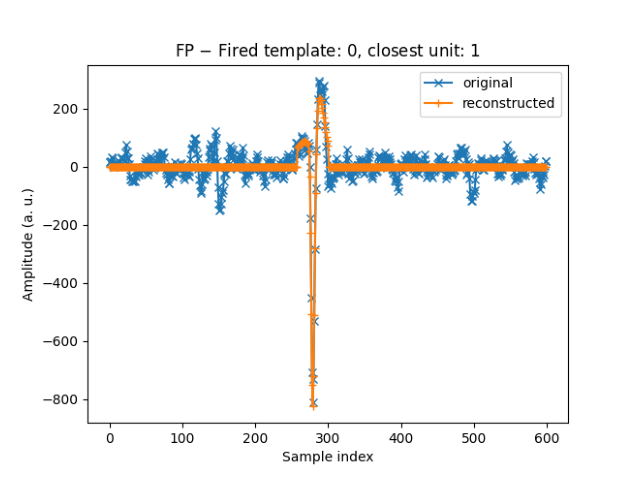

Confusion matrix train:


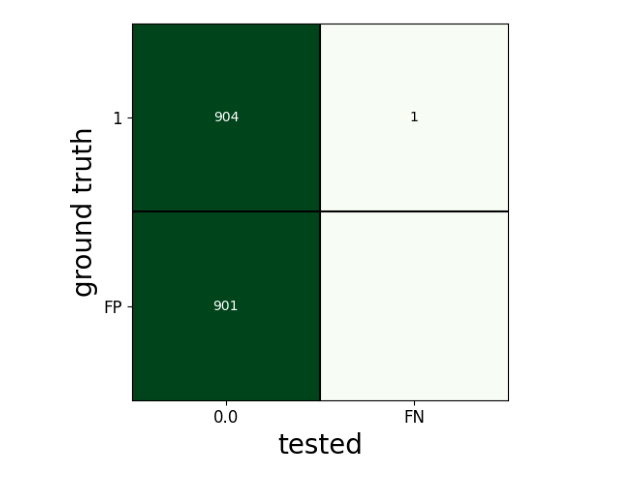

Confusion matrix test:


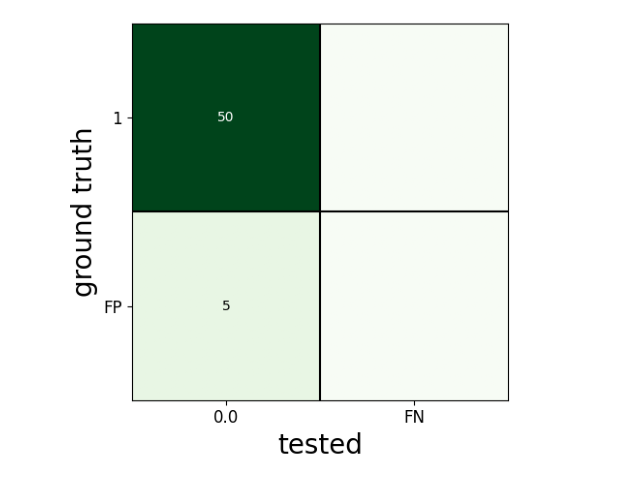

Time:


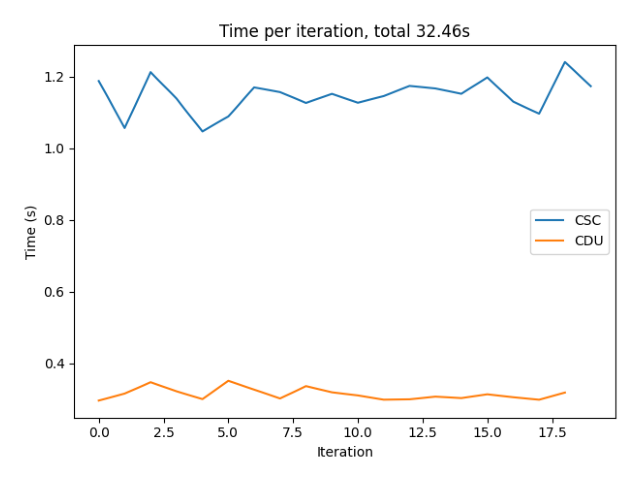

In [ ]:
path = f"outputs/spikeforest_experiments/experiment_sandbox/single/interp_1_0/seed_None"
helper.show_plots(path, num_elements=1, show_confusion_train=True)

Initial dictionary:


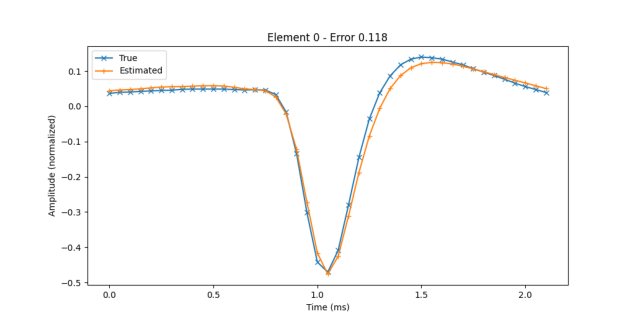

Final dictionary (shifted and interpolated truth):


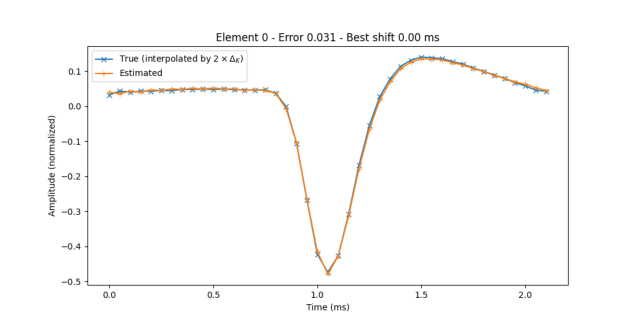

True positive on test set:
No true positive for test run.
False positive on test set:


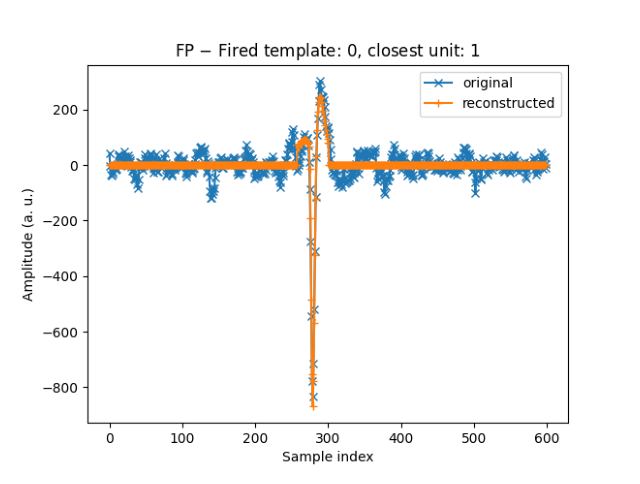

Confusion matrix train:


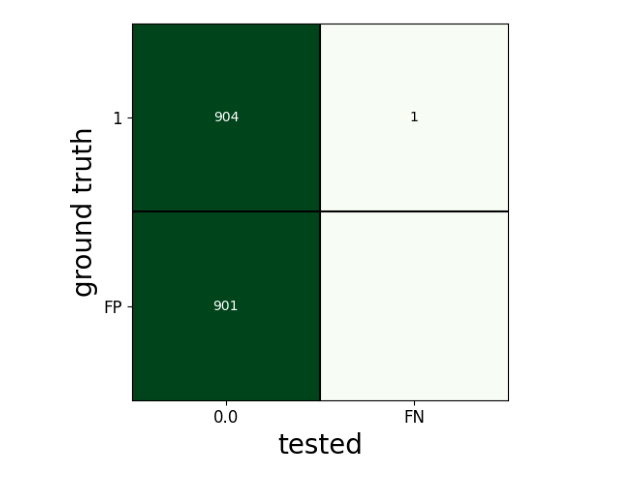

Confusion matrix test:


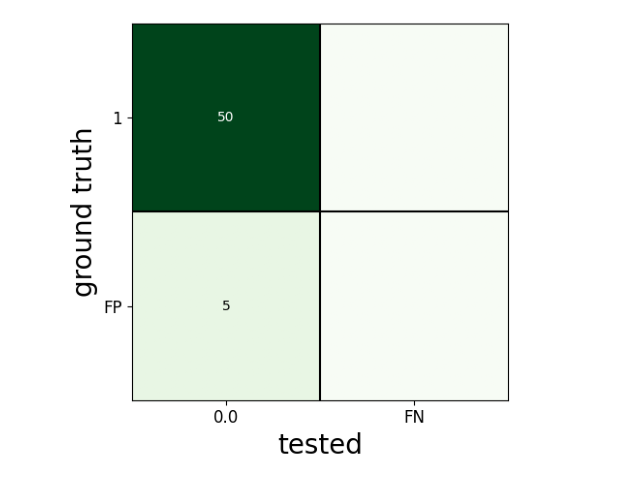

Time:


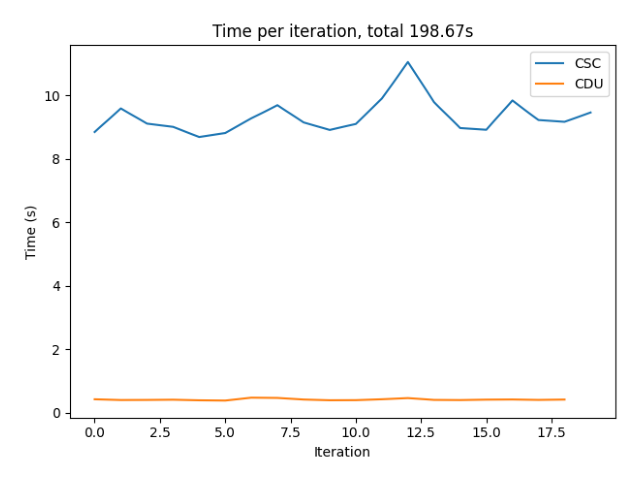

In [14]:
path = f"outputs/spikeforest_experiments/experiment_sandbox/single/interp_1_10/seed_None"
helper.show_plots(path, num_elements=1, show_confusion_train=True)

In fact, a post processing splitting units would be necessary.

In [21]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np

[ 0 11 22 33 44 55 66 77 88 99]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71
 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95
 96 97 98 99]
22


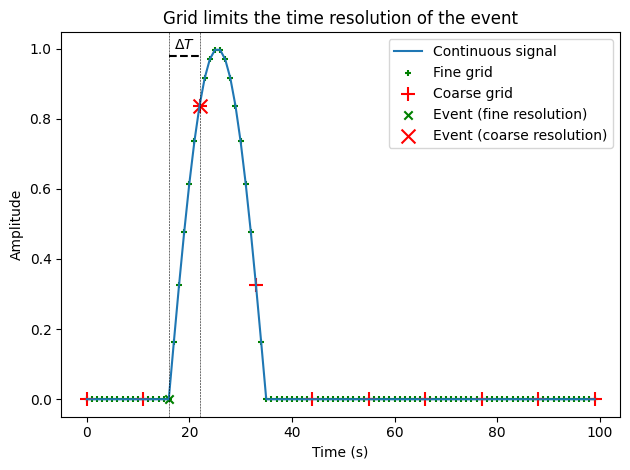

In [70]:
def event_curve(x, idx):
    y = np.zeros(100)
    length = 20
    y[idx:idx+length] = -np.cos(np.linspace(np.pi/2, 3*np.pi/2, length))
    return y[x]

idx = 16
x = np.linspace(0, 99, 100).astype(int)
plt.plot(event_curve(x, idx), label='Continuous signal')
coarse_grid = np.linspace(0, 99, 10).astype(int)
fine_grid = np.linspace(0, 99, 100).astype(int)
plt.scatter(fine_grid, event_curve(fine_grid, idx), color="green", marker='+', label='Fine grid', s=20)
plt.scatter(coarse_grid, event_curve(coarse_grid, idx), color="red", marker='+', label='Coarse grid', s=100)

print(coarse_grid)
print(fine_grid)
print((idx//11+1)*11)
idx_coarse = (idx//11+1)*11
plt.scatter([idx], [event_curve(idx, idx)], color="green", label='Event (fine resolution)', marker='x')
plt.scatter([(idx//11+1)*11], [event_curve((idx//11+1)*11, idx)], color="red", label='Event (coarse resolution)', marker='x', s=100)

# draw line between the two idx and add time error text
plt.axvline(idx, color="black", linestyle="--", linewidth=0.4)
plt.axvline(idx_coarse, color="black", linestyle="--", linewidth=0.4)
value_coarse = event_curve((idx//11+1)*11, idx)
plt.plot([idx, idx_coarse], [0.98,0.98], color="black", linestyle="--")
plt.text((idx+idx_coarse)/2, 1, f"$\Delta T$", horizontalalignment='center')

plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.title("Grid limits the time resolution of the event")

plt.legend()
plt.tight_layout()
plt.savefig("grid_error.png")
